# Imports and Paths

In [1]:
# Import some shared libraries
import os
import dask.distributed as dd
import dask
import numpy as np
import pandas as pd
import xarray as xr
import tobac
import glob
import datetime as dt
import matplotlib.pyplot as plt
from shared_plotting import *
from shared_model_params import get_rams_output, dz, combine_tobac_list, alt

In [2]:
from shared_plotting import *
from shared_model_params import (
    get_rams_output,
    combine_tobac_list,
    save_files,
)

In [3]:
anaPath = "/squall/gleung/borneolcc-analysis/"

In [4]:
def add_legend(
    ax,
    handles="None",
    ncols=None,
    loc=None,
    bbox_to_anchor=None,
    title=None,
    handlelength=0,
):

    if handles != "None":
        leg = ax.legend(
            handles=handles,
            ncols=ncols,
            loc=loc,
            bbox_to_anchor=bbox_to_anchor,
            title=title,
            handlelength=handlelength,
        )
    else:
        leg = ax.legend(
            bbox_to_anchor=bbox_to_anchor,
        )

    handles, labels = leg.axes.get_legend_handles_labels()
    texts = leg.get_texts()

    for (
        h,
        text,
    ) in zip(handles, texts):
        try:
            text.set_color(h.get_facecolor()[0])
        except:
            text.set_color(h.get_color())

In [5]:
rver = "rte"

# Figure 1: SEB 

## Full timeseries

<>:74: SyntaxWarning: invalid escape sequence '\c'
<>:74: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_3044585/98267502.py:74: SyntaxWarning: invalid escape sequence '\c'
  ax.set_ylabel("$^{\circ}$C")
/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


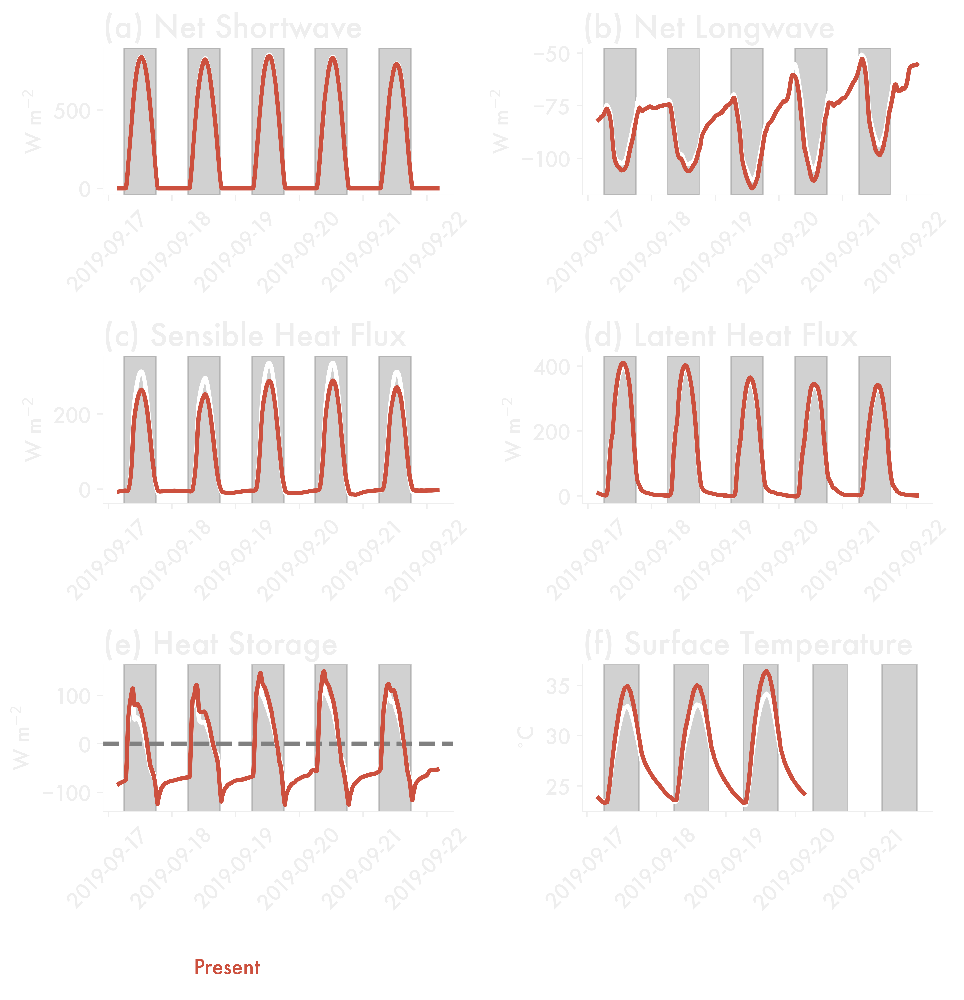

In [7]:
fig, axes = plt.subplots(3, 2, figsize=(8, 9))
axes = axes.flatten()

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(f"{anaPath}/seb/land_alltimes_{lcver}_{rver}-.h5")

    ds = ds.where(
        ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True
    ).compute()

    stemp = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/surftemp-{lcver}.nc"
    )

    for ax, var, title in zip(
        axes,
        ["swnet", "lwnet", "shf", "lhf", "g", "stemp"],
        [
            "(a) Net Shortwave",
            "(b) Net Longwave",
            "(c) Sensible Heat Flux",
            "(d) Latent Heat Flux",
            "(e) Heat Storage",
            "(f) Surface Temperature",
        ],
    ):
        if var == "stemp":
            ax.plot(
                [
                    pd.to_datetime("2019-09-17 04:00")
                    + dt.timedelta(hours=t.astype("float"))
                    for t in stemp.t.values
                ],
                stemp.SOIL_TEMP.values,
                color=col,
                label=label,
            )
        else:
            ax.plot(ds.local_time, ds[var], color=col, label=label)

        ax.set_title(title)

        if var == "g":
            ax.axhline(0, ls="--", color="gray", zorder=0)

        for d in [
            "2019-09-17",
            "2019-09-18",
            "2019-09-19",
            "2019-09-20",
            "2019-09-21",
        ]:

            ax.axvspan(
                pd.to_datetime(f"{d} 06:00"),
                pd.to_datetime(f"{d} 18:00"),
                zorder=0,
                color="gray",
                alpha=0.2,
            )

        ax.tick_params(axis="x", labelrotation=45)

        if ax != axes[-1]:
            ax.set_ylabel("W m$^{-2}$")
        else:
            ax.set_ylabel("$^{\circ}$C")

add_legend(axes[-2], bbox_to_anchor=(0.5, -0.7))
plt.tight_layout()
plt.show()
plt.close("all")

## SEB Diurnal Cycle

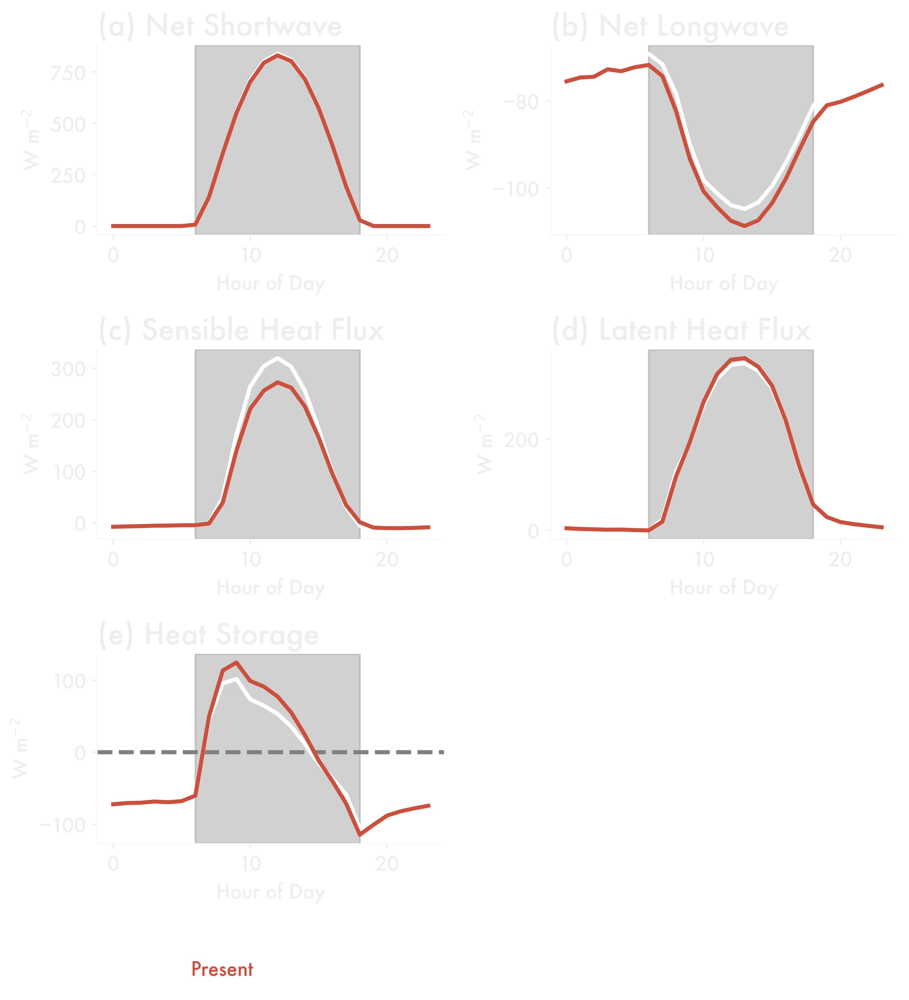

In [8]:
rver = "rte"

fig, axes = plt.subplots(3, 2, figsize=(8, 9))
axes = axes.flatten()

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/seb/land_diurn_{lcver}_{rver}-.h5"
    ).compute()

    for ax, var, title in zip(
        axes,
        ["swnet", "lwnet", "shf", "lhf", "g"],
        [
            "(a) Net Shortwave",
            "(b) Net Longwave",
            "(c) Sensible Heat Flux",
            "(d) Latent Heat Flux",
            "(e) Heat Storage",
        ],
    ):
        ax.plot(ds.hour, ds[var], color=col, label=label)

        ax.set_title(title)

        if var == "g":
            ax.axhline(0, ls="--", color="gray", zorder=0)

        ax.axvspan(
            6,
            18,
            zorder=0,
            color="gray",
            alpha=0.2,
        )

        ax.set_ylabel("W m$^{-2}$")

        ax.set_xlabel("Hour of Day")

    axes[-1].axis("off")

add_legend(axes[-2], bbox_to_anchor=(0.5, -0.4))
plt.tight_layout()
plt.show()
plt.close("all")

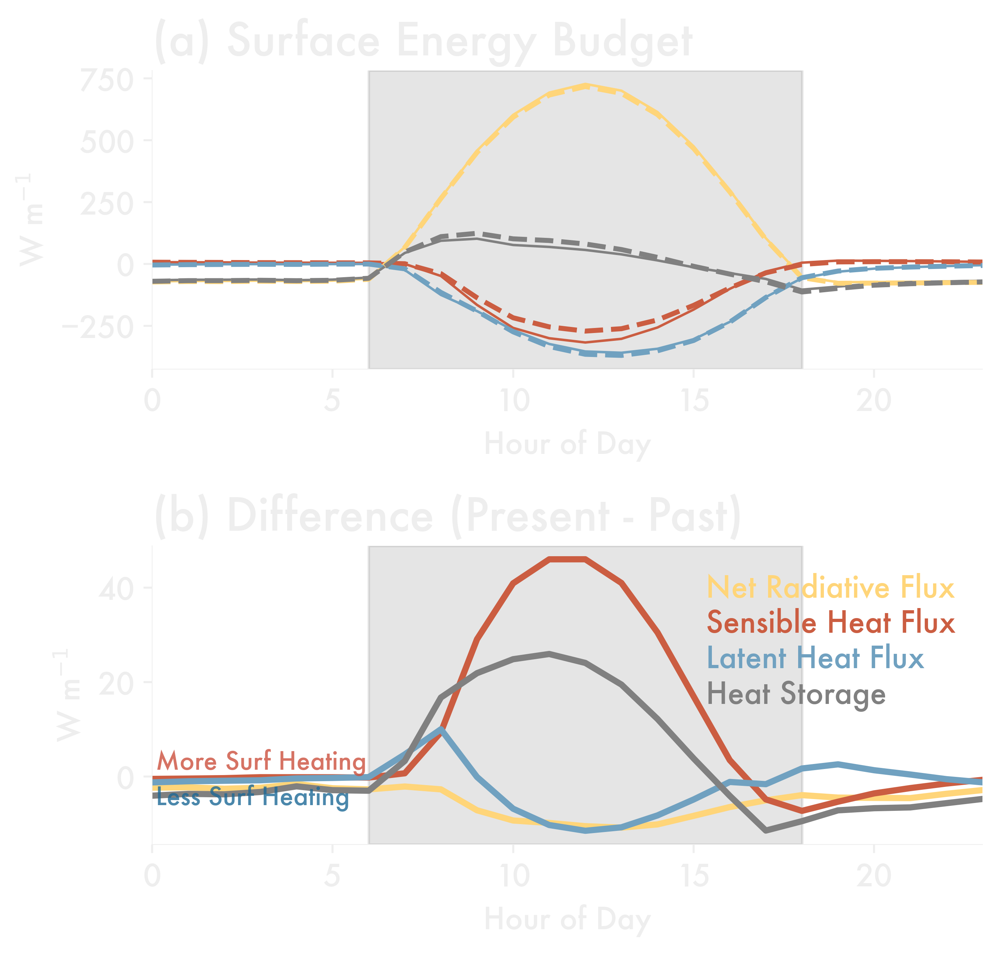

In [6]:
fig, axes = plt.subplots(2, 1, figsize=(5.75, 5.5))

for lcver, ls, lw in zip(["lc1960", "lc2019"], ["-", "--"], [1, 2]):
    ds = xr.open_dataset(
        f"{anaPath}/seb/land_diurn_{lcver}_{rver}.h5"
    ).compute()

    if lcver == "lc1960":
        diff = ds.copy()
    else:
        diff = ds - diff

    axes[0].plot(ds.hour, ds.swnet + ds.lwnet, ls=ls, color="#FFD579", lw=lw)
    axes[0].plot(ds.hour, -ds.shf, ls=ls, color="#CB5D41", lw=lw)
    axes[0].plot(ds.hour, -ds.lhf, ls=ls, color="#70A1C0", lw=lw)
    axes[0].plot(ds.hour, ds.g, ls=ls, color="gray", lw=lw)

axes[1].plot(
    ds.hour,
    diff.swnet + diff.lwnet,
    color="#FFD579",
    label="Net Radiative Flux",
)
axes[1].plot(ds.hour, -diff.shf, color="#CB5D41", label="Sensible Heat Flux")
axes[1].plot(ds.hour, -diff.lhf, color="#70A1C0", label="Latent Heat Flux")
axes[1].plot(ds.hour, diff.g, color="gray", label="Heat Storage")

axes[1].text(
    0.1,
    1.5,
    "More Surf Heating",
    color=red,
    fontsize=10,
    alpha=0.8,
)
axes[1].text(
    0.1,
    -6,
    "Less Surf Heating",
    color=blue,
    fontsize=10,
    alpha=0.8,
)


for ax in axes:
    ax.axhline(0, zorder=0, lw=1, ls=":", color="white")
    ax.set_ylabel("W m$^{-1}$")
    ax.set_xlabel("Hour of Day")

    ax.axvspan(
        6,
        18,
        zorder=0,
        color="gray",
        alpha=0.2,
    )
    ax.set_xlim(0, 23)

add_legend(axes[1])
axes[0].set_title("(a) Surface Energy Budget")
axes[1].set_title("(b) Difference (Present - Past)")

plt.tight_layout()
plt.show()
plt.close("all")

# Figure 2: Surface Temperatures

## Full Timeseries

<>:85: SyntaxWarning: invalid escape sequence '\c'
<>:85: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_2805396/4029589938.py:85: SyntaxWarning: invalid escape sequence '\c'
  ax.set_ylabel("$^{\circ}$C")


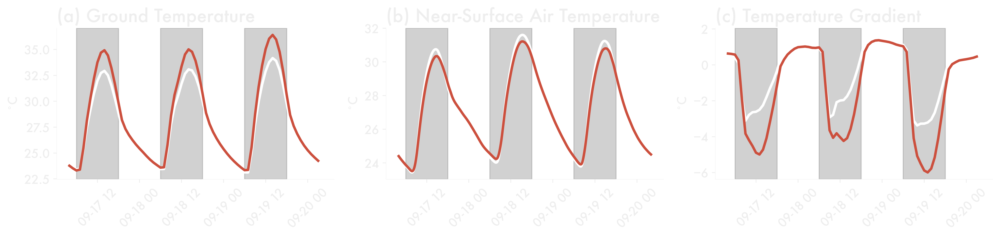

In [54]:
rver = "rte"

fig, axes = plt.subplots(1, 3, figsize=(14, 3.5), sharex=True)
axes = axes.flatten()

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_all_{lcver}_rte.h5", engine="h5netcdf"
    )[["TEMP"]]

    ds["TEMP"] = ds.TEMP - 273.15

    ds = (
        ds.where(ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True)
        .sel(z=1)
        .compute()
    )

    ds = ds.assign(
        local_time=[
            pd.to_datetime(t) + dt.timedelta(hours=8) for t in ds.t.values
        ]
    )

    stemp = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/surftemp-{lcver}.nc"
    )

    diff = ds.TEMP[:-1:12] - stemp.SOIL_TEMP

    for ax, var, title in zip(
        axes,
        ["stemp", "airtemp", "diff"],
        [
            "(a) Ground Temperature",
            "(b) Near-Surface Air Temperature",
            "(c) Temperature Gradient",
        ],
    ):
        if var == "stemp":
            ax.plot(
                [
                    pd.to_datetime("2019-09-17 04:00")
                    + dt.timedelta(hours=t.astype("float"))
                    for t in stemp.t.values
                ],
                stemp.SOIL_TEMP.values,
                color=col,
                label=label,
            )
        elif var == "diff":
            ax.plot(
                [
                    pd.to_datetime("2019-09-17 04:00")
                    + dt.timedelta(hours=t.astype("float"))
                    for t in stemp.t.values
                ],
                diff,
                color=col,
                label=label,
            )
        else:
            ax.plot(ds.local_time, ds.TEMP, color=col, label=label)

        for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:

            ax.axvspan(
                pd.to_datetime(f"{d} 06:00"),
                pd.to_datetime(f"{d} 18:00"),
                zorder=0,
                color="gray",
                alpha=0.2,
            )

        ax.tick_params(axis="x", labelrotation=45)
        ax.set_title(title)

        ax.set_ylabel("$^{\circ}$C")

# add_legend(axes[-2], bbox_to_anchor=(0.5, -0.7))
plt.tight_layout()
plt.show()
plt.close("all")

## Dirunal

<>:91: SyntaxWarning: invalid escape sequence '\c'
<>:91: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_2817544/3137264602.py:91: SyntaxWarning: invalid escape sequence '\c'
  ax.set_ylabel("$^{\circ}$C")


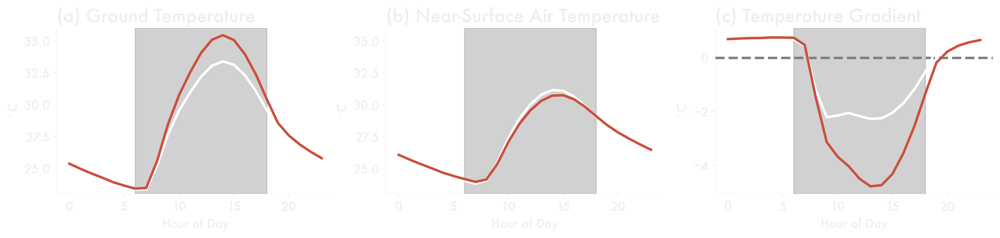

In [ ]:
rver = "rte"

fig, axes = plt.subplots(1, 3, figsize=(14, 3.5), sharex=True)
axes = axes.flatten()

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_all_{lcver}_rte.h5", engine="h5netcdf"
    )[["TEMP"]]

    ds["TEMP"] = ds.TEMP - 273.15

    ds = (
        ds.where(ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True)
        .sel(z=1)
        .compute()
    )

    ds = ds.assign(
        local_time=(
            "t",
            [pd.to_datetime(t) + dt.timedelta(hours=8) for t in ds.t.values],
        )
    )

    ds = ds.groupby(ds.local_time.dt.hour).mean()

    stemp = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/surftemp-{lcver}.nc"
    )
    stemp = stemp.assign(
        local_time=(
            "t",
            [
                pd.to_datetime("2019-09-17 04:00")
                + dt.timedelta(hours=t.astype("float"))
                for t in stemp.t.values
            ],
        )
    )

    stemp = stemp.groupby(stemp.local_time.dt.hour).mean()

    diff = ds.TEMP - stemp.SOIL_TEMP

    for ax, var, title in zip(
        axes,
        ["stemp", "airtemp", "diff"],
        [
            "(a) Ground Temperature",
            "(b) Near-Surface Air Temperature",
            "(c) Temperature Gradient",
        ],
    ):
        if var == "stemp":
            ax.plot(
                stemp.hour,
                stemp.SOIL_TEMP.values,
                color=col,
                label=label,
            )
            ax.set_ylim(23, 36)
        elif var == "diff":
            ax.plot(
                stemp.hour,
                diff,
                color=col,
                label=label,
            )
        else:
            ax.plot(ds.hour, ds.TEMP, color=col, label=label)
            ax.set_ylim(23, 36)

        ax.axvspan(
            6,
            18,
            zorder=0,
            color="gray",
            alpha=0.2,
        )

        ax.set_title(title)

        ax.set_ylabel("$^{\circ}$C")
        ax.set_xlabel("Hour of Day")

axes[-1].axhline(0, color="gray", ls="--", zorder=0)
plt.tight_layout()
plt.show()
plt.close("all")

In [ ]:
past = xr.open_dataset(f"/squall/gleung/borneolcc-analysis/surftemp-lc1960.nc")
pres = xr.open_dataset(f"/squall/gleung/borneolcc-analysis/surftemp-lc2019.nc")

plt.plot(pres.SOIL_TEMP - past.SOIL_TEMP)
plt.axhline(0)

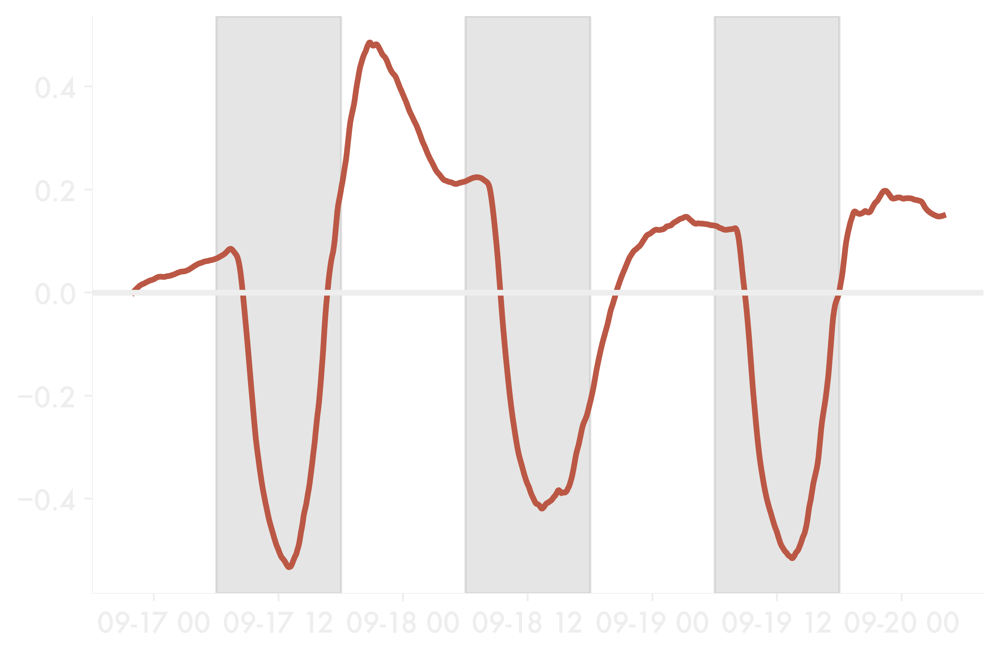

In [ ]:
past = xr.open_dataset(
    f"{anaPath}/radprof/land_alltimes_all_lc1960_rte.h5", engine="h5netcdf"
)[["TEMP", "local_time"]]

past["TEMP"] = past.TEMP - 273.15
past = past.sel(z=1).compute()

pres = xr.open_dataset(
    f"{anaPath}/radprof/land_alltimes_all_lc2019_rte.h5", engine="h5netcdf"
)[["TEMP", "local_time"]]

pres["TEMP"] = pres.TEMP - 273.15
pres = pres.sel(z=1).compute()

plt.plot(pres.local_time, pres.TEMP - past.TEMP)
plt.axhline(0)

for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:

    plt.axvspan(
        pd.to_datetime(f"{d} 06:00"),
        pd.to_datetime(f"{d} 18:00"),
        zorder=0,
        color="gray",
        alpha=0.2,
    )

# Figure 3: Cloud Fraction

In [ ]:
print(list(pcp.keys()))

['pcp']


/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


## Full timeseries

/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


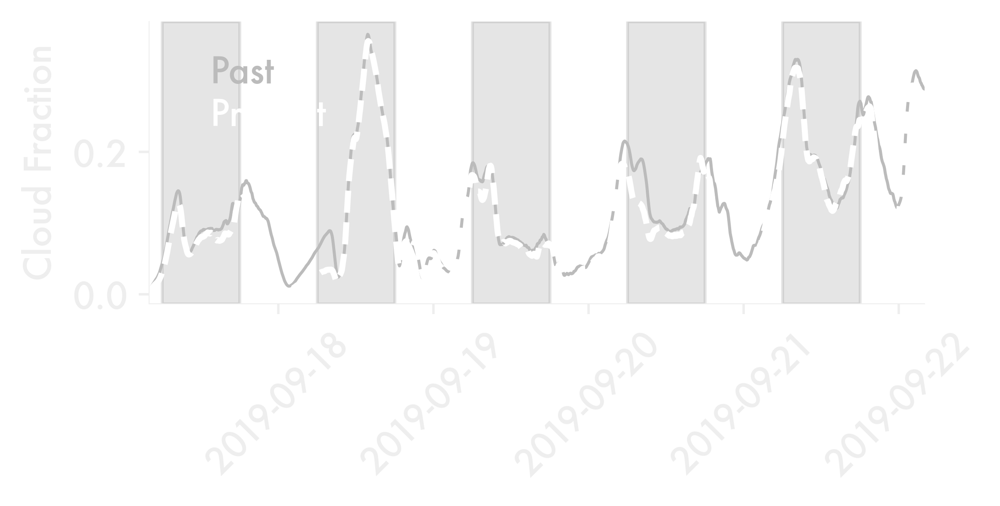

In [13]:
subver = "cldcol"

fig, ax = plt.subplots(1, 1, figsize=(4, 1.5), sharex=True)

for lcver, ls, lw, label, col in zip(
    ["lc1960", "lc2019"],
    [
        "-",
        "--",
    ],
    [1, 2],
    ["Past", "Present"],
    ["#BBBBBB", lcol],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )[["CFRAC_col"]]

    pcp = xr.open_dataset(
        f"{anaPath}/seb/land_alltimes_{lcver}_rte-.h5",
        engine="h5netcdf",
        chunks="auto",
    )[["pcp"]]

    pcp = pcp.sel(time=slice(6 * 12, -1)).pcp

    ds = ds.assign(
        local_time=(
            "t",
            [pd.to_datetime(t) + dt.timedelta(hours=8) for t in ds.t.values],
        )
    )

    ds = ds.where(ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True)

    ds = ds.assign(CFRAC=ds.CFRAC_col / ((2100 - 50) * (2180 - 50)))

    ds = ds.compute()

    ax.plot(ds.local_time, ds.CFRAC, color=col, ls=ls, lw=lw, label=label)
    """axes[1].plot(
        [pd.to_datetime(t) + dt.timedelta(hours=8) for t in pcp.t.values],
        pcp,
        color=col,
        ls=ls,
        lw=lw,
        label=label,
    )"""

for ax, lab in zip([ax], ["Cloud Fraction", "Surface Precipitation"]):
    for d in [
        "2019-09-17",
        "2019-09-18",
        "2019-09-19",
        "2019-09-20",
        "2019-09-21",
    ]:

        ax.axvspan(
            pd.to_datetime(f"{d} 06:00"),
            pd.to_datetime(f"{d} 18:00"),
            zorder=0,
            color="gray",
            alpha=0.2,
        )

    ax.tick_params(axis="x", labelrotation=45)

    ax.set_xlim(
        pd.to_datetime("2019-09-17 04:00"), pd.to_datetime("2019-09-22 04:00")
    )

    ax.set_ylabel(lab)

add_legend(ax)
plt.savefig("/squall/gleung/borneolcc-figures/cldfrac.png")
plt.show()
plt.close("all")

## Diurnal

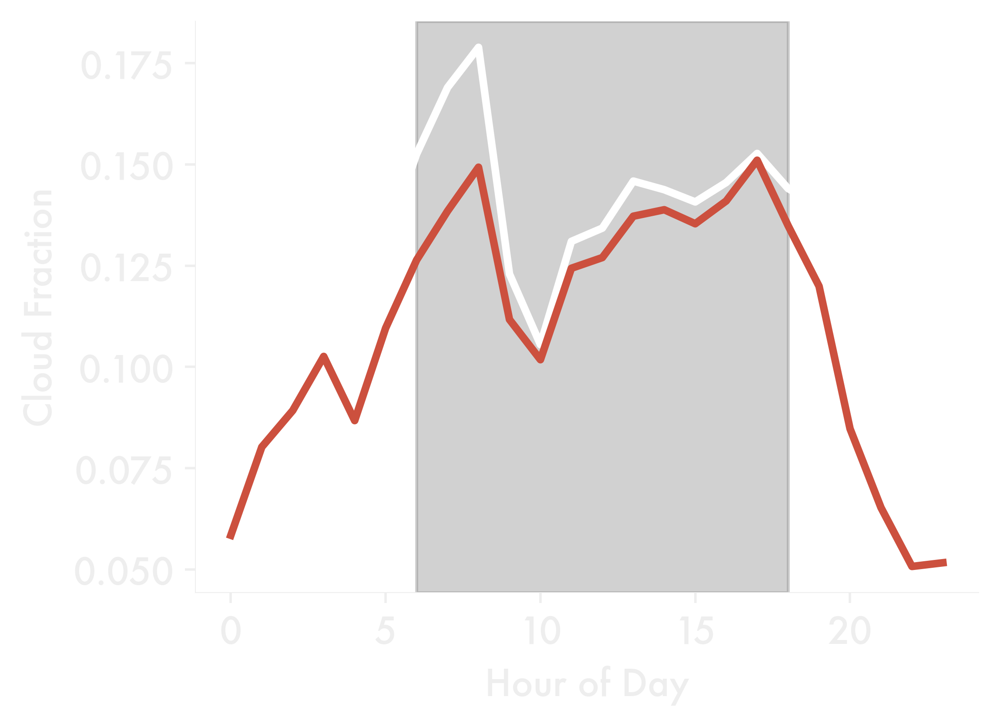

In [16]:
subver = "cldcol"

fig, ax = plt.subplots(1, 1, figsize=(4, 3))

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )[["CFRAC_col"]]

    ds = ds.assign(
        local_time=(
            "t",
            [pd.to_datetime(t) + dt.timedelta(hours=8) for t in ds.t.values],
        )
    )

    ds = ds.where(ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True)

    ds = ds.assign(CFRAC=ds.CFRAC_col / ((2100 - 50) * (2180 - 50)))

    ds = ds.compute()

    ds = ds.groupby(ds.local_time.dt.hour).mean()

    ax.plot(ds.hour, ds.CFRAC, color=col, label=label)

    ax.axvspan(
        6,
        18,
        zorder=0,
        color="gray",
        alpha=0.2,
    )


ax.set_ylabel("Cloud Fraction")
ax.set_xlabel("Hour of Day")

plt.show()
plt.close("all")

# Figure 4:  BLH

## Preliminaries

In [197]:
import metpy.calc as mpcalc
from metpy.units import units as units

In [ ]:
from copy import deepcopy


def smooth(val, span):
    """Function that calculates the moving average with a given span.
    The span is given in number of points on which the average is made.

    Parameters
    ----------
    val: array-like
        Array of values
    span: int
        Span of the moving average. The higher the smoother

    Returns
    -------
    smoothed_val: array-like
        Array of smoothed values

    See also
    --------
    [`bottleneck.move_mean`](https://bottleneck.readthedocs.io/en/latest/reference.html#bottleneck.move_mean),
    [`scipy.ndimage.uniform_filter1d`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.uniform_filter1d.html#scipy.ndimage.uniform_filter1d),
    [`pandas.DataFrame.rolling`](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rolling.html)
    """
    n = len(val)
    smoothed_val = deepcopy(val)
    for i in range(n):
        smoothed_val[i] = np.nanmean(
            val[i - min(span, i) : i + min(span, n - i)]
        )

    return smoothed_val

In [ ]:
def blh_from_concentration_gradient(
    height,
    concentration_profile,
    smoothingspan: int = 5,
    idxfoot: int = 0,
):
    """Calculate atmospheric boundary layer height from a concentration
    profile (specific/relative humidity, aerosol backscatter, TKE..)

    It is the height where the gradient of the concentration profile reaches a minimum.
    Well indicated for stable boundary layers. See [Sei00, HL06, Col14].

    Parameters
    ----------
    height : `pint.Quantity`
        Altitude (metres above ground) of the points in the profile
    concentration_profile : `pint.Quantity`
        Concentration profile (specific/relative humidity, aerosol backscatter, TKE..)
    smoothingspan : int, optional
        The amount of smoothing (number of points in moving average)
    idxfoot : int, optional
        The index of the foot point (first trusted measure), defaults to 0.

    Returns
    -------
    blh : `pint.Quantity`
        Boundary layer height estimation
    """
    dcdz = mpcalc.first_derivative(
        smooth(concentration_profile, smoothingspan), x=height
    )
    dcdz = dcdz[idxfoot:]
    height = height[idxfoot:]
    iblh = np.argmin(dcdz)

    return height[iblh]

In [ ]:
for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )[["RV", "local_time"]]

    b = []

    for t in range(len(ds.t.values)):
        b.append(
            blh_from_concentration_gradient(
                alt[1:] * units.meters, ds.RV.isel(t=t).values
            ).magnitude
        )

    ds = ds.assign(BLH=("t", pd.Series(b).rolling(12, center=True).mean()))

    # ds = ds.where(ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True)

    ds.to_netcdf(f"{anaPath}/blh_{subver}_{lcver}_rte.h5")

In [240]:
print(ds)

<xarray.Dataset>
Dimensions:     (t: 937, z: 105)
Coordinates:
  * t           (t) datetime64[ns] 2019-09-16T14:00:00 ... 2019-09-19T20:00:00
Dimensions without coordinates: z
Data variables:
    RV          (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    local_time  (t) datetime64[ns] dask.array<chunksize=(937,), meta=np.ndarray>
    BLH         (t) float64 nan nan nan nan nan nan ... nan nan nan nan nan


## Full Timeseries

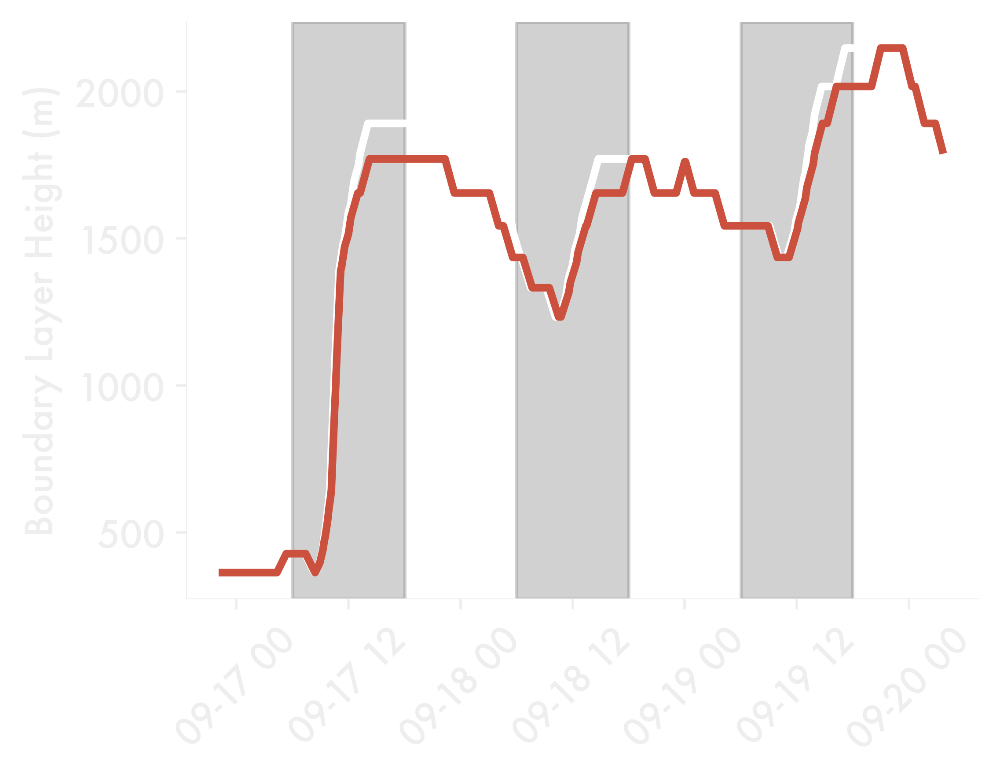

In [ ]:
subver = "all"

fig, ax = plt.subplots(1, 1, figsize=(4, 3))

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/blh_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )

    ax.plot(ds.local_time, ds.BLH, color=col, label=label)

    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        ax.axvspan(
            pd.to_datetime(f"{d} 06:00"),
            pd.to_datetime(f"{d} 18:00"),
            zorder=0,
            color="gray",
            alpha=0.2,
        )

    ax.tick_params(axis="x", labelrotation=45)

ax.set_ylabel("Boundary Layer Height (m)")

plt.show()
plt.close("all")

## Diurnal

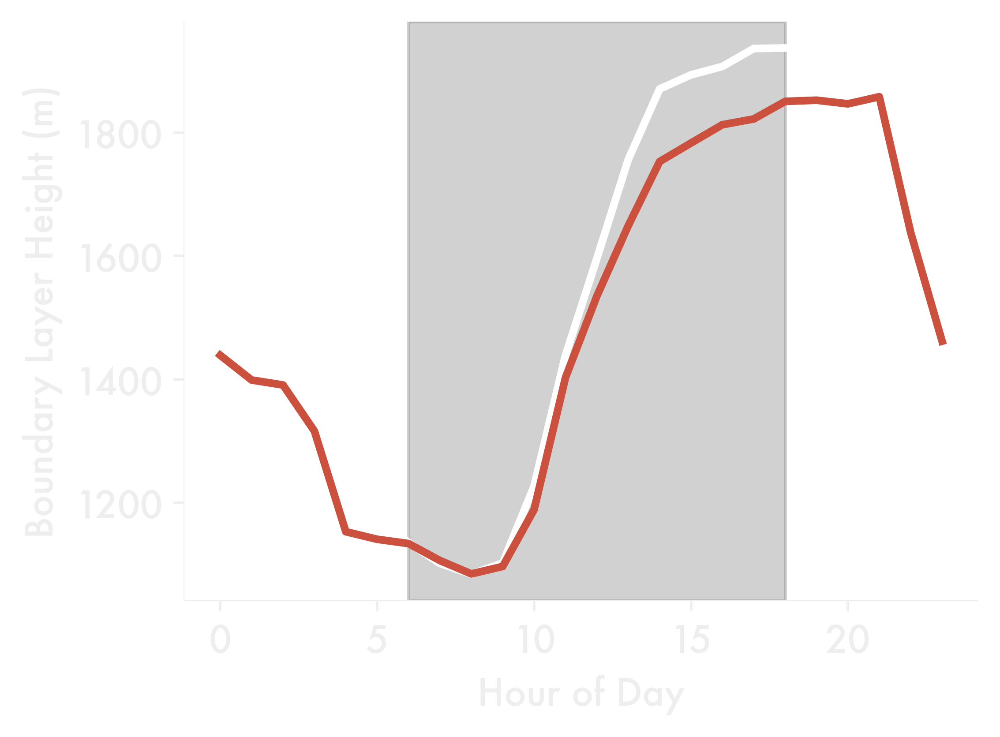

In [242]:
subver = "all"

fig, ax = plt.subplots(1, 1, figsize=(4, 3))

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/blh_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )

    ds = ds.groupby(ds.local_time.dt.hour).mean()

    ax.plot(ds.hour, ds.BLH, color=col, label=label)

    ax.axvspan(
        6,
        18,
        zorder=0,
        color="gray",
        alpha=0.2,
    )


ax.set_ylabel("Boundary Layer Height (m)")
ax.set_xlabel("Hour of Day")

plt.show()
plt.close("all")

# Tobac BLH

In [ ]:
def first_nonnan(d):
    d = d.dropna()
    return d.iloc[0]

In [ ]:
for lcver in ["lc1960", "lc2019"]:
    ds = xr.open_dataset(
        f"{anaPath}/blh_all_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )

    tracks = pd.read_parquet(
        f"{anaPath}/tobac/{lcver}_rte/cloud_footprint_statistics.pq"
    )

    tracks["cellinit_CBH"] = tracks.groupby("cell").CBH.transform(first_nonnan)

    ds = ds.BLH.to_dataframe().dropna()
    tracks["BLH"] = tracks.time.map(ds.BLH) / 1000
    tracks["BL_flag"] = tracks.cellinit_CBH <= tracks.BLH
    tracks["cellmin_CBH"] = tracks.groupby("cell").CBH.transform("min")
    tracks["cell_BL_flag_init"] = tracks.groupby("cell").BL_flag.transform(
        "first"
    )
    tracks["cell_BL_flag_max"] = tracks.groupby("cell").BL_flag.transform("max")
    tracks["cell_BL_flag_strict"] = tracks.groupby("cell").BL_flag.transform(
        "sum"
    )
    tracks["count_cell"] = tracks.groupby("cell").feature.transform("count")
    tracks["perc_BL_flag"] = tracks.cell_BL_flag_strict / tracks.count_cell

    tracks["BL_flag2"] = (tracks.ztn / 1000) <= tracks.BLH
    tracks["cell_BL_flag2_init"] = tracks.groupby("cell").BL_flag2.transform(
        "first"
    )

    tracks.to_parquet(f"{anaPath}/tobac/{lcver}_rte/final_cloud_statistics.pq")

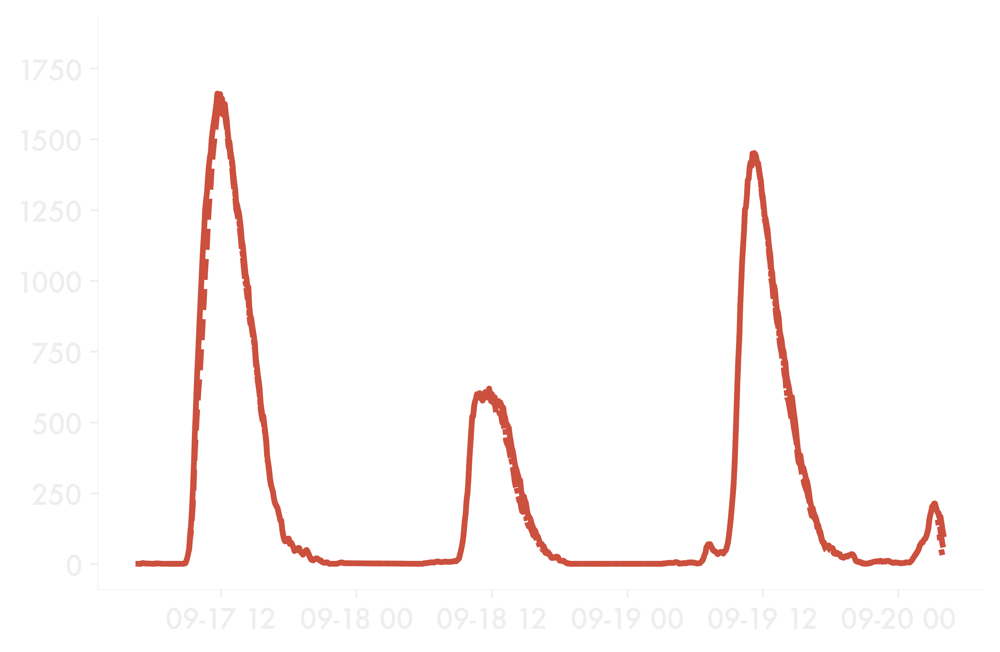

In [ ]:
for lcver, col in zip(["lc1960", "lc2019"], [lcol, red]):
    tracks = pd.read_parquet(
        f"{anaPath}/tobac/{lcver}_rte/final_cloud_statistics.pq"
    )

    plt.plot(tracks.groupby("local_time").feature.count(), color=col)
    # plt.plot(tracks[tracks.cell_BL_flag_max].groupby('local_time').feature.count(),color=col,ls='--')
    plt.plot(
        tracks[tracks.cell_BL_flag_init].groupby("local_time").feature.count(),
        color=col,
        ls="--",
    )
    plt.plot(
        tracks[tracks.perc_BL_flag >= 0.5]
        .groupby("local_time")
        .feature.count(),
        color=col,
        ls=":",
    )

### Thermals

In [ ]:
for lcver in ["lc1960", "lc2019"]:
    ds = xr.open_dataset(
        f"{anaPath}/blh_all_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )

    tracks = pd.read_parquet(f"{anaPath}/tobac/{lcver}_rte/all_thermals.pq")

    ds = ds.BLH.to_dataframe().dropna()
    tracks["BLH"] = tracks.time.map(ds.BLH) / 1000
    tracks["BL_flag"] = (tracks.ztn / 1000) <= tracks.BLH
    tracks["cell_BL_flag_init"] = tracks.groupby("cell").BL_flag.transform(
        "first"
    )

    tracks.to_parquet(f"{anaPath}/tobac/{lcver}_rte/all_thermals.pq")

Index(['time', 'cell', 'frame', 'idx', 'vdim', 'hdim_1', 'hdim_2', 'num',
       'threshold_value', 'feature', 'timestr', 'z', 'y', 'x', 'ztn', 'lat',
       'lon', 'time_cell', 'lifetime', 'w_ncells', 'cond_ncells',
       'cellmax_wncells', 'cellmax_condncells', 'local_time'],
      dtype='object')
Index(['time', 'cell', 'frame', 'idx', 'vdim', 'hdim_1', 'hdim_2', 'num',
       'threshold_value', 'feature', 'timestr', 'z', 'y', 'x', 'ztn', 'lat',
       'lon', 'time_cell', 'lifetime', 'w_ncells', 'cond_ncells',
       'cellmax_wncells', 'cellmax_condncells', 'local_time'],
      dtype='object')


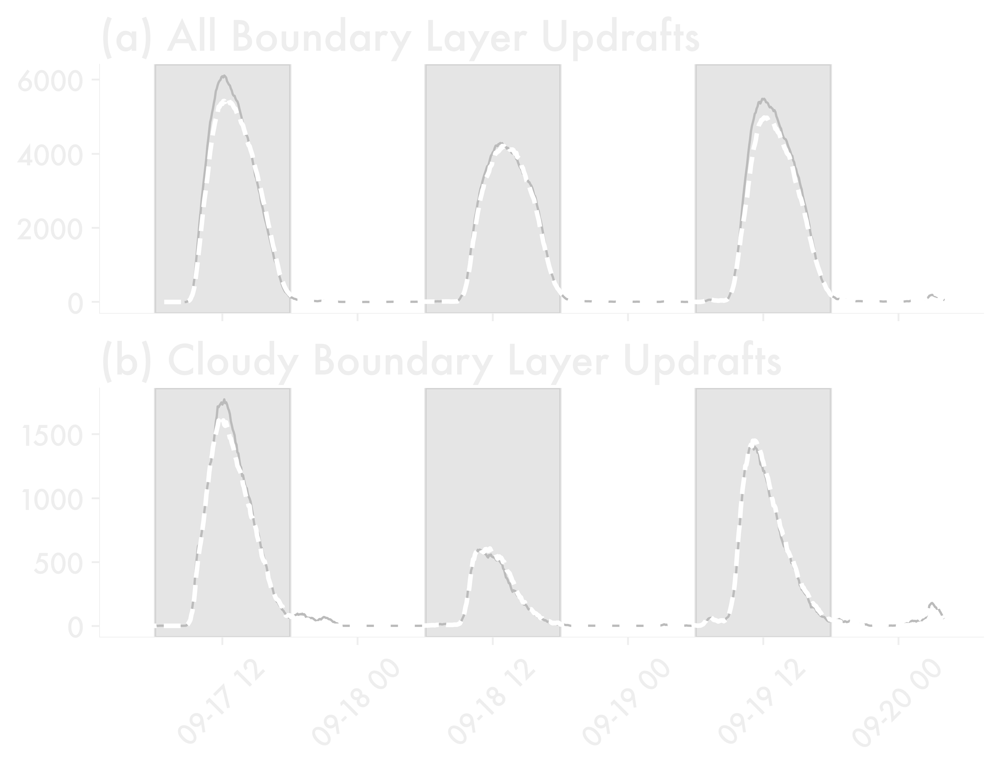

In [ ]:
fig, axes = plt.subplots(2, 1, sharex=True)

for lcver, lw, ls, col in zip(
    ["lc1960", "lc2019"], [1, 2], ["-", "--"], ["#BBBBBB", lcol]
):
    thermals = pd.read_parquet(f"{anaPath}/tobac/{lcver}_rte/all_thermals.pq")

    axes[0].plot(
        thermals[thermals.cell_BL_flag_init]
        .groupby("local_time")
        .feature.count(),
        lw=lw,
        ls=ls,
        color=col,
    )

    clds = pd.read_parquet(
        f"{anaPath}/tobac/{lcver}_rte/final_cloud_statistics.pq"
    )

    axes[1].plot(
        clds[clds.cell_BL_flag_init].groupby("local_time").feature.count(),
        lw=lw,
        ls=ls,
        color=col,
    )


axes[0].set_title("(a) All Boundary Layer Updrafts")
axes[1].set_title("(b) Cloudy Boundary Layer Updrafts")


for ax in axes:
    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        ax.axvspan(
            pd.to_datetime(f"{d} 06:00"),
            pd.to_datetime(f"{d} 18:00"),
            zorder=0,
            color="gray",
            alpha=0.2,
        )

    ax.tick_params(axis="x", labelrotation=45)

plt.show()

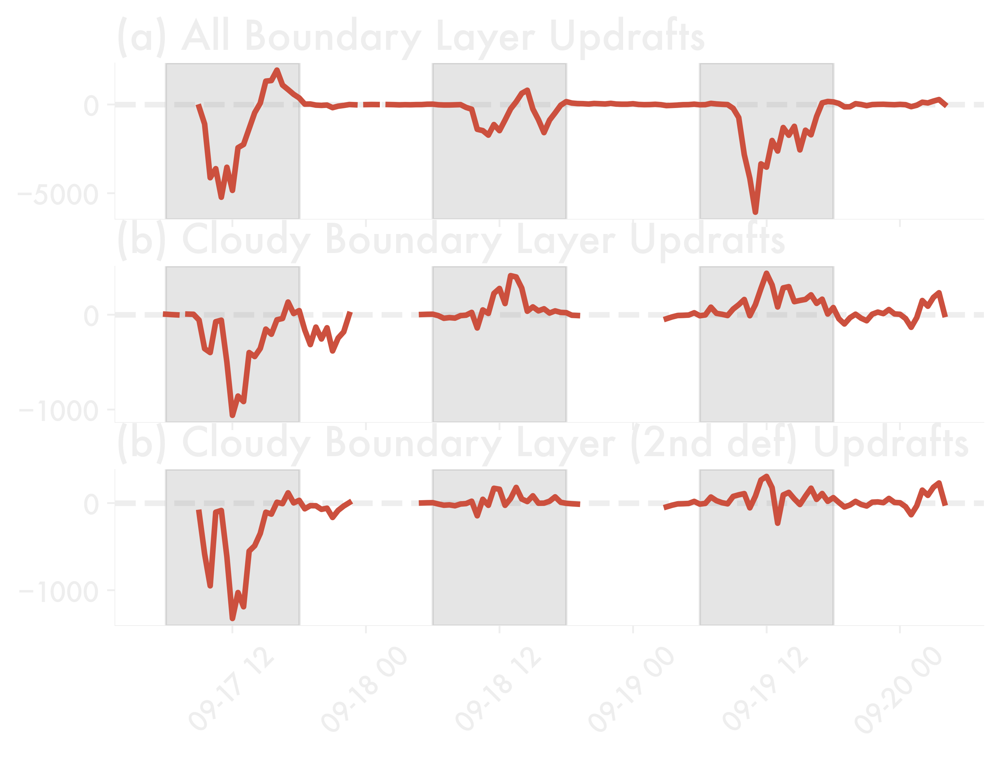

In [ ]:
fig, axes = plt.subplots(3, 1, sharex=True)

thermals = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/all_thermals.pq")
thermals = thermals[thermals.cell_BL_flag_init]
past_thermals = (
    thermals.groupby(thermals.local_time.dt.round("30min"))
    .feature.count()
    .copy()
)

thermals = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/all_thermals.pq")
thermals = thermals[thermals.cell_BL_flag_init]
pres_thermals = (
    thermals.groupby(thermals.local_time.dt.round("30min"))
    .feature.count()
    .copy()
)


axes[0].plot(pres_thermals - past_thermals, color=col)

clds = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")
clds = clds[clds.cell_BL_flag_init]
past_clds = (
    clds.groupby(clds.local_time.dt.round("30min")).feature.count().copy()
)

clds = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")
clds = clds[clds.cell_BL_flag_init]
pres_clds = (
    clds.groupby(clds.local_time.dt.round("30min")).feature.count().copy()
)

axes[1].plot(pres_clds - past_clds, color=col)


clds = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")
clds = clds[clds.cell_BL_flag2_init]
past_clds = (
    clds.groupby(clds.local_time.dt.round("30min")).feature.count().copy()
)

clds = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")
clds = clds[clds.cell_BL_flag2_init]
pres_clds = (
    clds.groupby(clds.local_time.dt.round("30min")).feature.count().copy()
)

axes[2].plot(pres_clds - past_clds, color=col)

axes[0].set_title("(a) All Boundary Layer Updrafts")
axes[1].set_title("(b) Cloudy Boundary Layer Updrafts")

axes[2].set_title("(b) Cloudy Boundary Layer (2nd def) Updrafts")

for ax in axes:
    ax.axhline(0, ls="--", zorder=0)

    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        ax.axvspan(
            pd.to_datetime(f"{d} 06:00"),
            pd.to_datetime(f"{d} 18:00"),
            zorder=0,
            color="gray",
            alpha=0.2,
        )

    ax.tick_params(axis="x", labelrotation=45)


plt.show()

Needto investigate my defn of a BL cloud

In [ ]:
clds = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

c1 = clds[clds.cell_BL_flag_init]
c2 = clds[clds.cell_BL_flag2_init]


print(len(c1), len(c2))

51446 208084


In [305]:
inter = c1.loc[[i for i in c1.index if i in c2.index]]
print(len(inter))

43987


In [ ]:
c2_only = c2.loc[[i for i in c2.index if i not in c1.index]]

In [ ]:
print(
    c2_only[
        [
            "condensate_volume",
            "CBH",
            "BLH",
            "CTH",
            "updraft_botalt",
            "updraft_topalt",
        ]
    ]
)

        condensate_volume       CBH       BLH       CTH  updraft_botalt  \
34               0.000000       NaN  0.389854       NaN        0.075745   
35               0.000000       NaN  0.389854       NaN        0.024755   
40               0.000000       NaN  0.400823       NaN        0.075745   
42               0.000000       NaN  0.400823       NaN        0.075745   
43               0.000000       NaN  0.400823       NaN        0.075745   
...                   ...       ...       ...       ...             ...   
217471           0.050334  1.137591       NaN  1.332418        1.137591   
217501           3.167016  0.300934       NaN  2.148284        0.300934   
217550           2.114918  0.362971       NaN  1.771063        0.300934   
217685           4.548282  0.362971       NaN  1.654869        0.362971   
217803          14.914399  0.362971       NaN  1.654869        0.427490   

        updraft_topalt  
34            0.427490  
35            0.427490  
40            0.564373  

In [299]:
print(len([i for i in c1.index if i not in c2.index]))
print(len([i for i in c2.index if i not in c1.index]))

7459


164097


## BL Clouds Diurnal Cycle

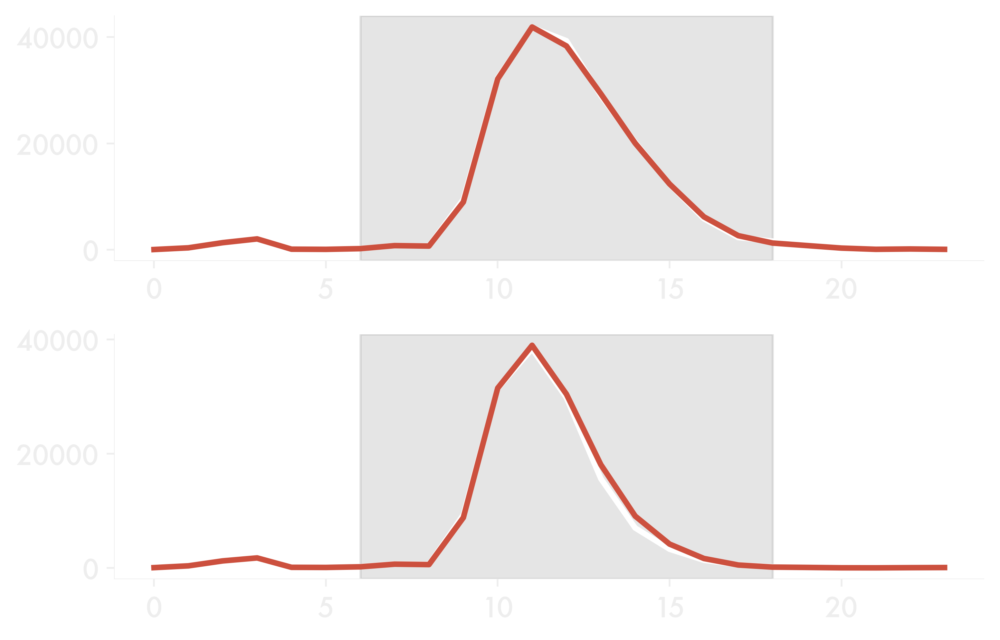

In [330]:
fig, axes = plt.subplots(2, 1)

for lcver, col in zip(["lc1960", "lc2019"], [lcol, red]):
    tracks = pd.read_parquet(
        f"{anaPath}/tobac/{lcver}_rte/final_cloud_statistics.pq"
    )

    tracks = tracks[tracks.cell_BL_flag_init]

    axes[0].plot(
        tracks.groupby(tracks.local_time.dt.hour).feature.count(), color=col
    )

    tracks = tracks[tracks.cellmax_CTH <= 3]
    axes[1].plot(
        tracks.groupby(tracks.local_time.dt.hour).feature.count(),
        color=col,
    )

for ax in axes:
    ax.axvspan(6, 18, zorder=0, alpha=0.2, color="gray")

## Diff

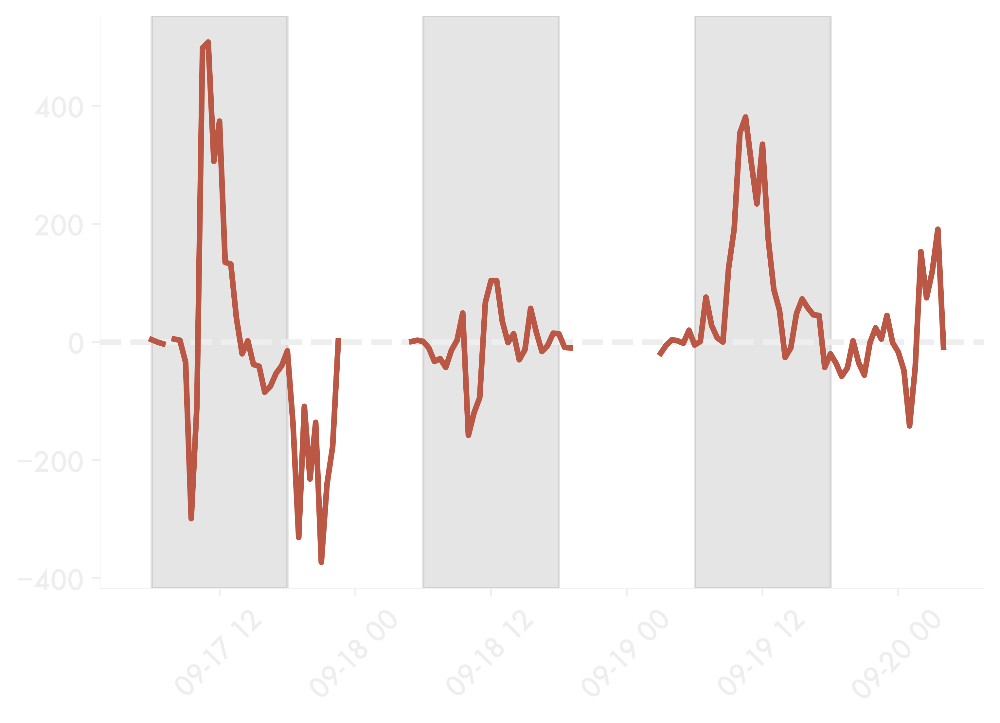

In [ ]:
fig, ax = plt.subplots(1, 1)

past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")
past = past[past.cell_BL_flag_init]

past = past.groupby(past.local_time.dt.round("30min")).feature.count()

pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")
pres = pres[pres.cell_BL_flag_init]
pres = pres.groupby(pres.local_time.dt.round("30min")).feature.count()

ax.plot(pres - past)
# ax.axvspan(6,18,zorder=0,alpha=0.2,color='gray')

for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
    ax.axvspan(
        pd.to_datetime(f"{d} 06:00"),
        pd.to_datetime(f"{d} 18:00"),
        zorder=0,
        color="gray",
        alpha=0.2,
    )

ax.tick_params(axis="x", labelrotation=45)

ax.axhline(0, ls="--", zorder=0)

I think the cells that initiate within the BL are the ones we should keep!

# Figure 5: Size Distribution

In [462]:
past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]
past = past.groupby("cell").first()
past = past[(past.local_time.dt.hour >= 9) & (past.local_time.dt.hour <= 15)]
past["ybin"] = pd.cut(
    past.cellmax_CTH, bins=alt[::5] / 1000
)  # np.linspace(0, 16, 33))

past["equiv_radius"] = (past.cond_footprint / np.pi) ** 0.5

num_past = past.groupby("ybin").feature.count()
cths = [x.mid for x in num_past.index.values]
area_past = past.groupby("ybin").cond_footprint.sum()
rad_past = past.groupby("ybin").equiv_radius.mean()
rad_past_s = past.groupby("ybin").equiv_radius.std()
pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]

pres = pres.groupby("cell").first()
pres = pres[(pres.local_time.dt.hour >= 9) & (pres.local_time.dt.hour <= 15)]

pres["equiv_radius"] = (pres.cond_footprint / np.pi) ** 0.5

pres["ybin"] = pd.cut(
    pres.cellmax_CTH, bins=alt[::5] / 1000
)  # np.linspace(0, 16, 33))

num_pres = pres.groupby("ybin").feature.count()
area_pres = pres.groupby("ybin").cond_footprint.sum()
rad_pres = pres.groupby("ybin").equiv_radius.mean()
rad_pres_s = pres.groupby("ybin").equiv_radius.std()

/tmp/ipykernel_2903810/323010969.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_past = past.groupby("ybin").feature.count()
/tmp/ipykernel_2903810/323010969.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_past = past.groupby("ybin").cond_footprint.sum()
/tmp/ipykernel_2903810/323010969.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  rad_past = past.groupby("ybin").equiv_radius.mean()
/tmp/ipykern

In [463]:
s = rad_pres_s + rad_past_s
n = num_pres + num_past

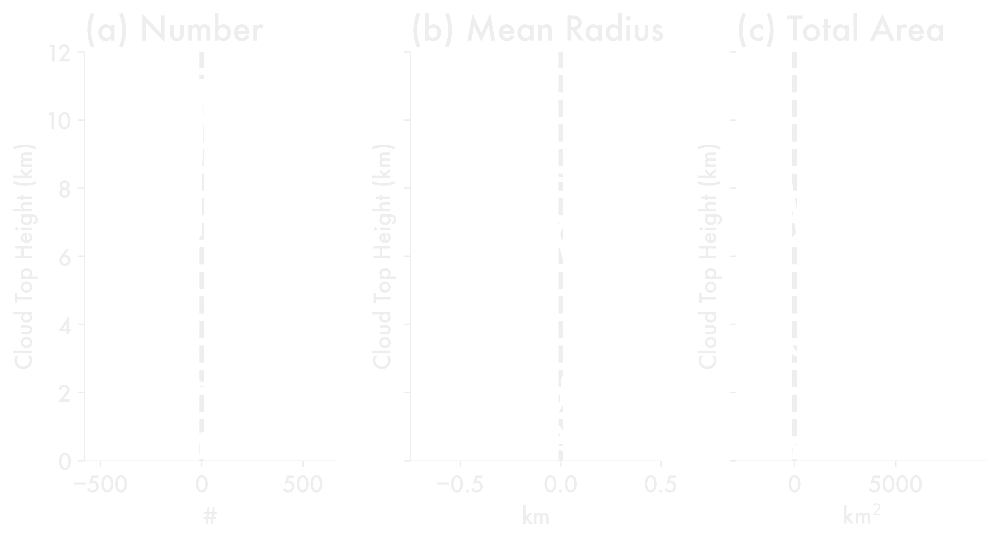

In [464]:
fig, axes = plt.subplots(1, 3, sharey=True, figsize=(7.5, 3.5))

axes[0].plot((num_pres - num_past)[:13], cths[:13], color=col)
axes[2].plot((area_pres - area_past)[:13], cths[:13], color=col)
axes[1].plot(
    (rad_pres - rad_past)[:13],
    cths[:13],
    color=col,
)
axes[1].fill_betweenx(
    cths[:13],
    ((rad_pres - rad_past) - 1.96 * s / np.sqrt(n))[:13],
    ((rad_pres - rad_past) + 1.96 * s / np.sqrt(n))[:13],
    alpha=0.5,
    zorder=0,
    color=lcol,
)
for ax, title, units in zip(
    axes,
    ["(a) Number", "(b) Mean Radius", "(c) Total Area"],
    ["#", "km", "km$^2$"],
):
    ax.axvline(0, ls="--", zorder=0)
    ax.set_title(title)
    ax.set_ylim(0, 12)
    ax.set_ylabel("Cloud Top Height (km)")
    ax.set_xlabel(units)

axes[-2].set_xlim(-0.75, 0.5)
plt.savefig("/squall/gleung/borneolcc-figures/cth-all-max-midday.png")
plt.show("all")
plt.close("all")

## DIurnal Cycle

In [521]:
past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

past["ybin"] = pd.cut(past.CTH, bins=alt[::5] / 1000)  # np.linspace(0, 20, 11))

num_past = past.groupby("ybin").feature.count()
cths = [x.mid for x in num_past.index.values]
area_past = past.groupby("ybin").cond_footprint.sum()
w_past = past.groupby("ybin").w_max.mean()

pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]
# pres = pres[(pres.local_time.dt.hour>=6) & (pres.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres.CTH, bins=alt[::5] / 1000)  # np.linspace(0, 20, 11))

num_pres = pres.groupby("ybin").feature.count()
area_pres = pres.groupby("ybin").cond_footprint.sum()
w_pres = pres.groupby("ybin").w_max.mean()

/tmp/ipykernel_2903810/3329455969.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_past = past.groupby("ybin").feature.count()
/tmp/ipykernel_2903810/3329455969.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_past = past.groupby("ybin").cond_footprint.sum()
/tmp/ipykernel_2903810/3329455969.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  w_past = past.groupby("ybin").w_max.mean()
/tmp/ipykernel_2903

In [632]:
past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

yvar = "cellmax_CTH"
past["ybin"] = pd.cut(past[yvar], bins=alt[::5] / 1000)
num_past = past.groupby(["ybin", past.local_time.dt.hour // 2]).feature.count()
num_past = num_past.reset_index().pivot(
    index="local_time", columns="ybin", values="feature"
)

cths = [x.mid for x in num_past.index.values]
num_past.columns = cths


a_past = past.groupby(
    ["ybin", past.local_time.dt.hour // 2]
).cond_footprint.sum()
a_past = a_past.reset_index().pivot(
    index="local_time", columns="ybin", values="cond_footprint"
)
a_past.columns = cths


pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres[yvar], bins=alt[::5] / 1000)
num_pres = pres.groupby(["ybin", pres.local_time.dt.hour // 2]).feature.count()

num_pres = num_pres.reset_index().pivot(
    index="local_time", columns="ybin", values="feature"
)
num_pres.columns = cths

a_pres = pres.groupby(
    ["ybin", pres.local_time.dt.hour // 2]
).cond_footprint.sum()
a_pres = a_pres.reset_index().pivot(
    index="local_time", columns="ybin", values="cond_footprint"
)
a_pres.columns = cths

/tmp/ipykernel_2903810/3668594923.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_past = past.groupby(["ybin", past.local_time.dt.hour // 2]).feature.count()


AttributeError: 'numpy.int32' object has no attribute 'mid'

<>:44: SyntaxWarning: invalid escape sequence '\D'
<>:44: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_2903810/1485688410.py:44: SyntaxWarning: invalid escape sequence '\D'
  plt.colorbar(c, ax=axes[1], label="$\Delta$ #")
/tmp/ipykernel_2903810/1485688410.py:44: SyntaxWarning: invalid escape sequence '\D'
  plt.colorbar(c, ax=axes[1], label="$\Delta$ #")


TypeError: float() argument must be a string or a real number, not 'pandas._libs.interval.Interval'

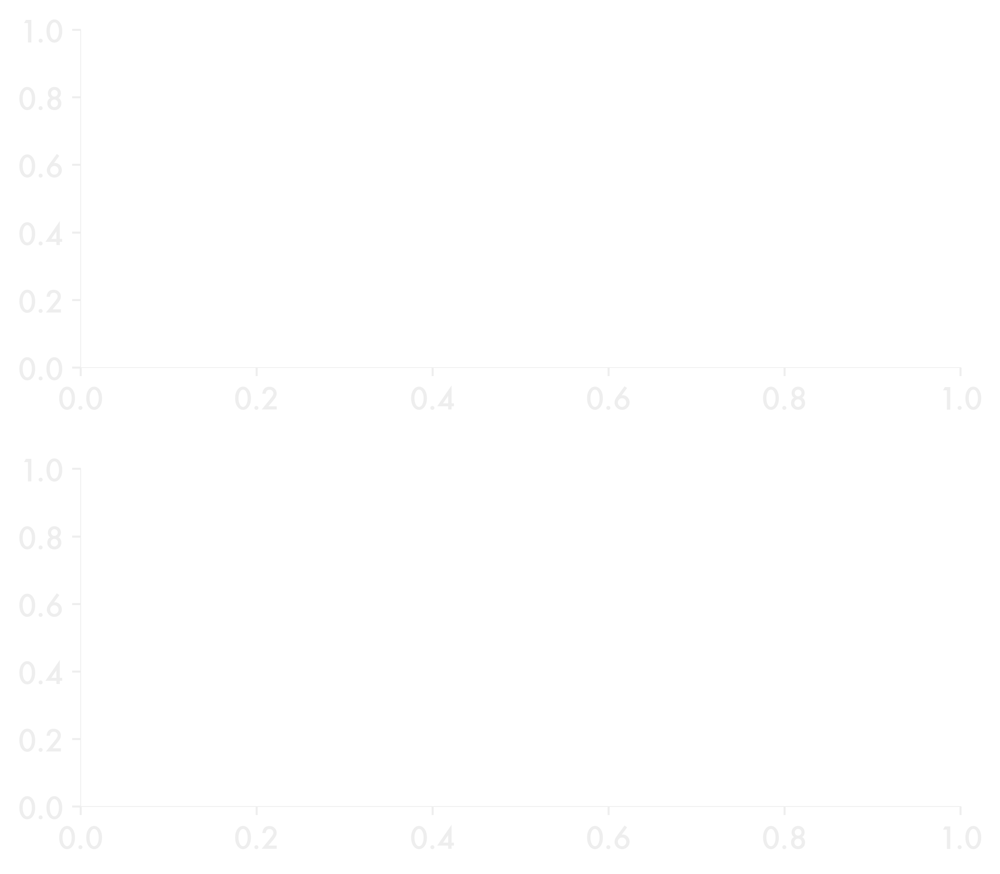

In [633]:
fig, axes = plt.subplots(2, 1, figsize=(5.5, 5))

c = axes[0].contourf(
    num_past.index * 2,
    num_past.columns,
    num_past.T,
    levels=np.linspace(0, 20000, 11),
    extend="both",
)
plt.colorbar(c, ax=axes[0], label="#")
"""c = axes[1].contourf(
    num_pres.index,
    num_pres.columns,
    num_pres.T,
    levels=np.linspace(0, 8000, 17),
)
plt.colorbar(c, ax=axes[1], label="#")"""

c = axes[1].contourf(
    num_pres.index * 2,
    num_pres.columns,
    (num_pres - num_past).T,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[
        -1500,
        -1250,
        -1000,
        -750,
        -500,
        500,
        750,
        1000,
        1250,
        1500,
        1750,
        2000,
        2250,
        2500,
    ],  # [l for l in np.linspace(-1500, 2500, 13) if l != 0],
    extend="both",
)

plt.colorbar(c, ax=axes[1], label="$\Delta$ #")

for ax, title in zip(axes, ["(a) Past", "(b) Difference (Present - Past)"]):
    ax.contour(
        num_past.index * 2,
        num_past.columns,
        num_past.T,
        levels=[1000, 5000, 10000],
        linewidths=0.5,
        colors="gray",
    )
    ax.axvline(6, ls="--", color="gray", lw=1)
    ax.axvline(18, ls="--", color="gray", lw=1)
    ax.set_ylim(0, 15)
    ax.set_title(title)
    ax.set_ylabel("Cloud Top Height (km)")
    ax.set_xlabel("Hour of Day")

plt.tight_layout()
plt.savefig(f"/squall/gleung/borneolcc-figures/diurnal-num-cthmax-2.png")
plt.show()
plt.close("all")

<>:24: SyntaxWarning: invalid escape sequence '\D'
<>:24: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_2903810/3874362541.py:24: SyntaxWarning: invalid escape sequence '\D'
  plt.colorbar(c, ax=axes[1], label="$\Delta$ km$^2$")
/tmp/ipykernel_2903810/3874362541.py:24: SyntaxWarning: invalid escape sequence '\D'
  plt.colorbar(c, ax=axes[1], label="$\Delta$ km$^2$")


TypeError: cannot perform __mul__ with this index type: DatetimeArray

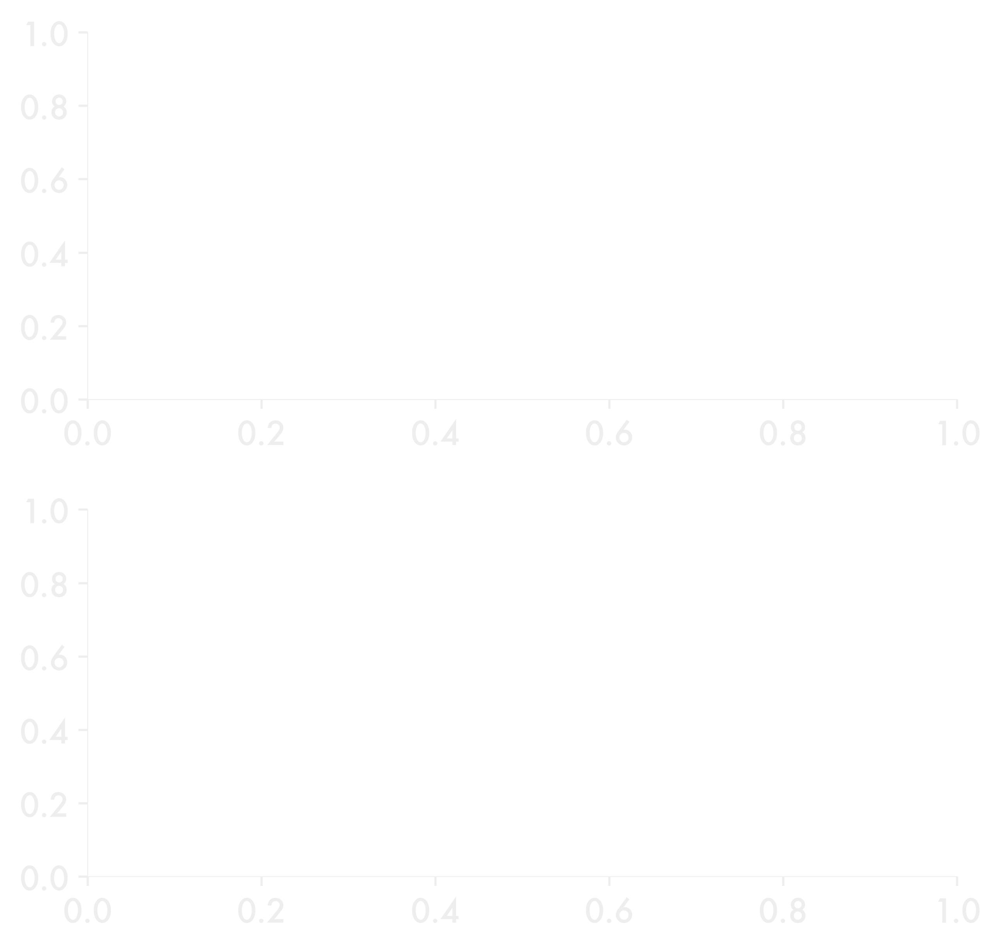

In [634]:
n = 10

fig, axes = plt.subplots(2, 1, figsize=(5, 5))

c = axes[0].contourf(
    a_past.index * 2,
    a_past.columns,
    a_past.T,
    norm=mcolors.LogNorm(),
    levels=np.logspace(1, 5, 13),
    extend="both",
)
plt.colorbar(c, ax=axes[0], label="km$^2$")

c = axes[1].contourf(
    a_pres.index * 2,
    a_pres.columns,
    (a_pres - a_past)[(num_past >= n) & (num_pres >= n)].T,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=np.linspace(-12000, 12000, 11),
    extend="both",
)
plt.colorbar(c, ax=axes[1], label="$\Delta$ km$^2$")

for ax, title in zip(axes, ["(a) Past", "(b) Difference (Present - Past)"]):
    ax.contour(
        num_past.index * 2,
        num_past.columns,
        num_past.T,
        levels=[1e2, 1e3, 1e4],
        linewidths=0.5,
        colors="gray",
    )
    ax.axvline(6, ls="--", color="gray", lw=1)
    ax.axvline(18, ls="--", color="gray", lw=1)
    ax.set_ylim(0, 15)
    ax.set_title(title)
    ax.set_ylabel("Cloud Top Height (km)")
    ax.set_xlabel("Hour of Day")
    ax.set_xlim(0, 24)

plt.tight_layout()
plt.savefig(f"/squall/gleung/borneolcc-figures/diurnal-area-cthmax-2.png")
plt.show()
plt.close("all")

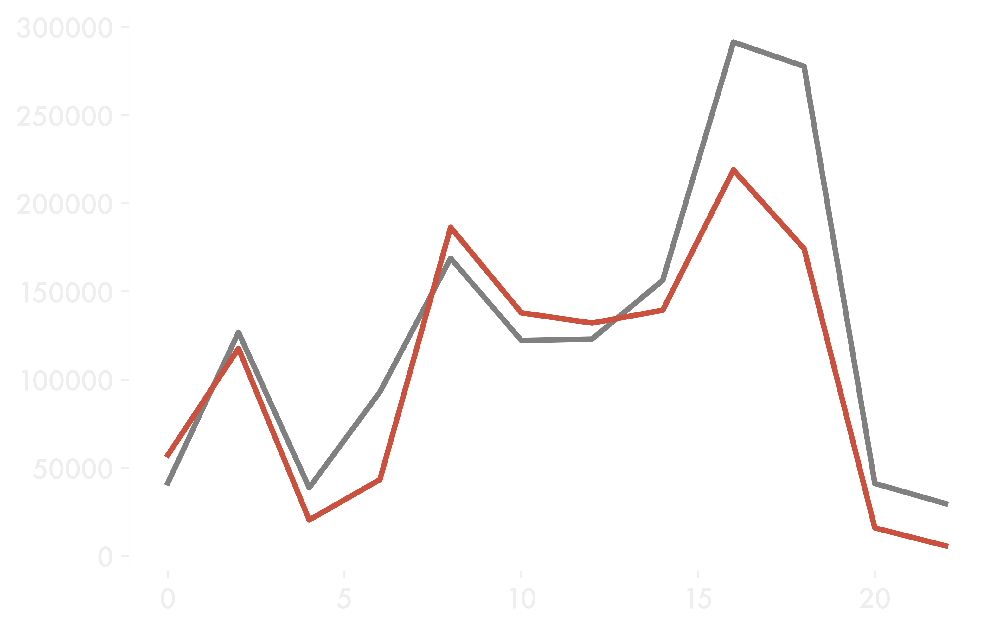

In [495]:
plt.plot(a_past.index * 2, a_past.sum(axis=1), color="gray")
plt.plot(a_pres.index * 2, a_pres.sum(axis=1), color=red)

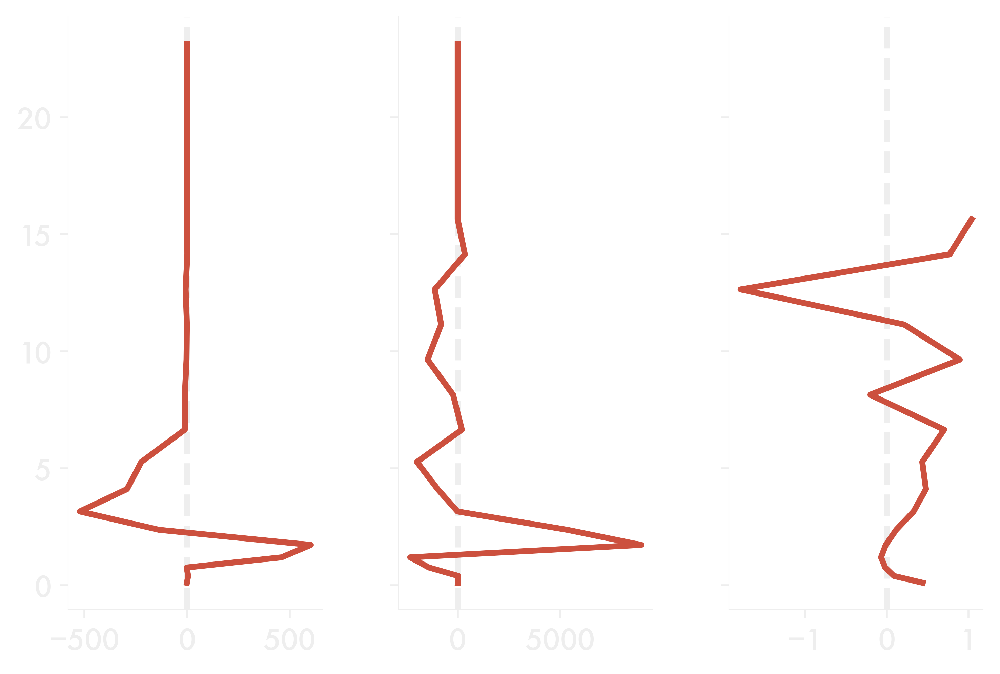

In [487]:
fig, axes = plt.subplots(1, 3, sharey=True)

axes[0].plot(num_pres - num_past, cths, color=col)
axes[1].plot(area_pres - area_past, cths, color=col)
axes[2].plot(w_pres - w_past, cths, color=col)

for ax in axes:
    ax.axvline(0, ls="--", zorder=0)

## 2D PDF

## Not log

In [444]:
yvar = "cellmax_CTH"
xvar = "cellmax_wmax"

past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")
past = past[past.cell_BL_flag_init]
past = past.groupby("cell").first()
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

past["ybin"] = pd.cut(past[yvar], bins=np.linspace(0, 18, 13))
past["xbin"] = pd.cut(
    past[xvar], bins=np.logspace(0, 2, 11)
)  # np.linspace(0, 50, 21))

num_past = (
    past.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
cths = [x.mid for x in num_past.index.values]
ws = [x.mid for x in num_past.columns.values]
pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]

pres = pres.groupby("cell").first()
# pres = pres[(pres.local_time.dt.hour>=6) & (pres.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres[yvar], bins=np.linspace(0, 18, 13))
pres["xbin"] = pd.cut(
    pres[xvar], bins=np.logspace(0, 2, 11)
)  # np.linspace(0, 50, 21))

num_pres = (
    pres.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)

/tmp/ipykernel_2903810/805549789.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/805549789.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pres.groupby(["xbin", "ybin"])


# Overview

/tmp/ipykernel_2903810/1509239684.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,].contourf(


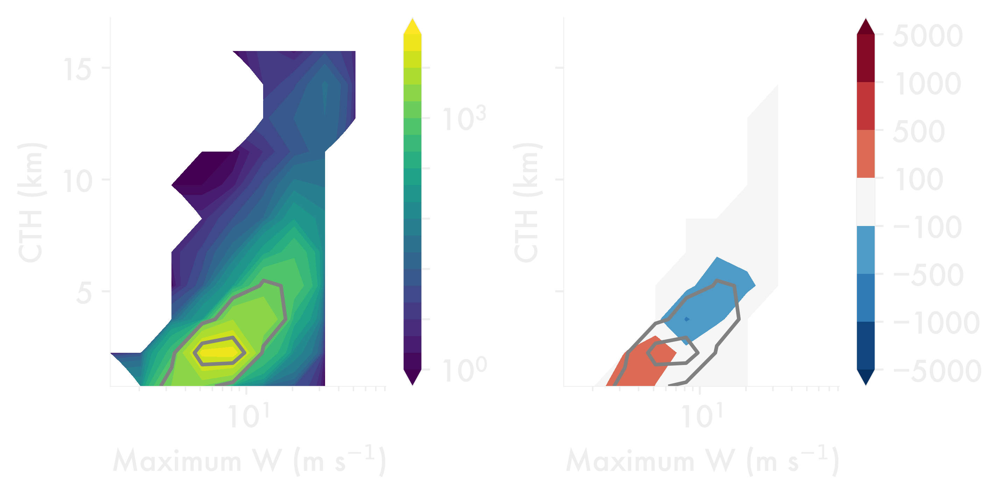

In [182]:
n = 10

fig, axess = plt.subplots(1, 2, sharey=True, figsize=(6, 3))

c = axess[0,].contourf(
    ws,
    cths,
    num_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(0, 4, 21),
    extend="both",
)
plt.colorbar(c, ax=axess[0])

c = axess[1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[1])

for ax in axess:
    c = ax.contour(
        ws,
        cths,
        num_past,
        levels=[1e3, 5e3, 1e4, 5e4],
        colors="gray",
        linewidths=1.5,
    )


for ax in axess.flatten():
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")
    ax.set_xscale("log")

plt.tight_layout()
plt.show()
plt.close("all")

# Final

In [445]:
yvar = "cellmax_CTH"
xvar = "cellmax_wmax"

past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")
past = past[past.cell_BL_flag_init]
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

past["ybin"] = pd.cut(past[yvar], bins=np.linspace(0, 18, 13))
past["xbin"] = pd.cut(
    past[xvar], bins=np.logspace(0, 2, 11)
)  # np.linspace(0, 50, 21))

num_past = (
    past.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
a_past = (
    past.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)
cths = [x.mid for x in num_past.index.values]
ws = [x.mid for x in num_past.columns.values]
pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]

# pres = pres[(pres.local_time.dt.hour>=6) & (pres.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres[yvar], bins=np.linspace(0, 18, 13))
pres["xbin"] = pd.cut(
    pres[xvar], bins=np.logspace(0, 2, 11)
)  # np.linspace(0, 50, 21))

num_pres = (
    pres.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
a_pres = (
    pres.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)

/tmp/ipykernel_2903810/3821904906.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/3821904906.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/3821904906.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pres.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/3821904906.py:45: FutureWarning: The default of

/tmp/ipykernel_2903810/4152395721.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,].contourf(
/tmp/ipykernel_2903810/4152395721.py:16: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[1].contourf(


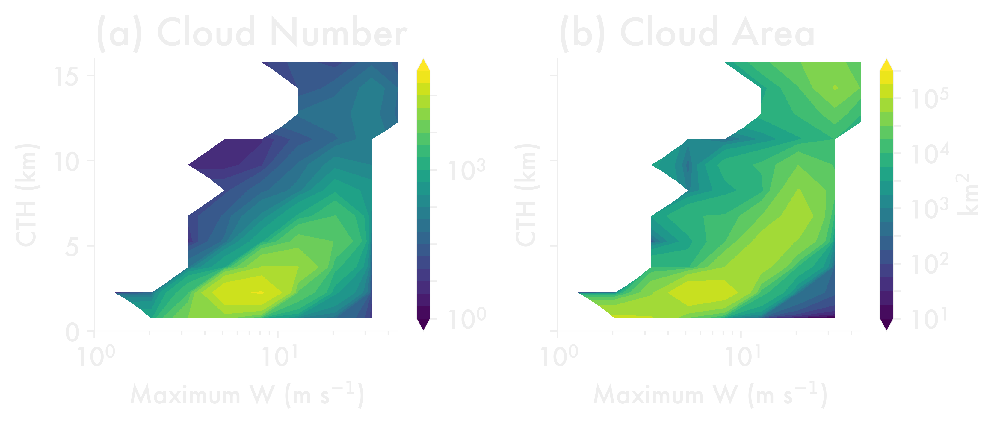

In [453]:
n = 10

fig, axess = plt.subplots(1, 2, sharey=True, figsize=(7, 3))

c = axess[0,].contourf(
    ws,
    cths,
    num_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(0, 5, 21),
    extend="both",
)
plt.colorbar(c, ax=axess[0])


c = axess[1].contourf(
    ws,
    cths,
    a_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(1, 5.5, 19),
    extend="both",
)
plt.colorbar(c, ax=axess[1], label="km$^2$")


for ax in axess.flatten():
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")
    ax.set_xscale("log")
    ax.set_ylim(0, 16)
    ax.set_xlim(1, 45)

axess[0].set_title("(a) Cloud Number")

axess[1].set_title("(b) Cloud Area")

plt.tight_layout()
plt.savefig("/squall/gleung/borneolcc-figures/cth-overview.png")
plt.show()
plt.close("all")

/tmp/ipykernel_2903810/522879900.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,].contourf(


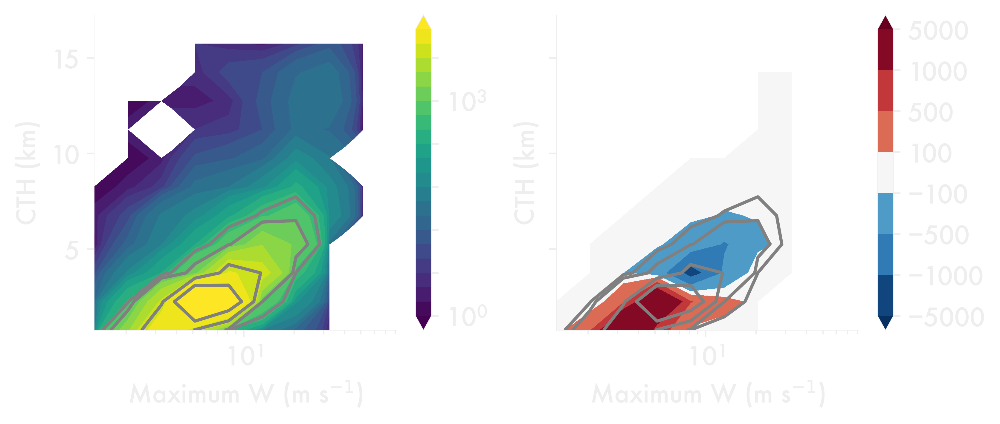

In [193]:
n = 10

fig, axess = plt.subplots(1, 2, sharey=True, figsize=(7, 3))

c = axess[0,].contourf(
    ws,
    cths,
    num_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(0, 4, 21),
    extend="both",
)
plt.colorbar(c, ax=axess[0])

c = axess[1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[1])

for ax in axess:
    c = ax.contour(
        ws,
        cths,
        num_past,
        levels=[5e2, 1e3, 5e3, 1e4, 5e4],
        colors="gray",
        linewidths=1.5,
    )


for ax in axess.flatten():
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")
    ax.set_xscale("log")

axes[0].set_title("(a) Past")

axes[1].set_title("(b) Difference (Present - Past)")

plt.tight_layout()
plt.savefig("/squall/gleung/borneolcc-figures/cth-num-alltimes-pdf.png")
plt.show()
plt.close("all")

/tmp/ipykernel_2903810/849320374.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,].contourf(


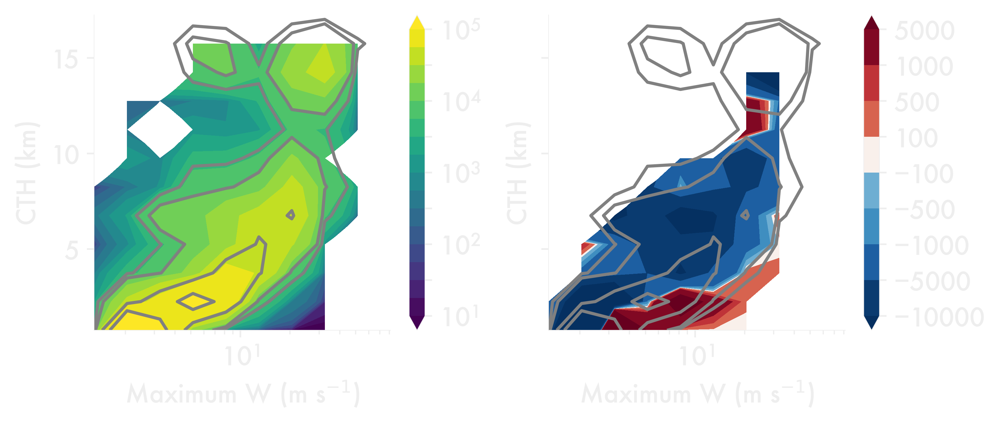

In [200]:
n = 10

fig, axess = plt.subplots(1, 2, sharey=True, figsize=(7, 3))

c = axess[0,].contourf(
    ws,
    cths,
    a_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(1, 5, 17),
    extend="both",
)
plt.colorbar(c, ax=axess[0])

c = axess[1].contourf(
    ws,
    cths,
    (a_pres - a_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-10000, -5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[1])

for ax in axess:
    c = ax.contour(
        ws,
        cths,
        a_past,
        levels=[5e3, 1e4, 5e4, 1e5, 5e5],
        colors="gray",
        linewidths=1.5,
    )


for ax in axess.flatten():
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")
    ax.set_xscale("log")

axes[0].set_title("(a) Past")

axes[1].set_title("(b) Difference (Present - Past)")

plt.tight_layout()
plt.savefig("/squall/gleung/borneolcc-figures/cth-area-alltimes-pdf.png")
plt.show()
plt.close("all")

# Summed

In [202]:
yvar = "cellmax_CTH"
xvar = "cellmax_wmax"

past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")
past = past[past.cell_BL_flag_init]
past["total_cond_foot"] = past.groupby("cell").cond_footprint.transform("sum")
past = past.groupby("cell").first()
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

past["ybin"] = pd.cut(past[yvar], bins=np.linspace(0, 18, 13))
past["xbin"] = pd.cut(
    past[xvar], bins=np.logspace(0, 2, 11)
)  # np.linspace(0, 50, 21))

num_past = (
    past.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
a_past = (
    past.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)
cths = [x.mid for x in num_past.index.values]
ws = [x.mid for x in num_past.columns.values]
pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]

pres["total_cond_foot"] = pres.groupby("cell").cond_footprint.transform("sum")
pres = pres.groupby("cell").first()
# pres = pres[(pres.local_time.dt.hour>=6) & (pres.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres[yvar], bins=np.linspace(0, 18, 13))
pres["xbin"] = pd.cut(
    pres[xvar], bins=np.logspace(0, 2, 11)
)  # np.linspace(0, 50, 21))

num_pres = (
    pres.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
a_pres = (
    pres.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)

/tmp/ipykernel_2903810/2055396545.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/2055396545.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/2055396545.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pres.groupby(["xbin", "ybin"])
/tmp/ipykernel_2903810/2055396545.py:49: FutureWarning: The default of

/tmp/ipykernel_2903810/1842294101.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,].contourf(


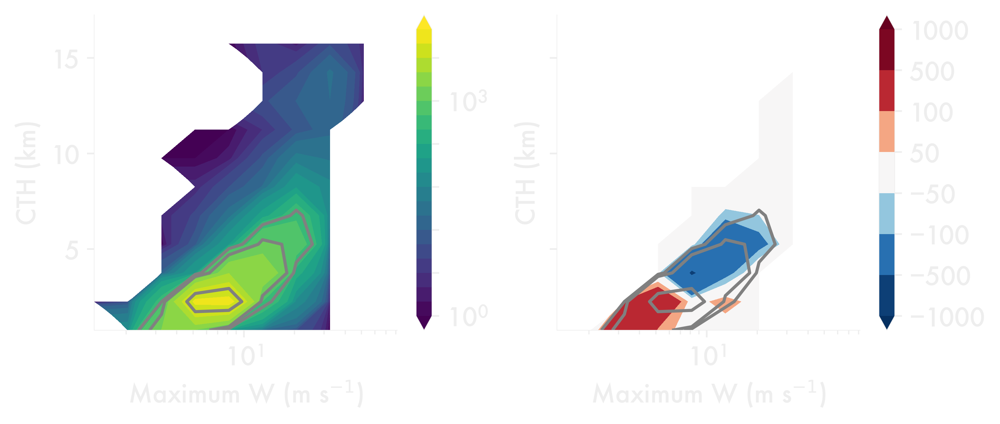

In [208]:
n = 10

fig, axess = plt.subplots(1, 2, sharey=True, figsize=(7, 3))

c = axess[0,].contourf(
    ws,
    cths,
    num_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(0, 4, 21),
    extend="both",
)
plt.colorbar(c, ax=axess[0])

c = axess[1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-1000, -500, -100, -50, 50, 100, 500, 1000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[1])

for ax in axess:
    c = ax.contour(
        ws,
        cths,
        num_past,
        levels=[5e2, 1e3, 5e3, 1e4, 5e4],
        colors="gray",
        linewidths=1.5,
    )


for ax in axess.flatten():
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")
    ax.set_xscale("log")

axes[0].set_title("(a) Past")

axes[1].set_title("(b) Difference (Present - Past)")

plt.tight_layout()
plt.savefig("/squall/gleung/borneolcc-figures/cth-num-max-pdf.png")
plt.show()
plt.close("all")

/tmp/ipykernel_2903810/3789681085.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,].contourf(


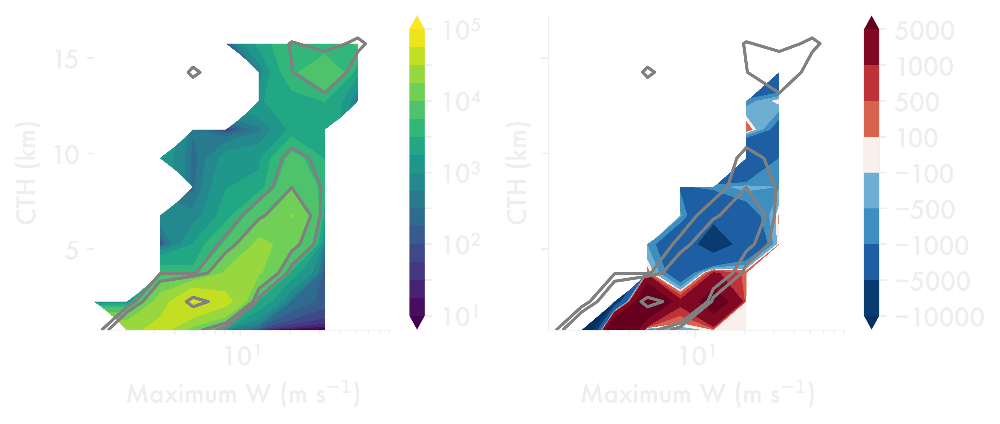

In [206]:
n = 10

fig, axess = plt.subplots(1, 2, sharey=True, figsize=(7, 3))

c = axess[0,].contourf(
    ws,
    cths,
    a_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(1, 5, 17),
    extend="both",
)
plt.colorbar(c, ax=axess[0])

c = axess[1].contourf(
    ws,
    cths,
    (a_pres - a_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-10000, -5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[1])

for ax in axess:
    c = ax.contour(
        ws,
        cths,
        a_past,
        levels=[5e3, 1e4, 5e4, 1e5, 5e5],
        colors="gray",
        linewidths=1.5,
    )


for ax in axess.flatten():
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")
    ax.set_xscale("log")

axes[0].set_title("(a) Past")

axes[1].set_title("(b) Difference (Present - Past)")

plt.tight_layout()
plt.savefig("/squall/gleung/borneolcc-figures/cth-area-maxt-pdf.png")
plt.show()
plt.close("all")

## Each Time

In [ ]:
yvar = "CTH"
xvar = "w_max"

past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

past["ybin"] = pd.cut(past[yvar], bins=np.linspace(0, 18, 13))
past["xbin"] = pd.cut(past[xvar], bins=np.logspace(0, 1.75, 15))

num_past = (
    past.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
cths = [x.mid for x in num_past.index.values]
ws = [x.mid for x in num_past.columns.values]
area_past = (
    past.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)
w_past = (
    past.groupby(["xbin", "ybin"])
    .w_max.mean()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="w_max")
)

pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]
# pres = pres[(pres.local_time.dt.hour>=6) & (pres.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres[yvar], bins=np.linspace(0, 18, 13))
pres["xbin"] = pd.cut(pres[xvar], bins=np.logspace(0, 1.75, 15))

num_pres = (
    pres.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
area_pres = (
    pres.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)
w_pres = (
    pres.groupby(["xbin", "ybin"])
    .w_max.mean()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="w_max")
)

/tmp/ipykernel_2842114/1587214998.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_past = past.groupby(['xbin','ybin']).feature.count().reset_index().pivot(index='ybin',columns='xbin',values='feature')
/tmp/ipykernel_2842114/1587214998.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_past = past.groupby(['xbin','ybin']).cond_footprint.sum().reset_index().pivot(index='ybin',columns='xbin',values='cond_footprint')
/tmp/ipykernel_2842114/1587214998.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to r

/tmp/ipykernel_2842114/4169495118.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,0].contourf(ws,cths, num_past,norm=mcolors.LogNorm(),levels=np.logspace(2,4,11),extend='both')
/tmp/ipykernel_2842114/4169495118.py:8: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[1,0].contourf(ws,cths, area_past,norm=mcolors.LogNorm(),levels=np.logspace(2,5,10),extend='both')


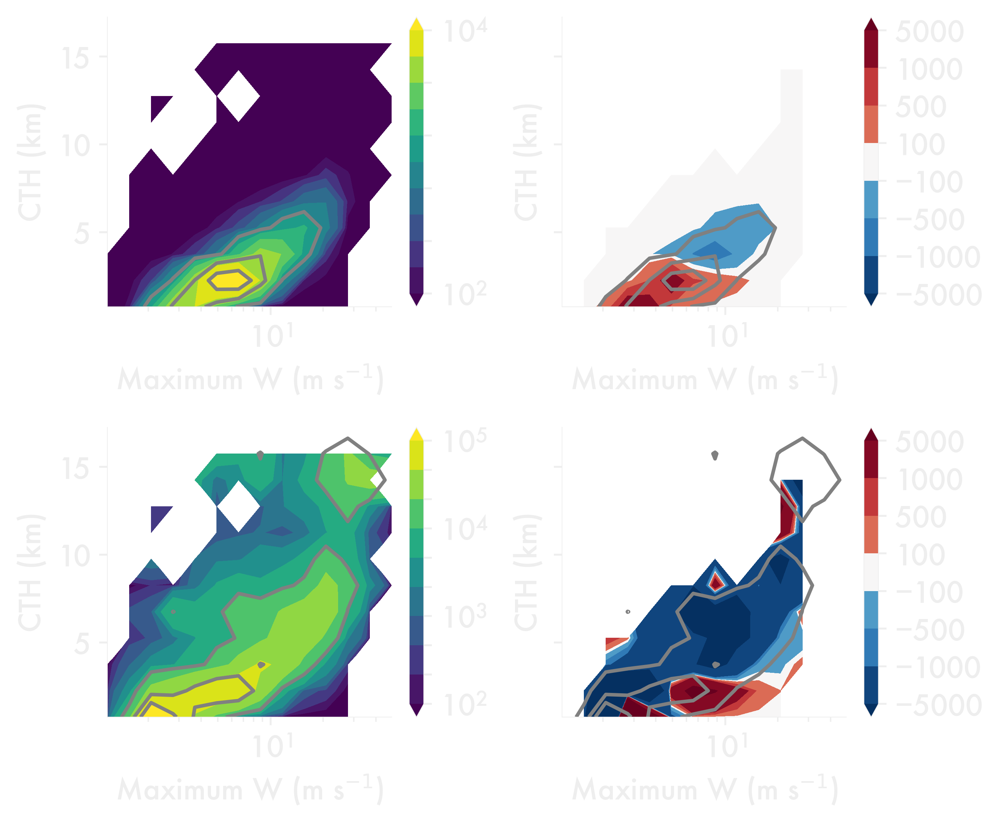

In [ ]:
n = 10

fig, axess = plt.subplots(2, 2, sharey=True, figsize=(6, 5))

c = axess[0, 0].contourf(
    ws,
    cths,
    num_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(2, 4, 11),
    extend="both",
)
plt.colorbar(c, ax=axess[0, 0])

c = axess[1, 0].contourf(
    ws,
    cths,
    area_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(2, 5, 10),
    extend="both",
)
plt.colorbar(c, ax=axess[1, 0])

c = axess[0, 1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[0, 1])
c = axess[1, 1].contourf(
    ws,
    cths,
    (area_pres - area_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0),cmap='RdBu_r',extend='both',
    # levels = [l for l in np.linspace(-2e4,1e4,11) if l!=0]
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=1e2),
    levels=[-5e3, -1e3, -5e2, -1e2, 1e2, 5e2, 1e3, 5e3],
)
plt.colorbar(c, ax=axess[1, 1])

for ax in axess[0]:
    c = ax.contour(
        ws,
        cths,
        num_past,
        levels=[1e3, 5e3, 1e4, 5e4],
        colors="gray",
        linewidths=1.5,
    )

for ax in axess[1]:
    c = ax.contour(
        ws,
        cths,
        area_past,
        levels=[1e4, 5e4, 1e5, 5e5],
        colors="gray",
        linewidths=1.5,
    )


for ax in axess.flatten():
    ax.set_xscale("log")
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("CTH (km)")

plt.tight_layout()
plt.show()
plt.close("all")

/tmp/ipykernel_2842114/2800361276.py:6: UserWarning: Log scale: values of z <= 0 have been masked
  c = axes[0].contourf(ws,cths, num,norm=mcolors.LogNorm(),levels=np.logspace(2,4,11),extend='both')


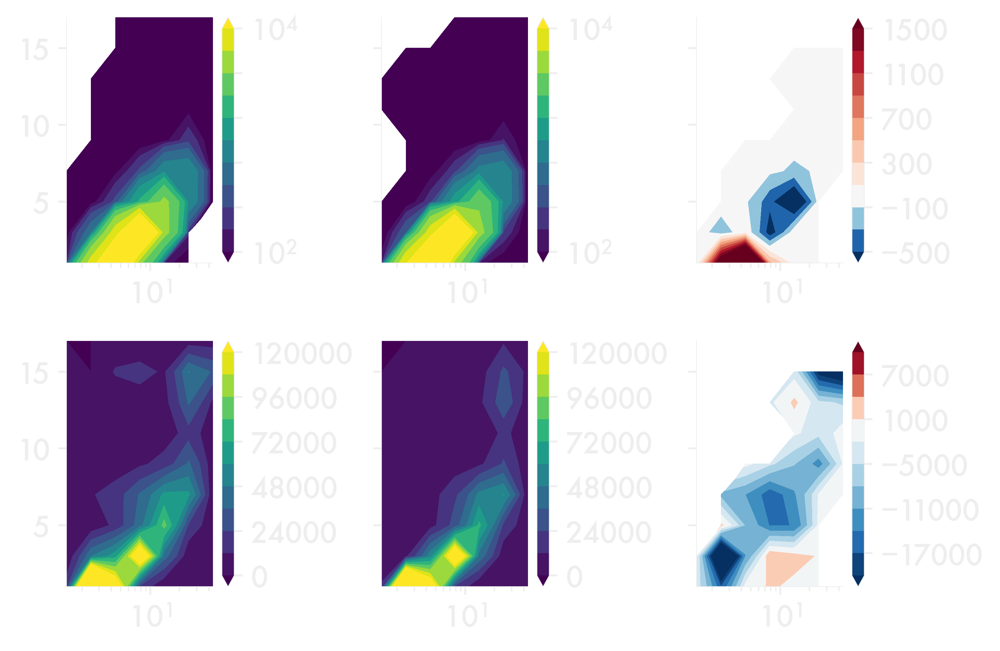

In [ ]:
n = 5

fig, axess = plt.subplots(2, 3, sharey=True)

for axes, lcver, num, area in zip(
    axess.T, ["lc1960", "lc2019"], [num_past, num_pres], [area_past, area_pres]
):
    c = axes[0].contourf(
        ws,
        cths,
        num,
        norm=mcolors.LogNorm(),
        levels=np.logspace(2, 4, 11),
        extend="both",
    )
    plt.colorbar(c, ax=axes[0])
    c = axes[1].contourf(
        ws, cths, area, levels=np.linspace(0, 12e4, 11), extend="both"
    )  # norm=mcolors.LogNorm(),levels=np.logspace(1,,11),extend='both')#
    plt.colorbar(c, ax=axes[1])

c = axess[0, -1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    cmap="RdBu_r",
    extend="both",
    levels=[l for l in np.linspace(-500, 1500, 11) if l != 0],
)
plt.colorbar(c, ax=axess[0, -1])
c = axess[1, -1].contourf(
    ws,
    cths,
    (area_pres - area_past)[(num_pres >= n) & (num_past >= n)],
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    cmap="RdBu_r",
    extend="both",
    levels=[l for l in np.linspace(-2e4, 1e4, 11) if l != 0],
)
plt.colorbar(c, ax=axess[1, -1])

for ax in axess.flatten():
    ax.set_xscale("log")

plt.tight_layout()
plt.show()
plt.close("all")

## Each Cell

In [ ]:
yvar = "cellmax_CTH"
xvar = "cellmax_wmax"

past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]

past["ybin"] = pd.cut(past[yvar], bins=np.linspace(0, 18, 10))
past["xbin"] = pd.cut(past[xvar], bins=np.logspace(0, 1.75, 8))

num_past = (
    past.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
cths = [x.mid for x in num_past.index.values]
ws = [x.mid for x in num_past.columns.values]
area_past = (
    past.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)
w_past = (
    past.groupby(["xbin", "ybin"])
    .w_max.mean()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="w_max")
)

pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]

pres["ybin"] = pd.cut(pres[yvar], bins=np.linspace(0, 18, 10))
pres["xbin"] = pd.cut(pres[xvar], bins=np.logspace(0, 1.75, 8))

num_pres = (
    pres.groupby(["xbin", "ybin"])
    .feature.count()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="feature")
)
cths = [x.mid for x in num_pres.index.values]
ws = [x.mid for x in num_pres.columns.values]
area_pres = (
    pres.groupby(["xbin", "ybin"])
    .cond_footprint.sum()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="cond_footprint")
)
w_pres = (
    pres.groupby(["xbin", "ybin"])
    .w_max.mean()
    .reset_index()
    .pivot(index="ybin", columns="xbin", values="w_max")
)

/tmp/ipykernel_2842114/487947411.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_past = past.groupby(['xbin','ybin']).feature.count().reset_index().pivot(index='ybin',columns='xbin',values='feature')
/tmp/ipykernel_2842114/487947411.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_past = past.groupby(['xbin','ybin']).cond_footprint.sum().reset_index().pivot(index='ybin',columns='xbin',values='cond_footprint')
/tmp/ipykernel_2842114/487947411.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to reta

/tmp/ipykernel_2842114/91563658.py:6: UserWarning: Log scale: values of z <= 0 have been masked
  c = axes[0].contourf(ws,cths, num,norm=mcolors.LogNorm(),levels=np.logspace(2,5,10),extend='both')
/tmp/ipykernel_2842114/91563658.py:8: UserWarning: Log scale: values of z <= 0 have been masked
  c = axes[1].contourf(ws,cths, area,norm=mcolors.LogNorm(),levels=np.logspace(2,6,9),extend='both')#levels=np.linspace(0,12e4,11),extend='both')


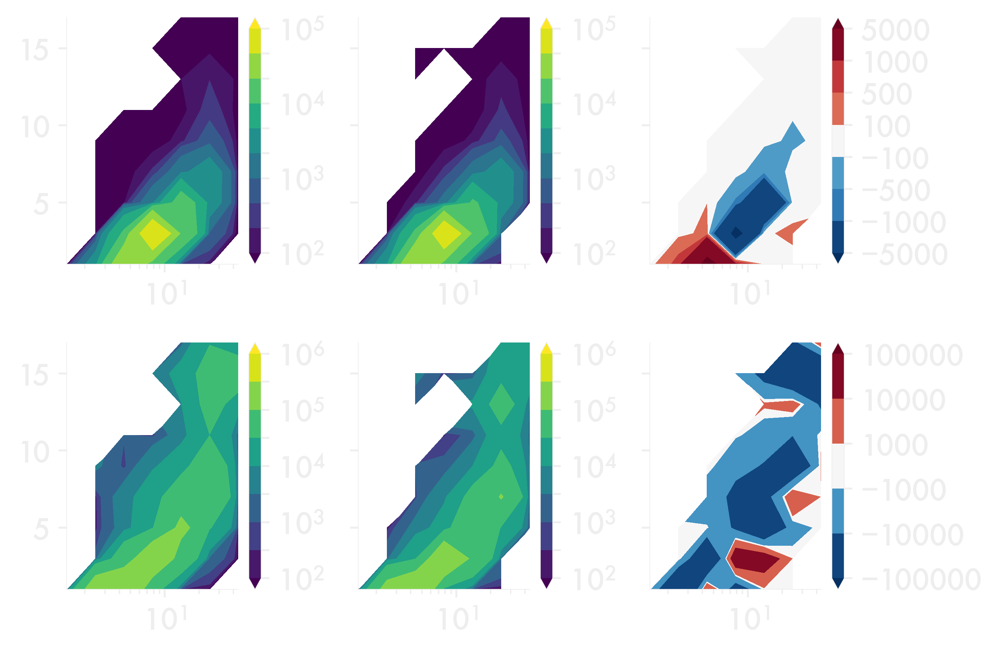

In [ ]:
n = 1

fig, axess = plt.subplots(2, 3, sharey=True)

for axes, lcver, num, area in zip(
    axess.T, ["lc1960", "lc2019"], [num_past, num_pres], [area_past, area_pres]
):
    c = axes[0].contourf(
        ws,
        cths,
        num,
        norm=mcolors.LogNorm(),
        levels=np.logspace(2, 5, 10),
        extend="both",
    )
    plt.colorbar(c, ax=axes[0])
    c = axes[1].contourf(
        ws,
        cths,
        area,
        norm=mcolors.LogNorm(),
        levels=np.logspace(2, 6, 9),
        extend="both",
    )  # levels=np.linspace(0,12e4,11),extend='both')
    plt.colorbar(c, ax=axes[1])

c = axess[0, -1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[0, -1])
c = axess[1, -1].contourf(
    ws,
    cths,
    (area_pres - area_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0),cmap='RdBu_r',extend='both',
    # levels = [l for l in np.linspace(-2e4,1e4,11) if l!=0]
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=1e3),
    levels=[-1e5, -1e4, -1e3, 1e3, 1e4, 1e5],
)
plt.colorbar(c, ax=axess[1, -1])

for ax in axess.flatten():
    ax.set_xscale("log")

plt.tight_layout()
plt.show()
plt.close("all")

/tmp/ipykernel_2842114/2896853079.py:5: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[0,0].contourf(ws,cths, num_past,norm=mcolors.LogNorm(),levels=np.logspace(2,5,10),extend='both')
/tmp/ipykernel_2842114/2896853079.py:8: UserWarning: Log scale: values of z <= 0 have been masked
  c = axess[1,0].contourf(ws,cths, area_past,norm=mcolors.LogNorm(),levels=np.logspace(2,6,13),extend='both')


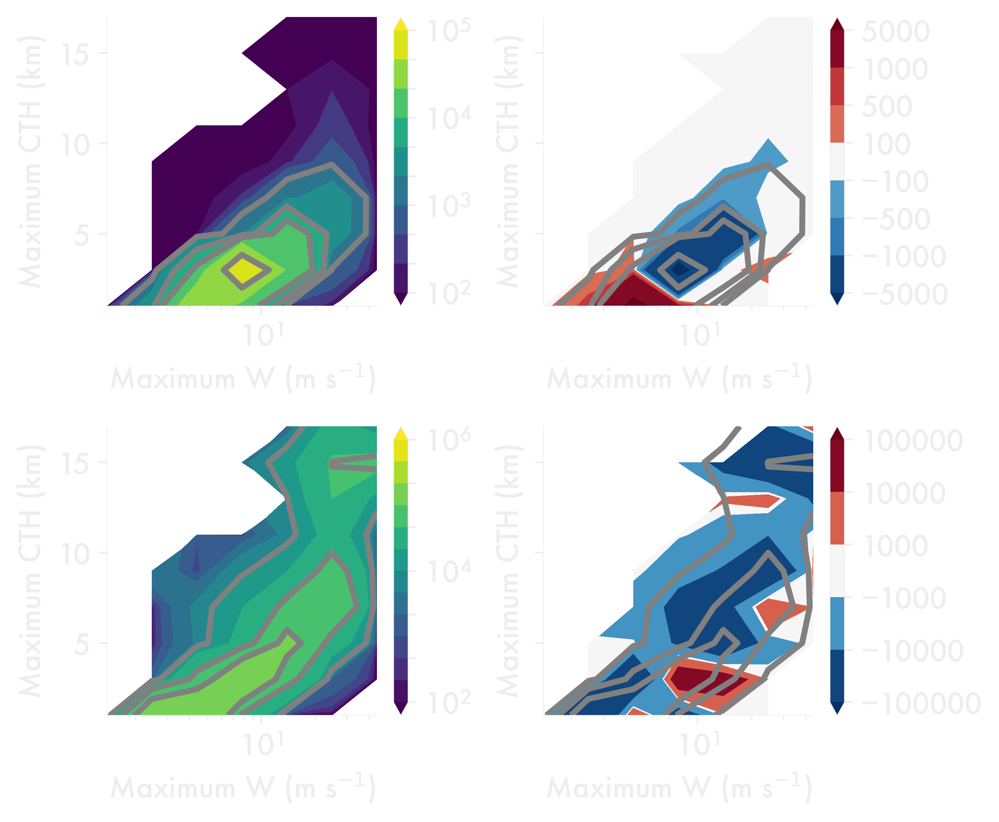

In [ ]:
n = 2

fig, axess = plt.subplots(2, 2, sharey=True, figsize=(6, 5))

c = axess[0, 0].contourf(
    ws,
    cths,
    num_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(2, 5, 10),
    extend="both",
)
plt.colorbar(c, ax=axess[0, 0])

c = axess[1, 0].contourf(
    ws,
    cths,
    area_past,
    norm=mcolors.LogNorm(),
    levels=np.logspace(2, 6, 13),
    extend="both",
)
plt.colorbar(c, ax=axess[1, 0])

c = axess[0, 1].contourf(
    ws,
    cths,
    (num_pres - num_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0)
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=100),
    levels=[-5000, -1000, -500, -100, 100, 500, 1000, 5000],
    # levels=[l for l in np.linspace(-2000,4000,11) if l!=0]
)
plt.colorbar(c, ax=axess[0, 1])
c = axess[1, 1].contourf(
    ws,
    cths,
    (area_pres - area_past)[(num_pres >= n) & (num_past >= n)],
    # norm=mcolors.TwoSlopeNorm(vcenter=0),cmap='RdBu_r',extend='both',
    # levels = [l for l in np.linspace(-2e4,1e4,11) if l!=0]
    cmap="RdBu_r",
    extend="both",
    norm=mcolors.SymLogNorm(linthresh=1e3),
    levels=[-1e5, -1e4, -1e3, 1e3, 1e4, 1e5],
)
plt.colorbar(c, ax=axess[1, 1])

for ax in axess[0]:
    c = ax.contour(
        ws, cths, num_past, levels=[1e3, 5e3, 1e4, 5e4], colors="gray"
    )

for ax in axess[1]:
    c = ax.contour(
        ws, cths, area_past, levels=[1e4, 5e4, 1e5, 5e5], colors="gray"
    )


for ax in axess.flatten():
    ax.set_xscale("log")
    ax.set_xlabel("Maximum W (m s$^{-1}$)")
    ax.set_ylabel("Maximum CTH (km)")

plt.tight_layout()
plt.show()
plt.close("all")

#  Stability

In [ ]:
subver = "all"

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )[["THETA", "RV", "TEMP", "local_time"]]

    print(ds)

    ds = ds.assign(dz=("z", dz[1:]))
    lr_temp = ds.TEMP.diff(dim="z") / (ds.dz[:-1] / 1000)

    if lcver == "lc1960":
        past_lr = lr_temp.copy()
    else:
        pres_lr = lr_temp.copy()

<xarray.Dataset>
Dimensions:     (t: 937, z: 105)
Coordinates:
  * t           (t) datetime64[ns] 2019-09-16T14:00:00 ... 2019-09-19T20:00:00
Dimensions without coordinates: z
Data variables:
    THETA       (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    RV          (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    TEMP        (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    local_time  (t) datetime64[ns] dask.array<chunksize=(937,), meta=np.ndarray>
<xarray.Dataset>
Dimensions:     (t: 937, z: 105)
Coordinates:
  * t           (t) datetime64[ns] 2019-09-16T14:00:00 ... 2019-09-19T20:00:00
Dimensions without coordinates: z
Data variables:
    THETA       (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    RV          (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    TEMP        (t, z) float64 dask.array<chunksize=(937, 105), meta=np.ndarray>
    local_time  (t) datetime64[ns] dask.array<chu

In [ ]:
subver = "all"

blh_past = xr.open_dataset(
    f"{anaPath}/blh_{subver}_lc1960_rte.h5",
    engine="h5netcdf",
    chunks="auto",
).isel(t=slice(12 * 6, -1))

blh_pres = xr.open_dataset(
    f"{anaPath}/blh_{subver}_lc2019_rte.h5",
    engine="h5netcdf",
    chunks="auto",
).isel(t=slice(12 * 6, -1))

<>:20: SyntaxWarning: invalid escape sequence '\D'
<>:20: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_2842114/2067341874.py:20: SyntaxWarning: invalid escape sequence '\D'
  plt.colorbar(c,ax=axes[-1],label='$\Delta$Lapse Rate (K km$^{-1}$)')


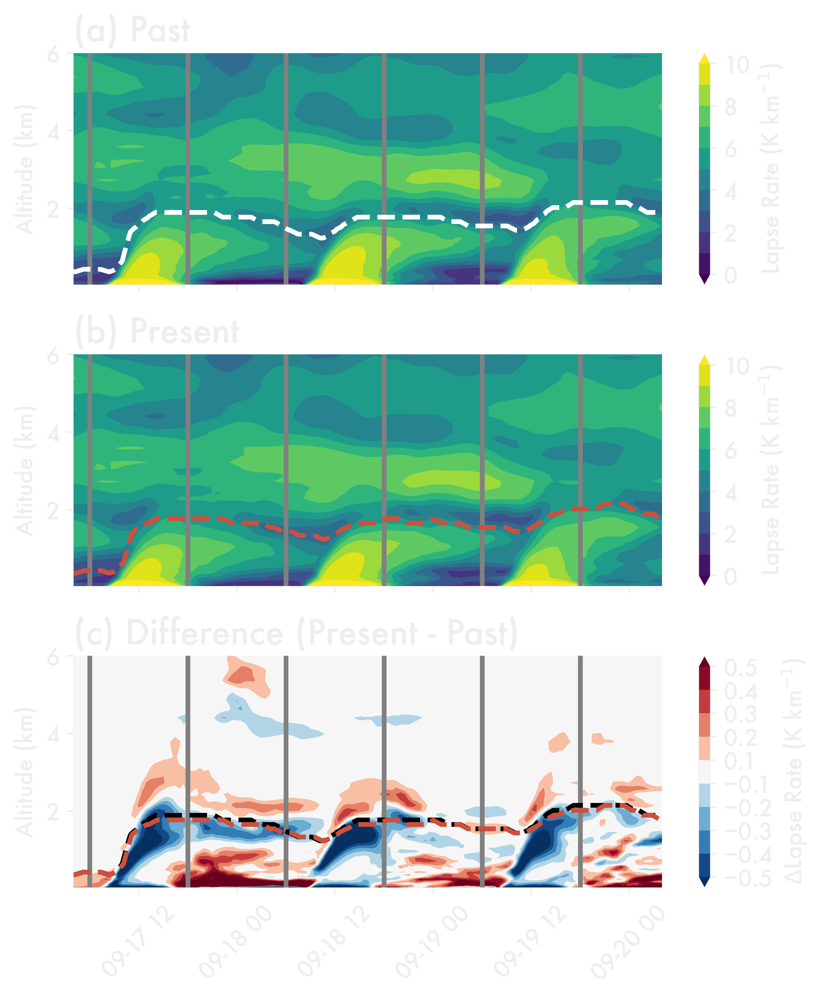

In [ ]:
fig, axes = plt.subplots(3, 1, sharex=True, figsize=(6, 7))

for ax, lr_temp in zip(axes, [past_lr, pres_lr]):
    c = ax.contourf(
        [pd.to_datetime(t) + dt.timedelta(hours=8) for t in lr_temp.t.values],
        alt[1:-1] / 1000,
        np.abs(lr_temp).T,
        levels=np.linspace(0, 10, 11),
        extend="both",
    )
    plt.colorbar(c, ax=ax, label="Lapse Rate (K km$^{-1}$)")
    # ax.contour([pd.to_datetime(t)+dt.timedelta(hours=8) for t in lr_temp.t.values],alt[1:-1]/1000,lr_temp.T,colors='black',levels=[-9.8])

    ax.set_ylim(0, 8)


diff = (np.abs(pres_lr) - np.abs(past_lr)).to_dataset(name="lr")

diff = diff.assign(
    local_time=(
        "t",
        [pd.to_datetime(t) + dt.timedelta(hours=8) for t in diff.t.values],
    )
)
diff = diff.groupby((diff.local_time.dt.round("30min"))).mean()

c = axes[-1].contourf(
    diff["round"],
    alt[1:-1] / 1000,
    diff.lr.T,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    extend="both",
    levels=[l for l in np.linspace(-0.5, 0.5, 11) if l != 0],
)
plt.colorbar(c, ax=axes[-1], label="$\Delta$Lapse Rate (K km$^{-1}$)")

for ax, title in zip(
    axes, ["(a) Past", "(b) Present", "(c) Difference (Present - Past)"]
):
    ax.set_ylim(25 / 1e3, 6)

    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        for t in [" 06:00", " 18:00"]:
            ax.axvline(pd.to_datetime(d + t), color="gray")

    ax.tick_params(axis="x", labelrotation=45)
    ax.set_title(title)

    ax.set_xlim(
        pd.to_datetime("2019-09-17 04:00"), pd.to_datetime("2019-09-20 04:00")
    )

    ax.set_ylabel("Altitude (km)")


axes[0].plot(blh_past.local_time, blh_past.BLH / 1000, color="white", ls="--")
axes[1].plot(blh_pres.local_time, blh_pres.BLH / 1000, color=red, ls="--")

axes[2].plot(blh_past.local_time, blh_past.BLH / 1000, color="black", ls="--")
axes[2].plot(blh_pres.local_time, blh_pres.BLH / 1000, color=red, ls="--")


plt.show()
plt.close("all")

# CAPE

In [ ]:
p0 = get_rams_output(
    f"/squall/gleung/borneolcc/lc1960/rte/a-A-2019-09-17-020000-g1.h5",
    variables=["PI"],
)

<xarray.DataArray 'PI' (x: 106, p: 2230, y: 2150)>
dask.array<open_dataset-PI, shape=(106, 2230, 2150), dtype=float32, chunksize=(42, 910, 876), chunktype=numpy.ndarray>
Dimensions without coordinates: x, p, y


In [ ]:
p0 = p0.mean(dim=("p", "y")).compute().values

In [ ]:
from shared_model_params import p00, cp, rd

In [ ]:
from metpy.units import units
import metpy.calc as mpcalc

In [ ]:
pres = (p00 * (p0[1:] / cp) ** (cp / rd)) / 100 * units.hPa

In [ ]:
ds = xr.open_dataset(
    f"{anaPath}/radprof/land_alltimes_{subver}_{lcver}_rte.h5",
    engine="h5netcdf",
    chunks="auto",
)[["RV", "TEMP", "local_time"]]

In [ ]:
def get_cape(d, pressure=pres):
    t = d.TEMP.values * units.kelvin
    q = d.RV.values
    w = q / (1 - q)
    td = mpcalc.dewpoint_from_specific_humidity(pressure, t, w)
    cape, cin = mpcalc.mixed_layer_cape_cin(pressure, t, td)
    return (cape.magnitude, cin.magnitude)

In [ ]:
for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(
        f"{anaPath}/radprof/land_alltimes_{subver}_{lcver}_rte.h5",
        engine="h5netcdf",
        chunks="auto",
    )[["RV", "TEMP", "local_time"]]

    capes = []
    cins = []

    for t in range(len(ds.t.values)):
        cape, cin = get_cape(ds.isel(t=t))
        capes.append(cape)
        cins.append(cin)

    ds = ds.assign(CAPE=("t", capes))
    ds = ds.assign(CIN=("t", cins))

    # ds = ds.where(ds.t >= pd.to_datetime("2019-09-16 20:00"), drop=True)

    ds.to_netcdf(f"{anaPath}/capecin_{subver}_{lcver}_rte.h5")

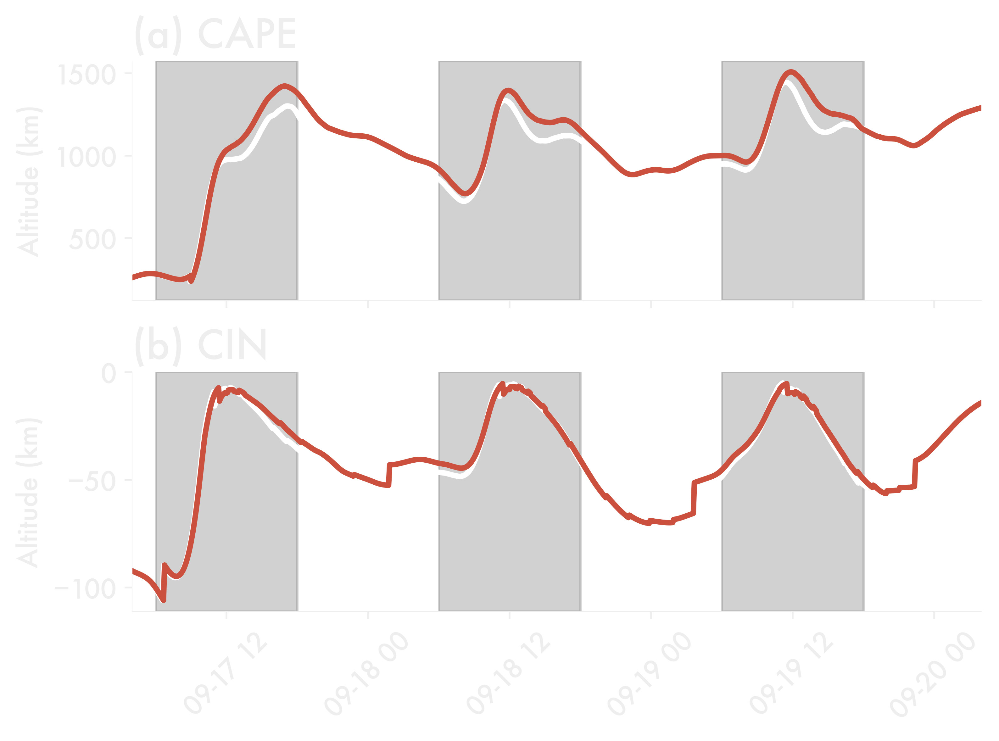

In [ ]:
fig, axes = plt.subplots(2, 1, sharex=True)

for lcver, col, label in zip(
    ["lc1960", "lc2019"],
    [
        lcol,
        red,
    ],
    ["Past", "Present"],
):
    ds = xr.open_dataset(f"{anaPath}/capecin_{subver}_{lcver}_rte.h5")

    axes[0].plot(ds.local_time, ds.CAPE, color=col)
    axes[1].plot(ds.local_time, ds.CIN, color=col)

    for ax, title in zip(axes, ["(a) CAPE", "(b) CIN"]):
        for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
            ax.axvspan(
                pd.to_datetime(f"{d} 06:00"),
                pd.to_datetime(f"{d} 18:00"),
                zorder=0,
                color="gray",
                alpha=0.2,
            )

        ax.tick_params(axis="x", labelrotation=45)
        ax.set_title(title)

        ax.set_xlim(
            pd.to_datetime("2019-09-17 04:00"),
            pd.to_datetime("2019-09-20 04:00"),
        )

        ax.set_ylabel("Altitude (km)")

plt.show()
plt.close("all")

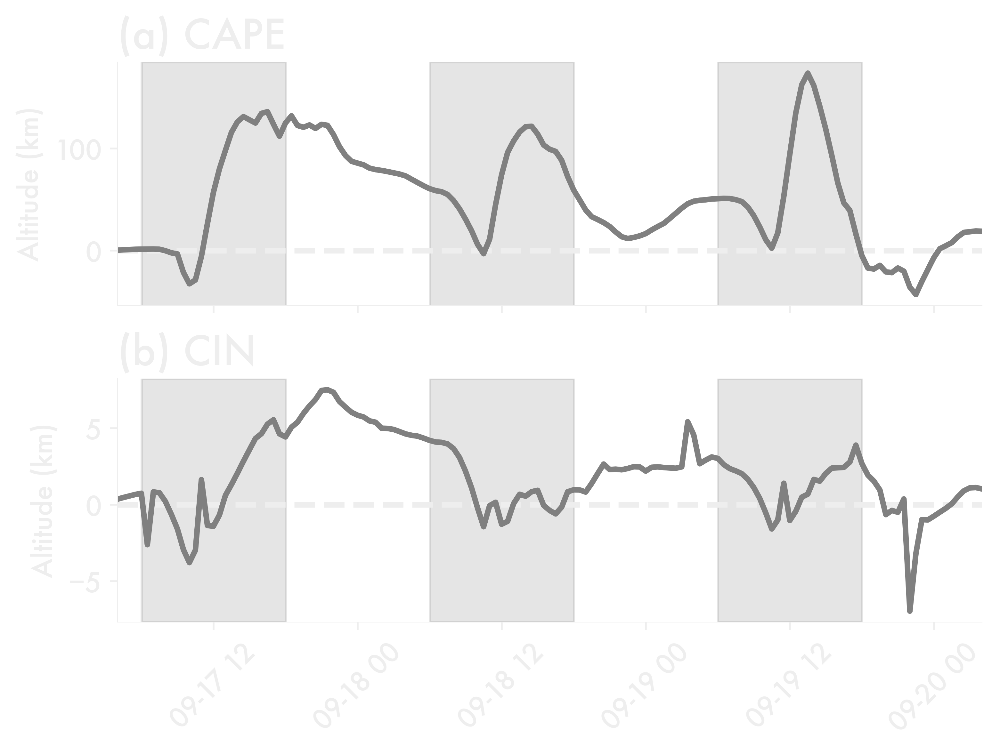

In [ ]:
fig, axes = plt.subplots(2, 1, sharex=True)

past = ds = xr.open_dataset(f"{anaPath}/capecin_{subver}_lc1960_rte.h5")
pres = ds = xr.open_dataset(f"{anaPath}/capecin_{subver}_lc2019_rte.h5")


diff_cape = (
    (pres.CAPE - past.CAPE).groupby(pres.local_time.dt.round("30min")).mean()
)
diff_cin = (
    (pres.CIN - past.CIN).groupby(pres.local_time.dt.round("30min")).mean()
)

axes[0].plot(diff_cape["round"], diff_cape, color="gray")
axes[1].plot(diff_cin["round"], diff_cin, color="gray")

for ax, title in zip(axes, ["(a) CAPE", "(b) CIN"]):
    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        ax.axvspan(
            pd.to_datetime(f"{d} 06:00"),
            pd.to_datetime(f"{d} 18:00"),
            zorder=0,
            color="gray",
            alpha=0.2,
        )

    ax.tick_params(axis="x", labelrotation=45)
    ax.set_title(title)

    ax.set_xlim(
        pd.to_datetime("2019-09-17 04:00"), pd.to_datetime("2019-09-20 04:00")
    )

    ax.set_ylabel("Altitude (km)")

    ax.axhline(0, ls="--", zorder=0)

plt.show()
plt.close("all")

# Moisture Convergence

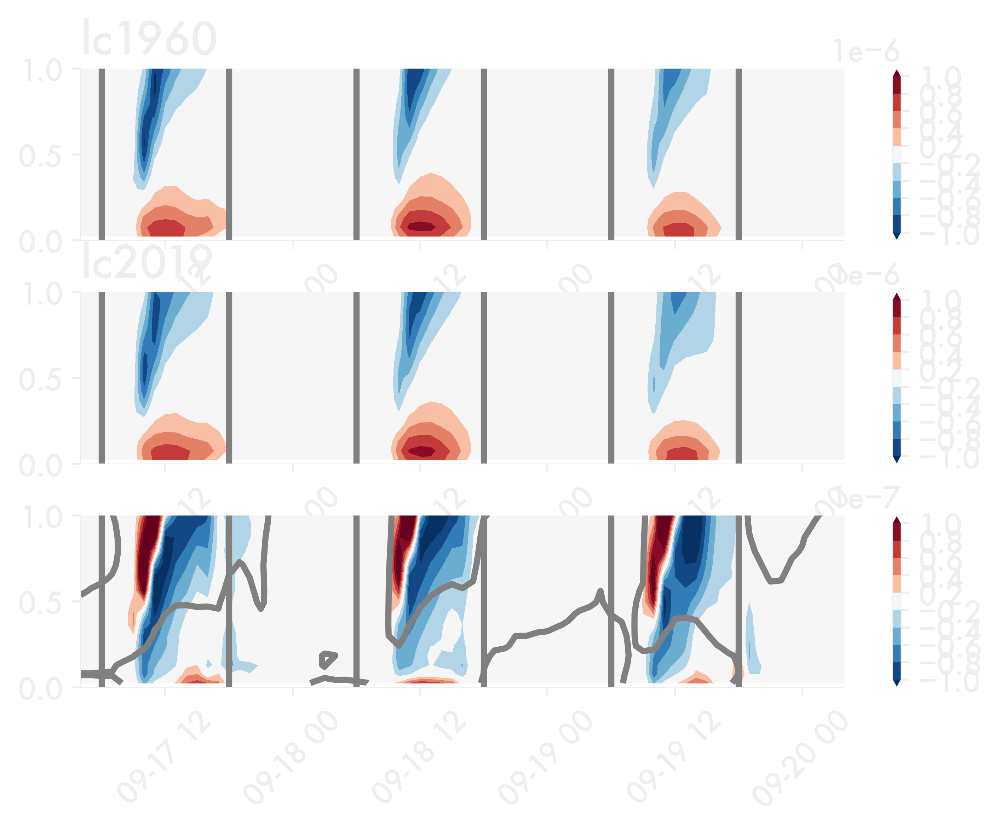

In [ ]:
fig, axes = plt.subplots(3, 1)

for ax, ver in zip(axes, ["lc1960", "lc2019"]):
    ds = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/moistureconv-land-{ver}.nc",
        engine="h5netcdf",
    )
    ds = ds.rename({list(ds.keys())[0]: "q_conv"})

    local_time = [
        pd.to_datetime("2019-09-17 04:00")
        + dt.timedelta(hours=i.astype("float"))
        for i in ds.t.values
    ]

    if ver == "lc1960":
        diff = ds.copy()
    else:
        diff = ds - diff

    c = ax.contourf(
        local_time,
        alt[1 : len(ds.z) + 1] / 1000,
        ds.q_conv.T*1000,
        cmap="RdBu_r",
        norm=mcolors.TwoSlopeNorm(vcenter=0),
        levels=[l for l in np.linspace(-1e-3, 1e-3, 11) if l != 0],
        extend="both",
    )
    plt.colorbar(c, ax=ax)

    ax.set_title(ver)

c = axes[-1].contourf(
    local_time,
    alt[1 : len(ds.z) + 1] / 1000,
    diff.q_conv.T*1000,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[l for l in np.linspace(-1e-r, 1e-4, 11) if l != 0],
    extend="both",
)
axes[-1].contour(
    local_time,
    alt[1 : len(ds.z) + 1] / 1000,
    ds.q_conv.T,
    levels=[0],
    colors="gray",
)

plt.colorbar(c, ax=axes[-1])

for ax in axes:
    ax.set_ylim(0, 1)

    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        for t in [" 06:00", " 18:00"]:
            ax.axvline(pd.to_datetime(d + t), color="gray")

    ax.tick_params(axis="x", labelrotation=45)

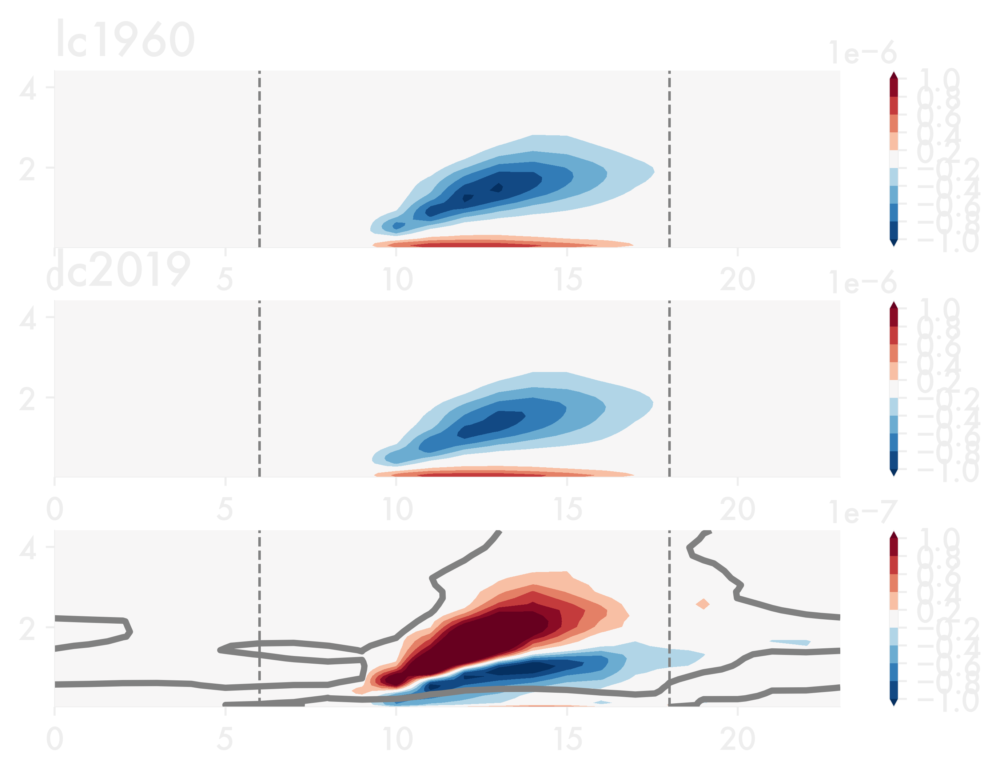

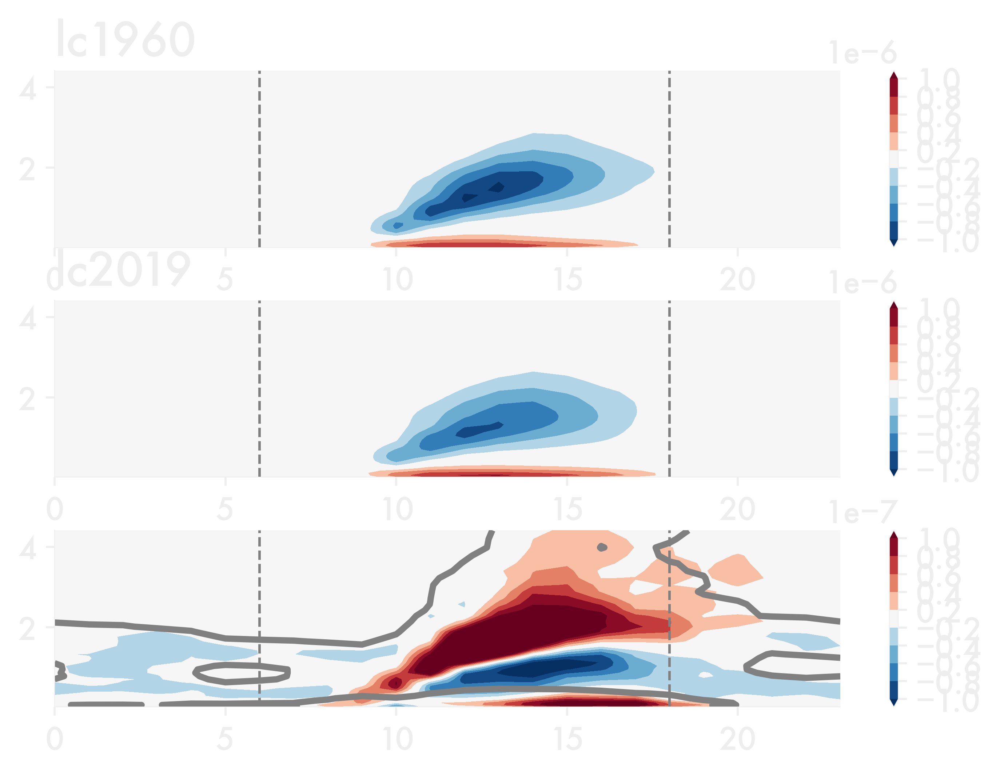

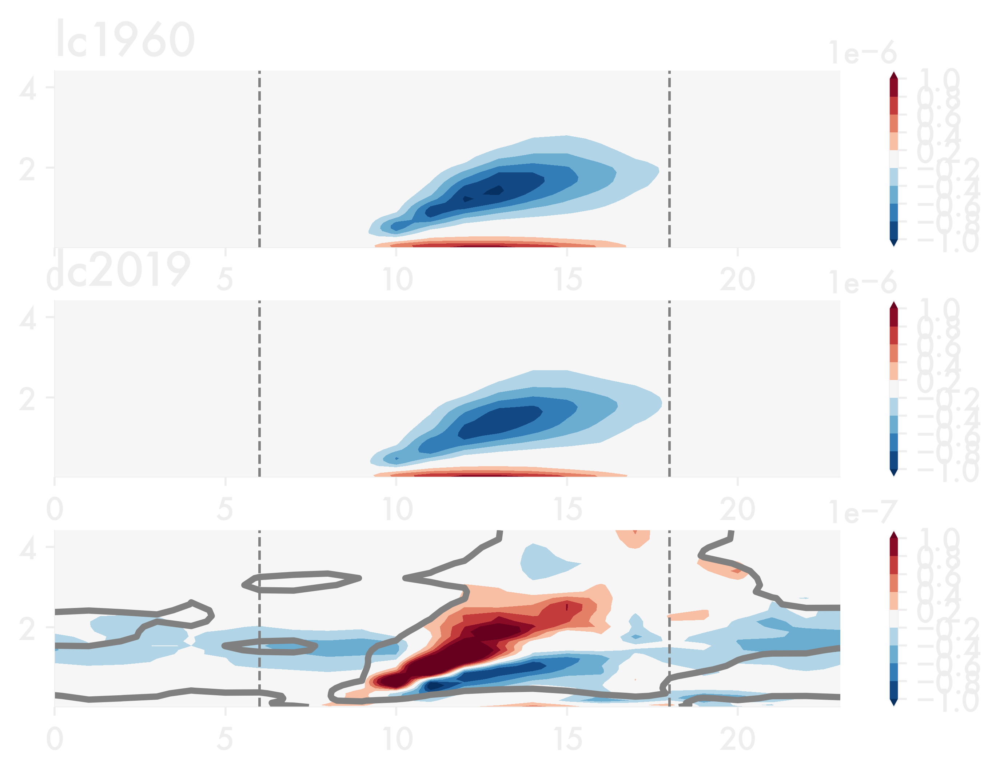

In [ ]:
for typ in ["land", "forest", "grass"]:
    fig, axes = plt.subplots(3, 1)

    for ax, ver in zip(axes, ["lc1960", "lc2019"]):
        ds = xr.open_dataset(
            f"/squall/gleung/borneolcc-analysis/moistureconv-{typ}-{ver}.nc",
            engine="h5netcdf",
        )
        ds = ds.rename({list(ds.keys())[0]: "q_conv"})

        local_time = [
            pd.to_datetime("2019-09-17 04:00")
            + dt.timedelta(hours=i.astype("float"))
            for i in ds.t.values
        ]

        ds = ds.assign(local_time=("t", local_time))
        ds = ds.groupby(ds.local_time.dt.hour).mean()

        if ver == "lc1960":
            diff = ds.copy()
        else:
            diff = ds - diff

        c = ax.contourf(
            ds.hour,
            alt[1 : len(ds.z) + 1] / 1000,
            ds.q_conv.T*1000,
            cmap="RdBu_r",
            norm=mcolors.TwoSlopeNorm(vcenter=0),
            levels=[l for l in np.linspace(-1e-3, 1e-3, 11) if l != 0],
            extend="both",
        )
        plt.colorbar(c, ax=ax)

        ax.set_title(ver)

    c = axes[-1].contourf(
        ds.hour,
        alt[1 : len(ds.z) + 1] / 1000,
        diff.q_conv.*T*1000,
        cmap="RdBu_r",
        norm=mcolors.TwoSlopeNorm(vcenter=0),
        levels=[l for l in np.linspace(-1e-7, 1e-7, 11) if l != 0],
        extend="both",
    )
    axes[-1].contour(
        ds.hour,
        alt[1 : len(ds.z) + 1] / 1000,
        ds.q_conv.T,
        levels=[0],
        colors="gray",
    )

    plt.colorbar(c, ax=axes[-1])

    for ax in axes:
        ax.axvline(6, ls="--", lw=1, color="gray")
        ax.axvline(18, ls="--", lw=1, color="gray")
    """
    for ax in axes:
        ax.set_ylim(0, 1)

        for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
            for t in [" 06:00", " 18:00"]:
                ax.axvline(pd.to_datetime(d + t), color="gray")

        ax.tick_params(axis="x", labelrotation=45)"""

    plt.show()
    plt.close("all")

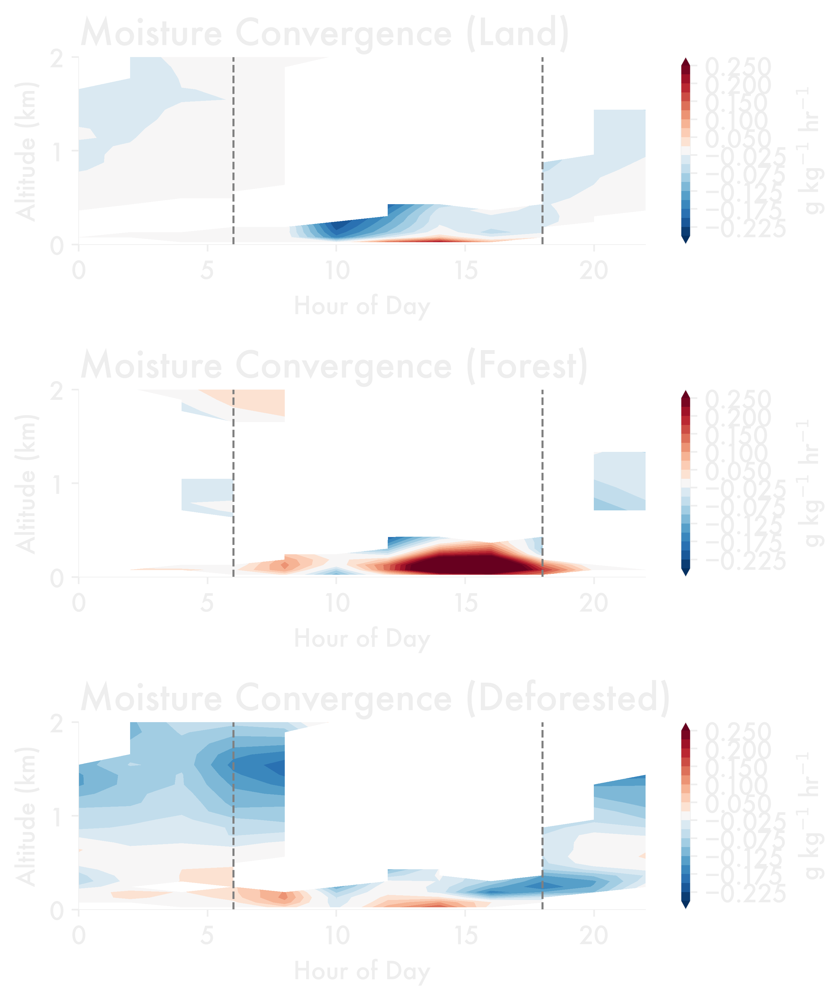

In [520]:
fig, axes = plt.subplots(3, 1, figsize=(6, 7))

for ax, typ, title in zip(
    axes,
    ["land", "forest", "grass"],
    [
        "Moisture Convergence (Land)",
        "Moisture Convergence (Forest)",
        "Moisture Convergence (Deforested)",
    ],
):
    ax.set_title(title)

    for ver in ["lc1960", "lc2019"]:
        ds = xr.open_dataset(
            f"/squall/gleung/borneolcc-analysis/moistureconv-{typ}-{ver}.nc",
            engine="h5netcdf",
        )
        ds = ds.rename({list(ds.keys())[0]: "q_conv"})

        local_time = [
            pd.to_datetime("2019-09-17 04:00")
            + dt.timedelta(hours=i.astype("float"))
            for i in ds.t.values
        ]

        ds = ds.assign(local_time=("t", local_time))
        ds = ds.groupby(ds.local_time.dt.hour // 2).mean()

        if ver == "lc1960":
            diff = ds.copy()
        else:
            diff = ds - diff

    c = ax.contourf(
        ds.hour * 2,
        alt[1 : len(ds.z) + 1] / 1000,
        diff.q_conv.where(ds.q_conv >= -0.1e-7).T * 1000 * 3600,
        cmap="RdBu_r",
        norm=mcolors.TwoSlopeNorm(vcenter=0),
        levels=[l for l in np.linspace(-0.25, 0.25, 21) if l != 0],
        extend="both",
    )

    """ax.contour(
        ds.hour * 2,
        alt[1 : len(ds.z) + 1] / 1000,
        ds.q_conv.T,
        levels=[0],
        colors="gray",
        linewidths=0.5,
    )"""

    plt.colorbar(c, ax=ax, label="g kg$^{-1}$ hr$^{-1}$")

for ax in axes:
    ax.axvline(6, ls="--", lw=1, color="gray")
    ax.axvline(18, ls="--", lw=1, color="gray")

    ax.set_ylim(0, 2)
    ax.set_ylabel("Altitude (km)")
    ax.set_xlabel("Hour of Day")

"""
for ax in axes:
    ax.set_ylim(0, 1)

    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        for t in [" 06:00", " 18:00"]:
            ax.axvline(pd.to_datetime(d + t), color="gray")

    ax.tick_params(axis="x", labelrotation=45)"""

plt.tight_layout()
plt.savefig("/squall/gleung/borneolcc-figures/moistureconv-conv only.png")
plt.show()
plt.close("all")

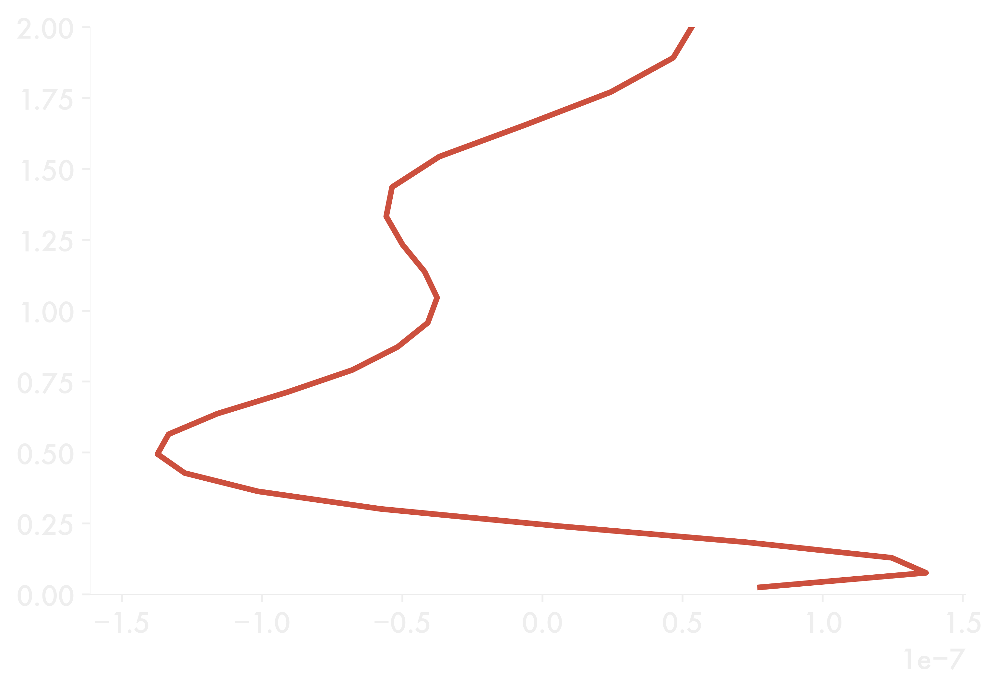

In [545]:
typ = "forest"
for ver, col in zip(["lc1960", "lc2019"], [lcol, red]):
    ds = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/moistureconv-{typ}-{ver}.nc",
        engine="h5netcdf",
    )
    ds = ds.rename({list(ds.keys())[0]: "q_conv"})

    local_time = [
        pd.to_datetime("2019-09-17 04:00")
        + dt.timedelta(hours=i.astype("float"))
        for i in ds.t.values
    ]

    ds = ds.assign(local_time=("t", local_time))

    ds = ds.where((ds.local_time.dt.hour <= 10) & (ds.local_time.dt.hour >= 6))

    plt.plot(ds.mean(dim="t").q_conv, alt[1 : len(ds.z) + 1] / 1000, color=col)

    plt.ylim(0, 2)

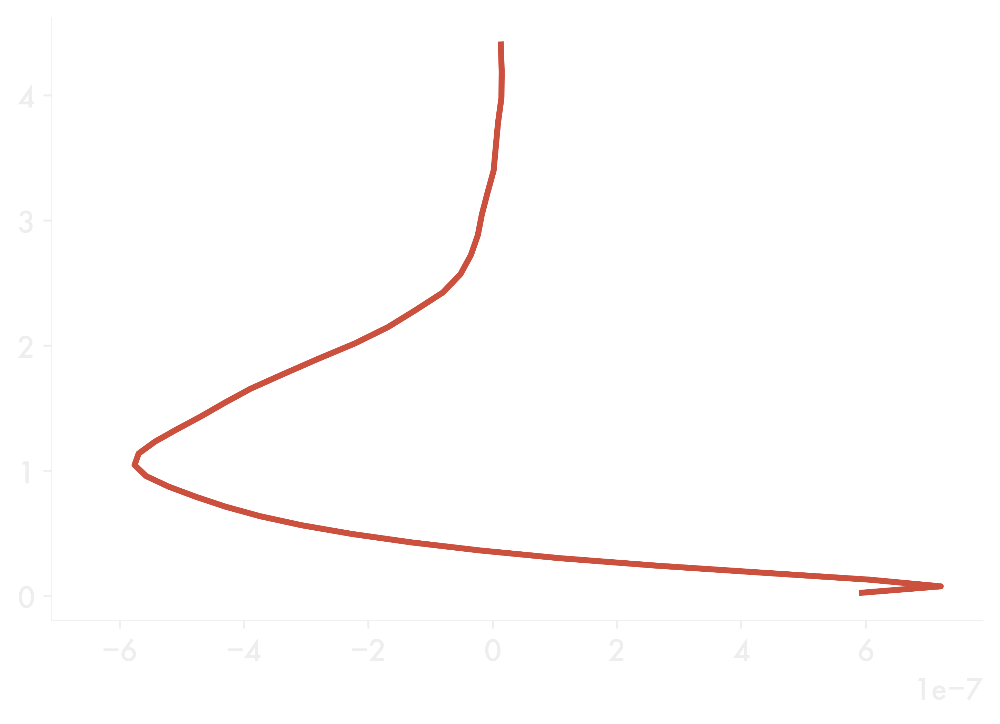

In [541]:
typ = "forest"
for ver, col in zip(["lc1960", "lc2019"], [lcol, red]):
    ds = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/moistureconv-{typ}-{ver}.nc",
        engine="h5netcdf",
    )
    ds = ds.rename({list(ds.keys())[0]: "q_conv"})

    local_time = [
        pd.to_datetime("2019-09-17 04:00")
        + dt.timedelta(hours=i.astype("float"))
        for i in ds.t.values
    ]

    ds = ds.assign(local_time=("t", local_time))

    ds = ds.where((ds.local_time.dt.hour >= 10) & (ds.local_time.dt.hour <= 13))

    plt.plot(ds.mean(dim="t").q_conv, alt[1 : len(ds.z) + 1] / 1000, color=col)

# TKE

TypeError: Length of x (73) must match number of columns in z (24)

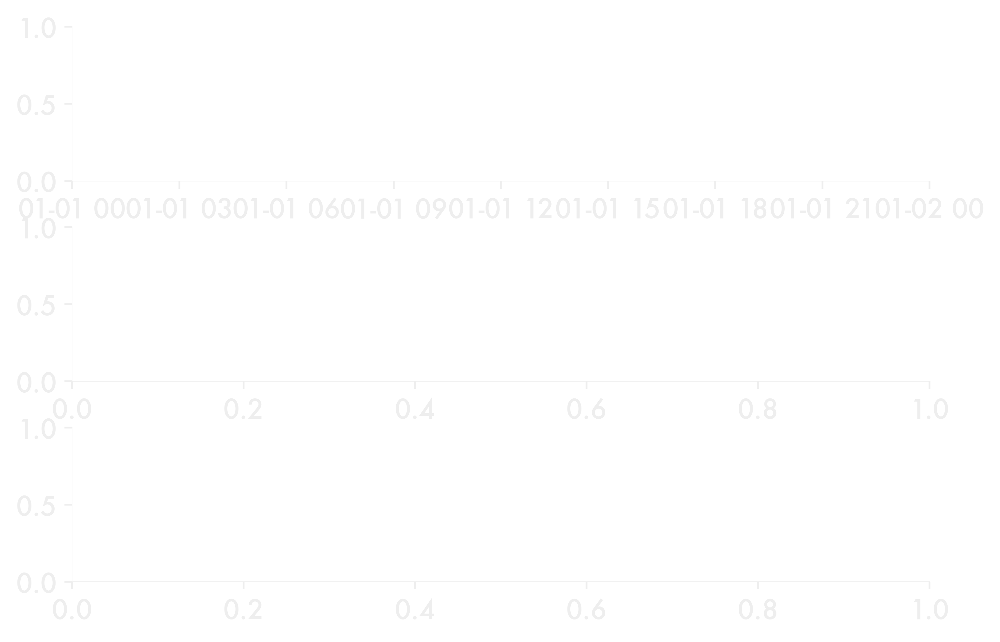

In [467]:
fig, axes = plt.subplots(3, 1)

for ax, ver in zip(axes, ["lc1960", "lc2019"]):
    ds = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/moistureconv-grass-{ver}.nc",
        engine="h5netcdf",
    )
    ds = ds.rename({list(ds.keys())[0]: "q_conv"})

    local_time = [
        pd.to_datetime("2019-09-17 04:00")
        + dt.timedelta(hours=i.astype("float"))
        for i in ds.t.values
    ]

    ds = ds.assign(local_time=("t", local_time))

    ds = ds.groupby(ds.local_time.dt.hour).mean()

    if ver == "lc1960":
        diff = ds.copy()
    else:
        diff = ds - diff

    c = ax.contourf(
        local_time,
        alt[1 : len(ds.z) + 1] / 1000,
        ds.q_conv.T,
        cmap="RdBu_r",
        norm=mcolors.TwoSlopeNorm(vcenter=0),
        levels=[l for l in np.linspace(-1e-6, 1e-6, 11) if l != 0],
        extend="both",
    )
    plt.colorbar(c, ax=ax)

    ax.set_title(ver)

c = axes[-1].contourf(
    local_time,
    alt[1 : len(ds.z) + 1] / 1000,
    diff.q_conv.T,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[l for l in np.linspace(-1e-7, 1e-7, 11) if l != 0],
    extend="both",
)
axes[-1].contour(
    local_time,
    alt[1 : len(ds.z) + 1] / 1000,
    ds.q_conv.T,
    levels=[0],
    colors="gray",
)

plt.colorbar(c, ax=axes[-1])

for ax in axes:
    ax.set_ylim(0, 1)

    for t in [6, 18]:
        ax.axvline(t, color="gray")

    ax.tick_params(axis="x", labelrotation=45)

In [122]:
subver = "all"

blh_past = xr.open_dataset(
    f"{anaPath}/blh_{subver}_lc1960_rte.h5",
    engine="h5netcdf",
    chunks="auto",
).isel(t=slice(12 * 6, -1))

blh_pres = xr.open_dataset(
    f"{anaPath}/blh_{subver}_lc2019_rte.h5",
    engine="h5netcdf",
    chunks="auto",
).isel(t=slice(12 * 6, -1))

past_tke = xr.open_dataset(
    "/squall/gleung/borneolcc-analysis/tke-lc1960.nc",
    engine="h5netcdf",
    chunks="auto",
)

past_tke = past_tke.rename({list(past_tke.keys())[0]: "TKE"})
pres_tke = xr.open_dataset(
    "/squall/gleung/borneolcc-analysis/tke-lc2019.nc",
    engine="h5netcdf",
    chunks="auto",
)
pres_tke = pres_tke.rename({list(pres_tke.keys())[0]: "TKE"})

<>:18: SyntaxWarning: invalid escape sequence '\D'
<>:18: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_2878413/1905698592.py:18: SyntaxWarning: invalid escape sequence '\D'
  plt.colorbar(c, ax=axes[2], label="$\Delta$TKE (m$^2$ s$^{-2}$)")


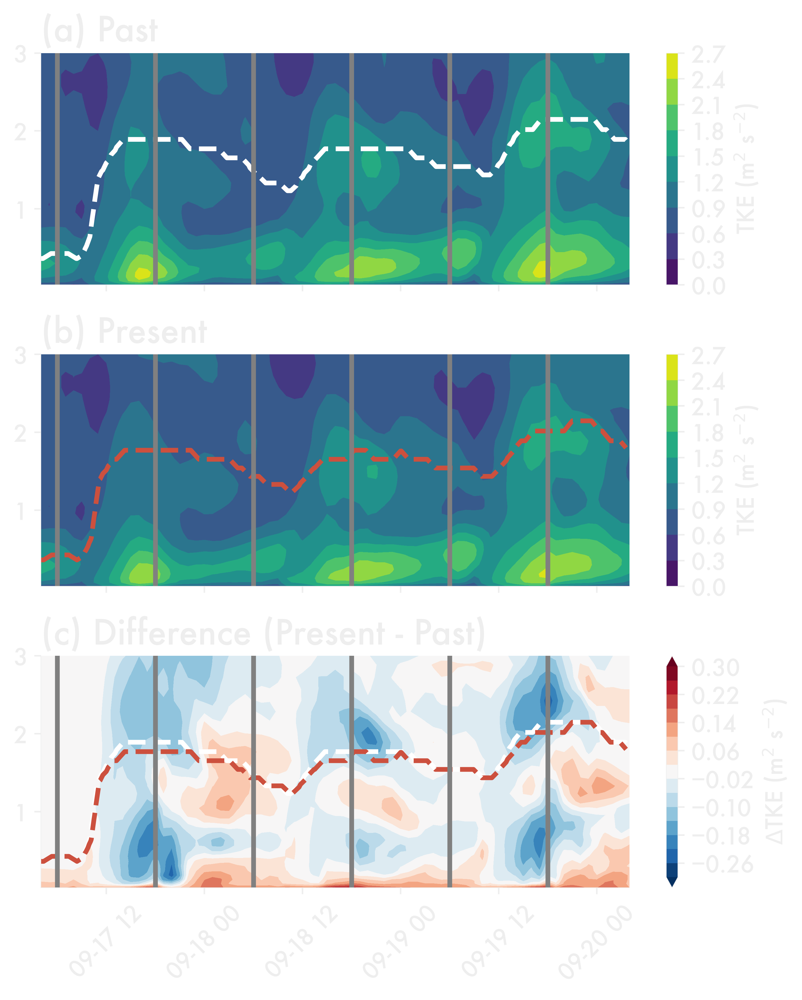

In [125]:
fig, axes = plt.subplots(3, 1, sharex=True, sharey=True, figsize=(6, 7))

c = axes[0].contourf(local_time, alt / 1000, past_tke.TKE.T)
plt.colorbar(c, ax=axes[0], label="TKE (m$^2$ s$^{-2}$)")

c = axes[1].contourf(local_time, alt / 1000, pres_tke.TKE.T)
plt.colorbar(c, ax=axes[1], label="TKE (m$^2$ s$^{-2}$)")

c = axes[2].contourf(
    local_time,
    alt / 1000,
    pres_tke.TKE.T - past_tke.TKE.T,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[l for l in np.linspace(-0.3, 0.3, 16) if l != 0],
    extend="both",
)
plt.colorbar(c, ax=axes[2], label="$\Delta$TKE (m$^2$ s$^{-2}$)")

axes[0].plot(blh_past.local_time, blh_past.BLH / 1000, color="white", ls="--")
axes[1].plot(blh_pres.local_time, blh_pres.BLH / 1000, color=red, ls="--")

axes[2].plot(blh_past.local_time, blh_past.BLH / 1000, color="white", ls="--")
axes[2].plot(blh_pres.local_time, blh_pres.BLH / 1000, color=red, ls="--")

for ax, title in zip(
    axes, ["(a) Past", "(b) Present", "(c) Difference (Present - Past)"]
):
    ax.set_ylim(25 / 1e3, 3)

    for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:
        for t in [" 06:00", " 18:00"]:
            ax.axvline(pd.to_datetime(d + t), color="gray")

    ax.tick_params(axis="x", labelrotation=45)
    ax.set_title(title)


plt.show()
plt.close("all")

In [124]:
past_tke = past_tke.assign(dz=("z", dz))
pres_tke = pres_tke.assign(dz=("z", dz))

In [148]:
past = past_tke.copy()
pres = pres_tke.copy()

In [241]:
blh_past

<xarray.Dataset>
Dimensions:     (t: 864, z: 105)
Coordinates:
  * t           (t) datetime64[ns] 2019-09-16T20:00:00 ... 2019-09-19T19:55:00
Dimensions without coordinates: z
Data variables:
    RV          (t, z) float64 dask.array<chunksize=(864, 105), meta=np.ndarray>
    local_time  (t) datetime64[ns] dask.array<chunksize=(864,), meta=np.ndarray>
    BLH         (t) float64 dask.array<chunksize=(864,), meta=np.ndarray>

In [ ]:
past = past.assign(
    BLH=("t", np.append(blh_past.BLH.isel(t=slice(0, -1, 12)).values, [np.nan]))
)

pres = pres.assign(
    BLH=("t", np.append(blh_pres.BLH.isel(t=slice(0, -1, 12)).values, [np.nan]))
)


pres = pres.assign(alt=("z", alt))
past = past.assign(alt=("z", alt))

past = past.sel(z=slice(1, 106))
pres = pres.sel(z=slice(1, 106))

pres = pres.assign(local_time=("t", local_time))
past = past.assign(local_time=("t", local_time))

ValueError: conflicting sizes for dimension 't': length 7561 on 'RV' and length 73 on {'t': 'TKE', 'z': 'TKE'}

In [190]:
past = past.assign(
    bl_tke=((past.TKE * past.dz).where(past.alt <= past.BLH)).sum(dim="z")
)
pres = pres.assign(
    bl_tke=((pres.TKE * pres.dz).where(pres.alt <= pres.BLH)).sum(dim="z")
)

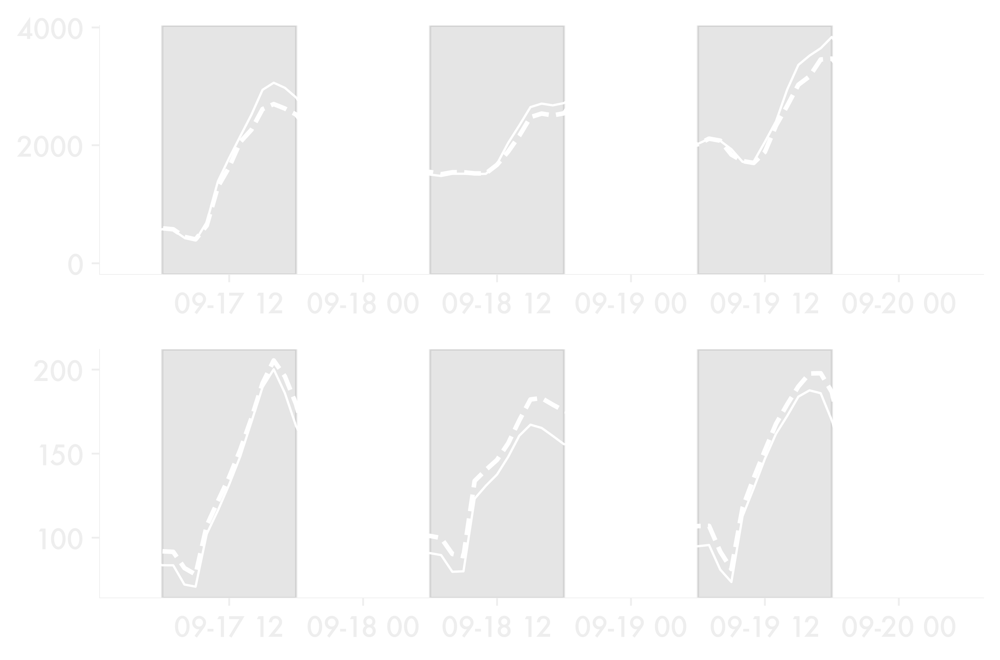

In [202]:
fig, axes = plt.subplots(2, 1)

axes[0].plot(local_time, past.bl_tke, color=lcol, lw=1)
axes[0].plot(local_time, pres.bl_tke, color=lcol, ls="--", lw=2)


axes[1].plot(
    local_time,
    (past.TKE * past.dz).sel(z=slice(0, 2)).sum(dim="z"),
    color=lcol,
    lw=1,
)
axes[1].plot(
    local_time,
    (pres.TKE * pres.dz).sel(z=slice(0, 2)).sum(dim="z"),
    color=lcol,
    ls="--",
    lw=2,
)


for d in ["2019-09-17", "2019-09-18", "2019-09-19"]:

    for ax in axes:
        ax.axvspan(
            pd.to_datetime(f"{d} 06:00"),
            pd.to_datetime(f"{d} 18:00"),
            zorder=0,
            color="gray",
            alpha=0.2,
        )

## Diurnal

In [207]:
past_d = past.groupby(past.local_time.dt.hour).mean()
pres_d = pres.groupby(pres.local_time.dt.hour).mean()

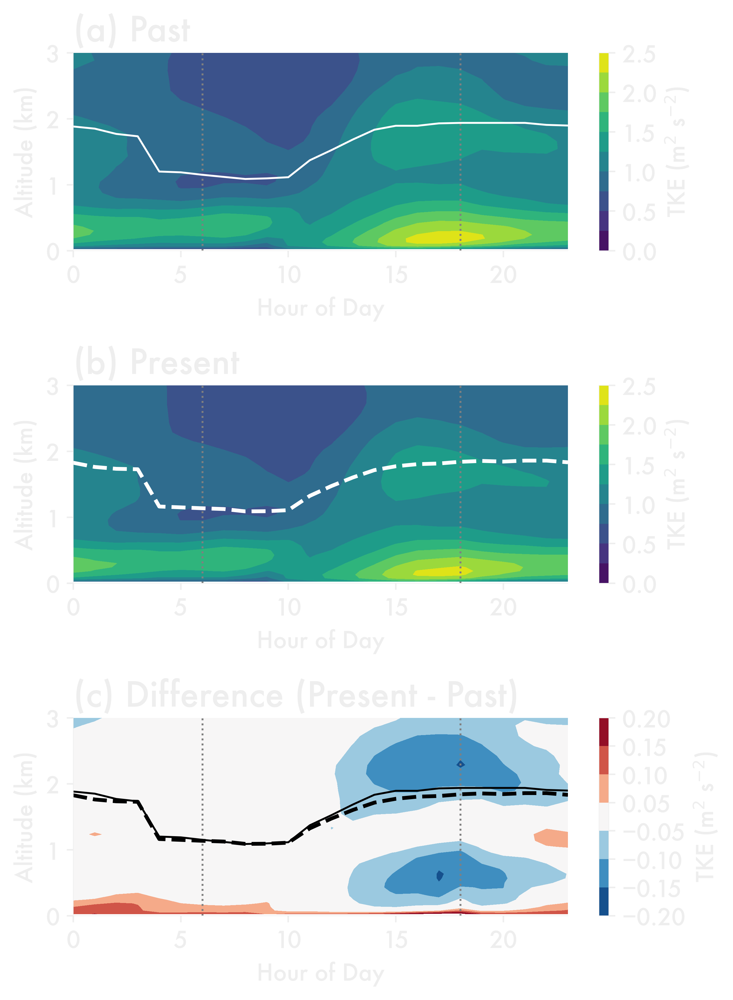

In [239]:
fig, axes = plt.subplots(3, 1, figsize=(5.5, 7.5))

for ax, ver, title in zip(
    axes,
    [past_d, pres_d, pres_d - past_d],
    ["(a) Past", "(b) Present", "(c) Difference (Present - Past)"],
):

    if "Diff" in title:
        cmap = "RdBu_r"
        norm = mcolors.TwoSlopeNorm(vcenter=0)
        levels = [l for l in np.linspace(-0.2, 0.2, 9) if l != 0]

    else:
        cmap = None
        norm = None
        levels = np.linspace(0, 2.5, 11)

    c = ax.contourf(
        ver.hour, alt[1:] / 1000, ver.TKE.T, cmap=cmap, levels=levels
    )

    plt.colorbar(c, ax=ax, label=("TKE (m$^2$ s$^{-2}$)"))

    ax.set_ylim(0, 3)

    ax.set_ylabel("Altitude (km)")
    ax.set_xlabel("Hour of Day")

    ax.axvline(6, ls=":", lw=1, color="gray")
    ax.axvline(18, ls=":", lw=1, color="gray")
    ax.set_title(title)

axes[0].plot(past_d.hour, past_d.BLH / 1000, color="white", lw=1)
axes[1].plot(pres_d.hour, pres_d.BLH / 1000, color="white", ls="--", lw=2)

axes[-1].plot(past_d.hour, past_d.BLH / 1000, color="black", lw=1)
axes[-1].plot(pres_d.hour, pres_d.BLH / 1000, color="black", ls="--", lw=2)

plt.tight_layout()
plt.show()
plt.close("all")

In [240]:
print(pres)

<xarray.Dataset>
Dimensions:     (t: 73, z: 105)
Dimensions without coordinates: t, z
Data variables:
    TKE         (t, z) float32 dask.array<chunksize=(73, 105), meta=np.ndarray>
    dz          (z) float64 50.0 52.0 54.08 56.24 ... 300.0 300.0 300.0 300.0
    ll_tke      (t) float64 dask.array<chunksize=(73,), meta=np.ndarray>
    BLH         (t) float64 363.0 406.0 427.5 427.5 ... 1.892e+03 1.872e+03 nan
    alt         (z) float64 24.75 75.75 128.8 ... 2.329e+04 2.359e+04 2.389e+04
    bl_tke      (t) float64 dask.array<chunksize=(73,), meta=np.ndarray>
    local_time  (t) datetime64[ns] 2019-09-17T04:00:00 ... 2019-09-20T04:00:00


## moistutre

In [256]:
past_rv_d = blh_past.groupby(blh_past.local_time.dt.hour).mean()
pres_rv_d = blh_pres.groupby(blh_pres.local_time.dt.hour).mean()

In [268]:
past = xr.open_dataset(
    f"{anaPath}/radprof/radprof_diurn_{subver}_lc1960_rte.h5",
    engine="h5netcdf",
    chunks="auto",
)[["RV"]]


pres = xr.open_dataset(
    f"{anaPath}/radprof/radprof_diurn_{subver}_lc2019_rte.h5",
    engine="h5netcdf",
    chunks="auto",
)[["RV"]]

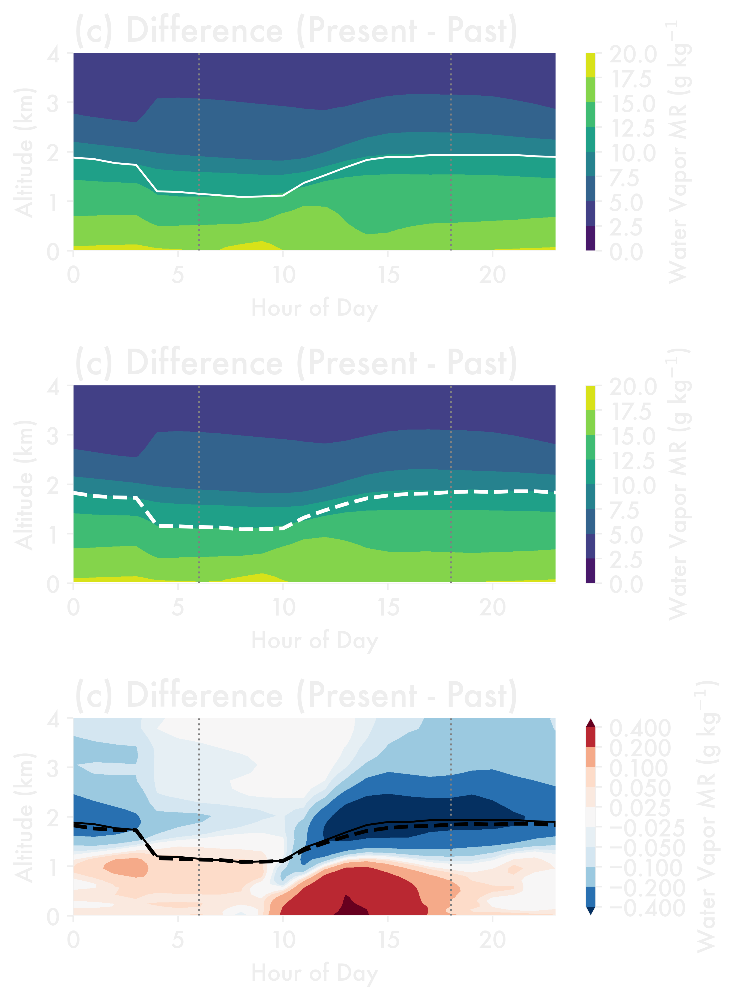

In [287]:
fig, axes = plt.subplots(3, 1, figsize=(5.5, 7.5))

for ax, title in zip(
    axes,
    ["(a) Past", "(b) Present", "(c) Difference (Present - Past)"],
):
    ax.set_title(title)
    ax.set_ylabel("Altitude (km)")
    ax.set_xlabel("Hour of Day")


c = axes[0].contourf(
    past.hour,
    alt[1:] / 1000,
    past.RV.T * 1000,
    levels=np.linspace(0, 20, 9),
)

plt.colorbar(c, ax=axes[0], label="Water Vapor MR (g kg$^{-1}$")
c = axes[1].contourf(
    pres.hour,
    alt[1:] / 1000,
    pres.RV.T * 1000,
    levels=np.linspace(0, 20, 9),
)
plt.colorbar(c, ax=axes[1], label=("Water Vapor MR (g kg$^{-1}$)"))
c = axes[2].contourf(
    pres.hour,
    alt[1:] / 1000,
    (pres.RV - past.RV).T * 1000,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[-0.4, -0.2, -0.1, -0.05, -0.025, 0.025, 0.05, 0.1, 0.2, 0.4],
    extend="both",
)
plt.colorbar(c, ax=axes[2], label=("Water Vapor MR (g kg$^{-1}$)"))

for ax in axes:
    ax.set_ylim(0, 4)

    ax.axvline(6, ls=":", lw=1, color="gray")
    ax.axvline(18, ls=":", lw=1, color="gray")
    ax.set_title(title)

axes[0].plot(past_d.hour, past_d.BLH / 1000, color="white", lw=1)
axes[1].plot(pres_d.hour, pres_d.BLH / 1000, color="white", ls="--", lw=2)

axes[-1].plot(past_d.hour, past_d.BLH / 1000, color="black", lw=1)
axes[-1].plot(pres_d.hour, pres_d.BLH / 1000, color="black", ls="--", lw=2)

plt.tight_layout()
plt.show()
plt.close("all")

In [295]:
ds = xr.open_dataset(
    f"/squall/gleung/borneolcc-analysis/moistureconv-land-lc1960.nc",
    engine="h5netcdf",
)
ds = ds.rename({list(ds.keys())[0]: "q_conv"})

past_q = ds.copy()

past_q = past_q.assign(local_time=("t", local_time))


ds = xr.open_dataset(
    f"/squall/gleung/borneolcc-analysis/moistureconv-land-lc2019.nc",
    engine="h5netcdf",
)
ds = ds.rename({list(ds.keys())[0]: "q_conv"})

pres_q = ds.copy()

pres_q = pres_q.assign(local_time=("t", local_time))

local_time = [
    pd.to_datetime("2019-09-17 04:00") + dt.timedelta(hours=i.astype("float"))
    for i in ds.t.values
]

pres_q = pres_q.groupby(pres_q.local_time.dt.hour).mean()
past_q = past_q.groupby(past_q.local_time.dt.hour).mean()

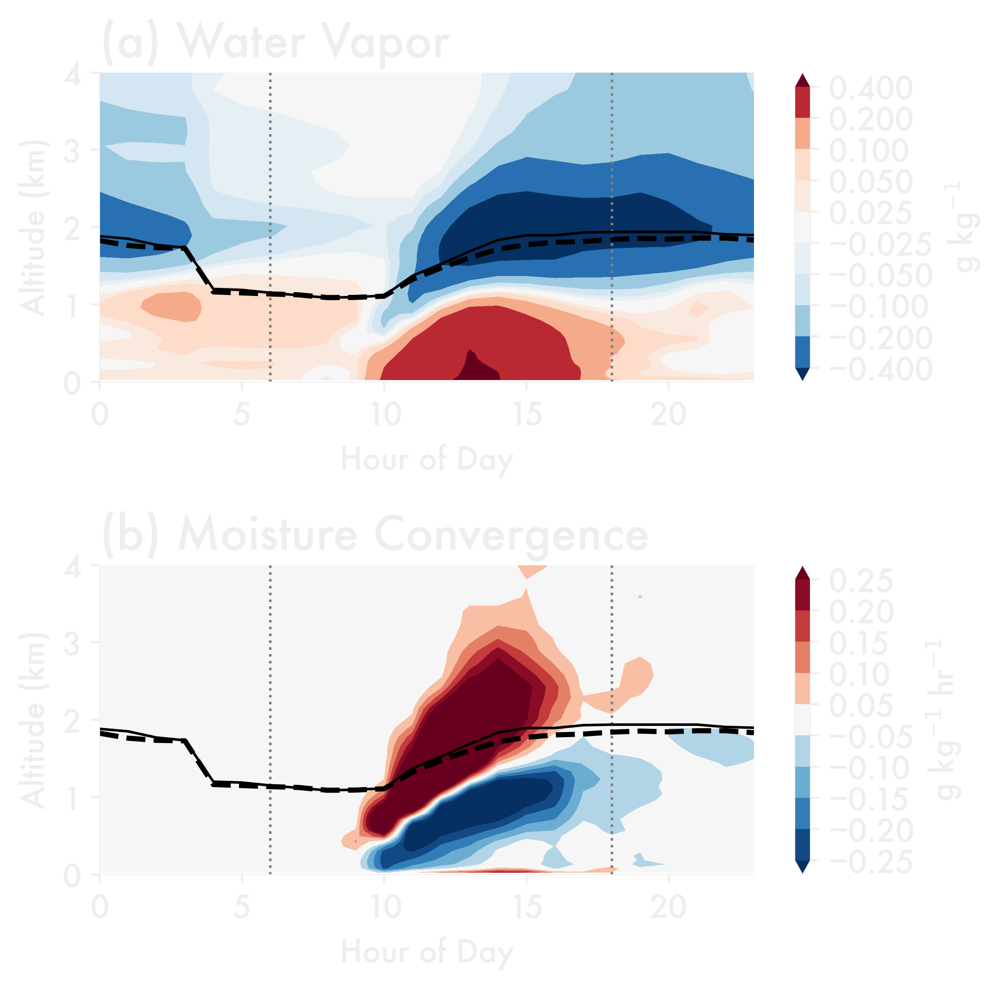

In [306]:
fig, axes = plt.subplots(2, 1, figsize=(5.5, 5.5))

for ax, title in zip(
    axes,
    ["(a) Water Vapor", "(b) Moisture Convergence"],
):
    ax.set_title(title)

c = axes[0].contourf(
    pres.hour,
    alt[1:] / 1000,
    (pres.RV - past.RV).T * 1000,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[-0.4, -0.2, -0.1, -0.05, -0.025, 0.025, 0.05, 0.1, 0.2, 0.4],
    extend="both",
)
plt.colorbar(c, ax=axes[0], label=("g kg$^{-1}$"))

c = axes[1].contourf(
    pres.hour,
    alt[1 : len(past_q.z) + 1] / 1000,
    (pres_q.q_conv - past_q.q_conv).T * 1000 * 3600,
    cmap="RdBu_r",
    norm=mcolors.TwoSlopeNorm(vcenter=0),
    levels=[l for l in np.linspace(-0.25, 0.25, 11) if l != 0],
    extend="both",
)
plt.colorbar(c, ax=axes[1], label=("g kg$^{-1}$ hr$^{-1}$"))

for ax in axes:
    ax.set_ylim(0, 4)

    ax.axvline(6, ls=":", lw=1, color="gray")
    ax.axvline(18, ls=":", lw=1, color="gray")
    ax.set_ylabel("Altitude (km)")
    ax.set_xlabel("Hour of Day")

    ax.plot(past_d.hour, past_d.BLH / 1000, color="black", lw=1)
    ax.plot(pres_d.hour, pres_d.BLH / 1000, color="black", ls="--", lw=2)

plt.tight_layout()
plt.show()
plt.close("all")

In [ ]:
ds = xr.open_dataset(
        f"/squall/gleung/borneolcc-analysis/moistureconv-grass-{ver}.nc",
        engine="h5netcdf",
    )
    ds = ds.rename({list(ds.keys())[0]: "q_conv"})

    local_time = [
        pd.to_datetime("2019-09-17 04:00")
        + dt.timedelta(hours=i.astype("float"))
        for i in ds.t.values
    ]

# Condensate Plan View

In [272]:
def add_dz(ds):
    ds = ds.assign(dz=("z", dz[1:]))
    return ds


def add_variables(ds):
    ds = ds.assign(
        {
            "tcon": ds.RCP + ds.RPP + ds.RSP,
        }
    )

    ds = ds.assign(intcon=calculate_intcon(ds.tcon, ds.dz))

    ds = ds[["intcon"]]
    return ds


def rename_dims(ds, dims=rams_dims_lite):
    return ds.rename_dims(dict([(d, dims.get(d)) for d in ds.dims]))


rams_dims_lite.update({"t": "time"})


def calculate_intcon(tcon, dz):
    intcon = ((1000 / 997) * (dn0 * tcon * dz).sum(dim="z")) + 1e-5

    return intcon

In [257]:
dn0 = (
    get_rams_output(
        "/squall/gleung/borneolcc/lc1960/rte/a-A-2019-09-17-020000-g1.h5",
        ["DN0"],
    )
    .sel(p=20, y=20)
    .rename({"x": "z"})
).sel(z=slice(1, 106))

NameError: name 'p' is not defined

In [287]:
7 + 8

15

In [298]:
ds = get_rams_output(
    "/squall/gleung/borneolcc/lc1960/rte/a-L-2019-09-17-020000-g1.h5",
    variables=["RCP", "RSP", "RPP"],
    prep_tobac=True,
).sel(z=slice(1, 106))

In [299]:
ds = add_dz(ds)

In [300]:
ds = add_variables(ds)

In [301]:
ds = ds.compute()

/tmp/ipykernel_2903810/53929554.py:16: UserWarning: Adding colorbar to a different Figure <Figure size 3500x1500 with 4 Axes> than <Figure size 2000x2000 with 2 Axes> which fig.colorbar is called on.
  plt.colorbar(c, ax=ax, label="mm")


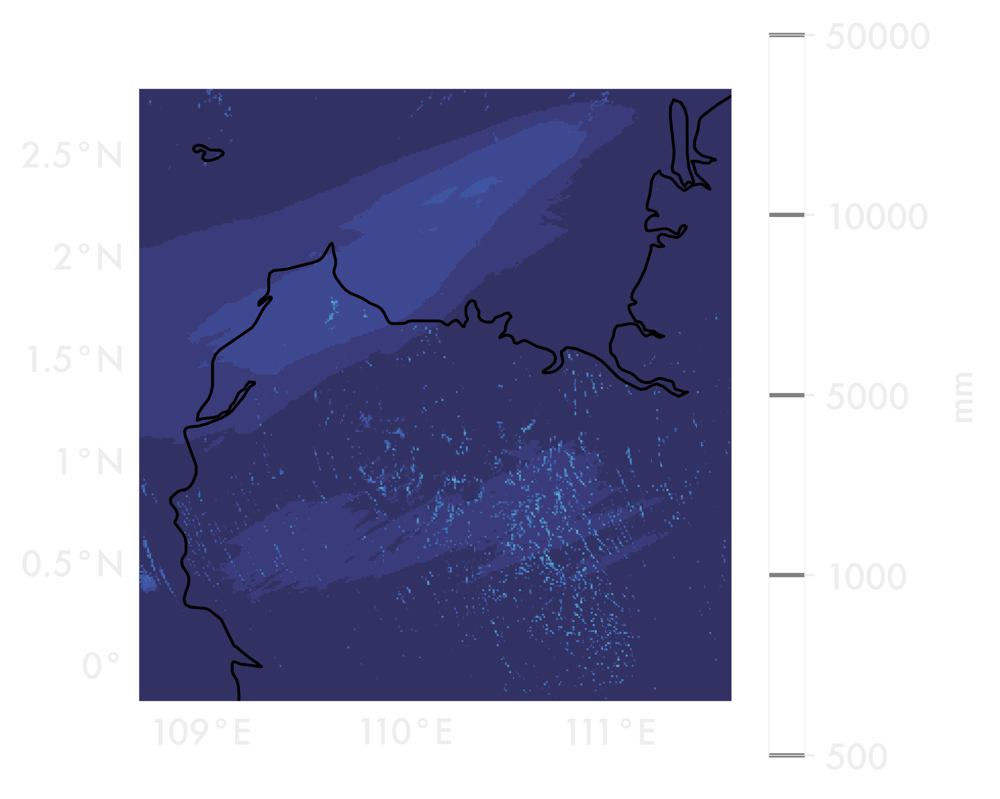

In [297]:
fig, ax = plt.subplots(
    1,
    1,
    figsize=(4, 4),
    subplot_kw={"projection": ccrs.PlateCarree()},
)

ax.pcolormesh(
    ds.lon,
    ds.lat,
    ds.intcon,
    cmap=cloud,
    norm=mcolors.LogNorm(vmin=1e-3, vmax=1e2),
    transform=ccrs.PlateCarree(),
)
plt.colorbar(c, ax=ax, label="mm")
ax.coastlines()
add_latlon(ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

plt.savefig("/squall/gleung/borneolcc-figures/day1-10am.png")
plt.show()
plt.close("all")

# Alternative diurnal cycle calculation

In [ ]:
past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]
yvar = "cellmax_CTH"
past["ybin"] = pd.cut(past[yvar], bins=alt[::5] / 1000)


num_past = past.groupby(
    ["ybin", past.local_time.dt.round("2h")]
).feature.count()
num_past = num_past.reset_index().pivot(
    index="local_time", columns="ybin", values="feature"
)
cths = [x.mid for x in num_past.columns.values]
num_past.columns = cths

pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]
pres["ybin"] = pd.cut(pres[yvar], bins=alt[::5] / 1000)
num_pres = pres.groupby(
    ["ybin", pres.local_time.dt.round("2h")]
).feature.count()
num_pres = num_pres.reset_index().pivot(
    index="local_time", columns="ybin", values="feature"
)
num_pres.columns = cths

d_past = num_past.groupby(num_past.index.hour).mean()
d_pres = num_pres.groupby(num_pres.index.hour).mean()
print(d_past)

/tmp/ipykernel_2903810/1983999889.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_pres = pres.groupby(


In [ ]:
fig, axes = plt.subplots(3, 1)

for ax, plot in zip(axes, [d_past, d_pres, d_pres - d_past]):
    if ax == axes[-1]:
        cmap = "RdBu_r"
        norm = mcolors.TwoSlopeNorm(vcenter=0)
        levels = [l for l in np.linspace(-1000, 1000, 21) if l != 0]
    else:
        cmap = None
        norm = None
        levels = np.linspace(0, 2e4, 11)

    c = ax.contourf(
        plot.index,
        plot.columns,
        plot.T,
        cmap=cmap,
        norm=norm,
        levels=levels,
        extend="both",
    )
    plt.colorbar(c, ax=ax)

plt.show()
plt.close("all")

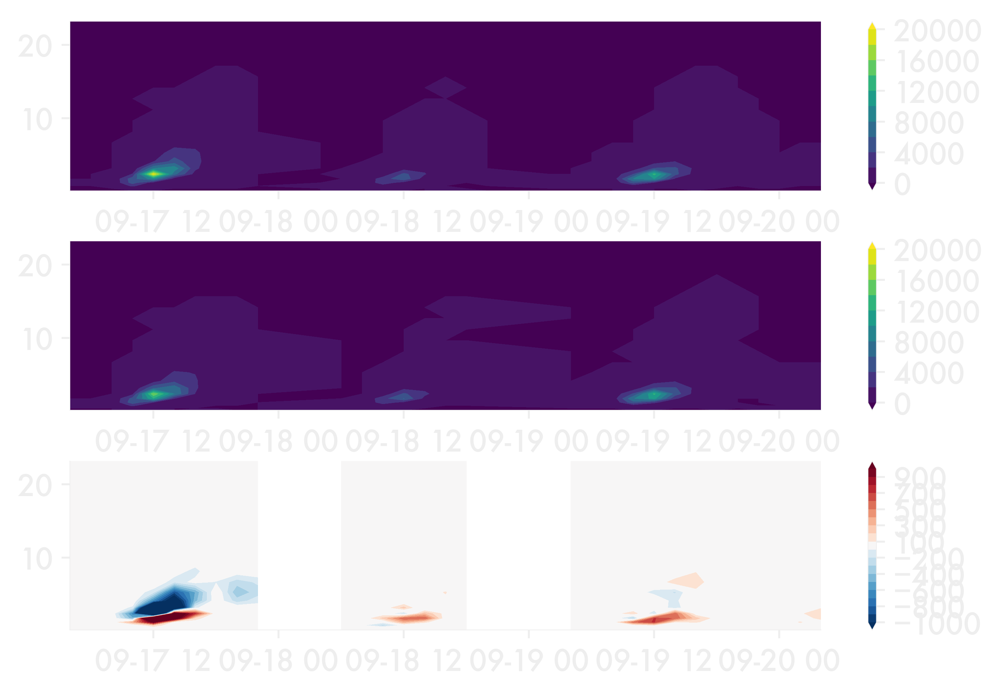

In [560]:
fig, axes = plt.subplots(3, 1)

for ax, plot in zip(axes, [num_past, num_pres, num_pres - num_past]):
    if ax == axes[-1]:
        cmap = "RdBu_r"
        norm = mcolors.TwoSlopeNorm(vcenter=0)
        levels = [l for l in np.linspace(-1000, 1000, 21) if l != 0]
    else:
        cmap = None
        norm = None
        levels = np.linspace(0, 2e4, 11)

    c = ax.contourf(
        plot.index,
        plot.columns,
        plot.T,
        cmap=cmap,
        norm=norm,
        levels=levels,
        extend="both",
    )
    plt.colorbar(c, ax=ax)

plt.show()
plt.close("all")

             0.10835    0.40250      0.76050      1.19650      1.72700   \
local_time                                                                
0            0.000000   0.000000     9.000000    76.000000    89.000000   
2            0.000000   0.000000    12.500000    73.500000   488.500000   
4            0.000000   0.000000    29.000000    39.500000   201.750000   
6            5.333333   1.333333    41.666667    17.333333    11.333333   
8            8.333333  10.333333    86.666667    55.333333   154.666667   
10          11.333333  78.333333  1362.000000  4282.000000  5459.000000   
12           0.000000  13.666667   171.333333  1218.333333  8201.666667   
14           0.000000   0.000000    38.000000   177.000000  1044.000000   
16           2.000000   2.666667    30.000000    42.000000   294.333333   
18           2.333333   0.000000    32.000000    18.666667    44.666667   
20           0.000000   0.000000     0.666667     6.333333     6.333333   
22           0.000000   0

In [567]:
import scipy.stats as stats

In [626]:
past = pd.read_parquet(f"{anaPath}/tobac/lc1960_rte/final_cloud_statistics.pq")

past = past[past.cell_BL_flag_init]
yvar = "cellmax_CTH"
past["ybin"] = pd.cut(past[yvar], bins=alt[::5] / 1000)

a_past = past.groupby(
    ["ybin", past.local_time.dt.round("2h")]
).cond_footprint.mean()
a_past = a_past.reset_index().pivot(
    index="local_time", columns="ybin", values="cond_footprint"
)
cths = [x.mid for x in a_past.columns.values]
a_past.columns = cths

pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]
pres["ybin"] = pd.cut(pres[yvar], bins=alt[::5] / 1000)
a_pres = pres.groupby(
    ["ybin", pres.local_time.dt.round("2h")]
).cond_footprint.mean()
a_pres = a_pres.reset_index().pivot(
    index="local_time", columns="ybin", values="cond_footprint"
)
a_pres.columns = cths

d_past = a_past.groupby(a_past.index.hour).mean()
d_pres = a_pres.groupby(a_pres.index.hour).mean()
print(d_past)

/tmp/ipykernel_2903810/4107335488.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  a_past = past.groupby(


            0.10835   0.40250      0.76050     1.19650     1.72700   \
local_time                                                            
0                NaN       NaN          NaN  252.862105  164.051798   
2                NaN       NaN   845.517857   22.934400   18.710272   
4                NaN       NaN   727.636242  238.837051   37.411782   
6           0.591136       NaN   355.598920   41.129385   18.176029   
8           1.735500  2.977105   288.577136  175.501940   24.636714   
10          0.199687  2.136775    11.776250    5.919822    5.783959   
12               NaN  0.209250     0.994432    2.283912    2.688621   
14               NaN       NaN     0.680526    1.203409    1.851135   
16          0.112500  0.393750     0.412500    1.400000    4.599164   
18               NaN       NaN     2.296286    6.213571   12.173108   
20               NaN       NaN          NaN   35.228182   35.464167   
22               NaN       NaN  1196.570769         NaN         NaN   

     

/tmp/ipykernel_2903810/4107335488.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  a_pres = pres.groupby(


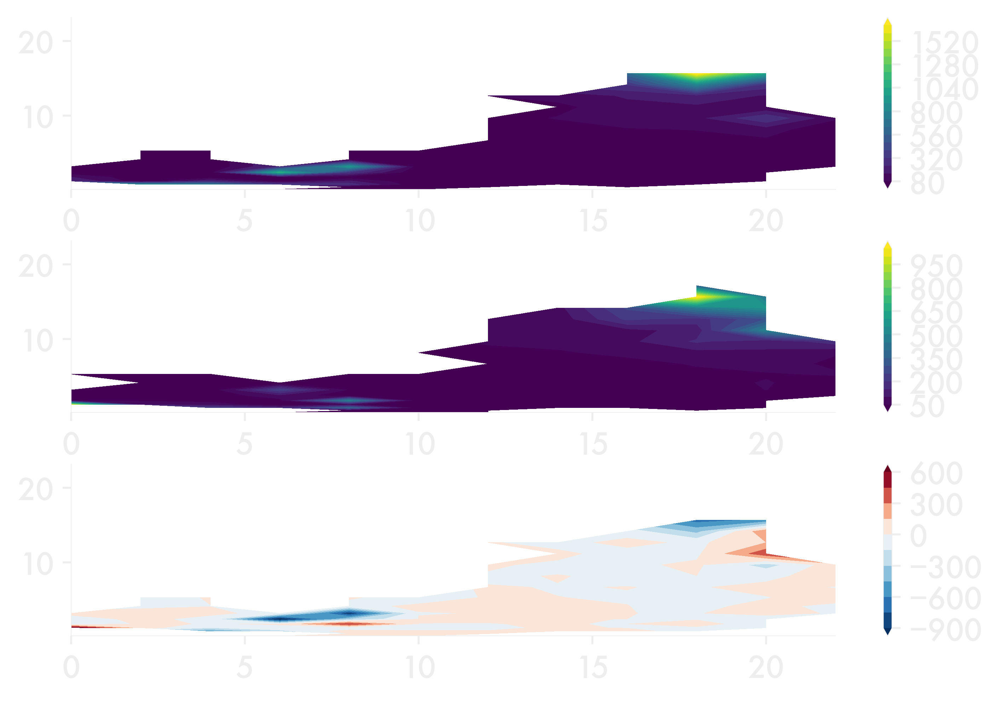

In [628]:
fig, axes = plt.subplots(3, 1)

for ax, plot in zip(axes, [d_past, d_pres, d_pres - d_past]):
    if ax == axes[-1]:
        cmap = "RdBu_r"
        norm = mcolors.TwoSlopeNorm(vcenter=0)
        levels = 11  # [l for l in np.linspace(-1000, 1000, 21) if l != 0]
    else:
        cmap = None
        norm = None
        levels = 21  # np.linspace(0, 2e4, 11)

    c = ax.contourf(
        plot.index,
        plot.columns,
        plot.T,
        cmap=cmap,
        norm=norm,
        levels=levels,
        extend="both",
    )
    plt.colorbar(c, ax=ax)

plt.show()
plt.close("all")

In [629]:
pvalues = pd.DataFrame(index=d_past.index, columns=cths)

for cth in cths:
    for hr in d_past.index:
        past_samp = a_past[cth]
        past_samp = past_samp[past_samp.index.hour == hr]

        pres_samp = a_pres[cth]
        pres_samp = pres_samp[pres_samp.index.hour == hr]

        if len(past_samp) != len(pres_samp):
            if len(past_samp) < len(pres_samp):
                missing = [t for t in pres_samp.index if t not in past_samp]
                past_samp = pd.concat(
                    [past_samp, pd.Series([0] * len(missing), index=missing)]
                ).sort_index()
            else:
                missing = [t for t in past_samp.index if t not in pres_samp]
                pres_samp = pd.concat(
                    [pres_samp, pd.Series([0] * len(missing), index=missing)]
                ).sort_index()

        pvalues.loc[hr, cth] = stats.ttest_rel(
            past_samp.values, pres_samp.values
        ).pvalue

/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/scipy/stats/_stats_py.py:1114: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/home/gleung/miniforge3/envs/borneolcc/lib/python3.12/site-packages/scipy/stats/_stats_py.py:1114: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


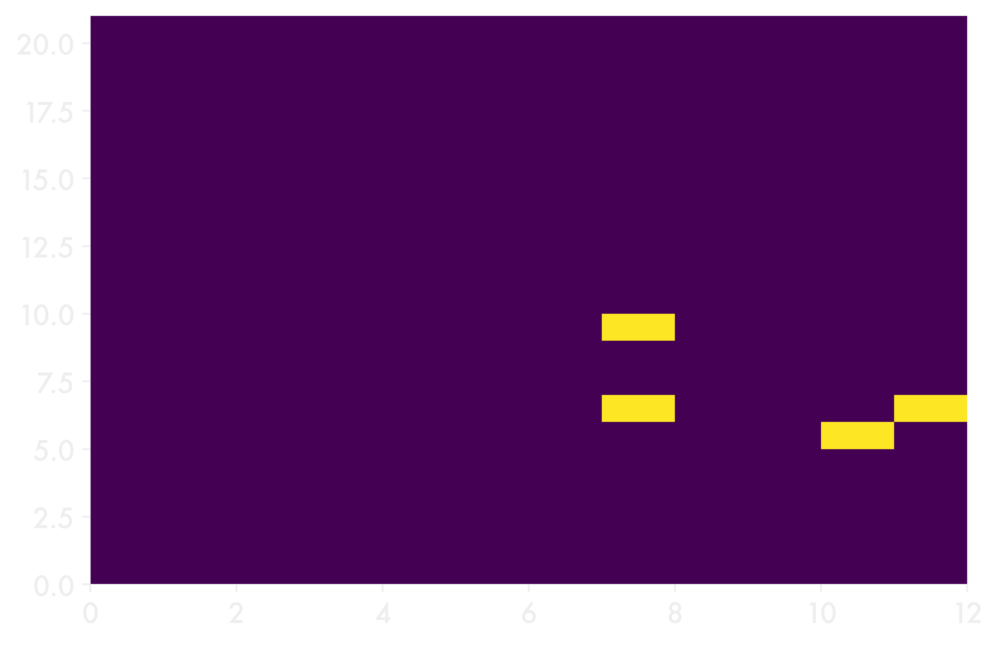

In [631]:
plt.pcolormesh(pvalues.T <= 0.05)

In [ ]:
for cth in cths[:1]:
    for hr in d_past.index[:1]:
        past_samp = past[(past.local_time.dt.round("2h").dt.hour == hr)]
        print(past_samp)
        past_samp = past_samp[[cth in y for y in past_samp.ybin]]

        pres_samp = pres[(pres.local_time.dt.round("2h").dt.hour == hr)]
        pres_samp = pres_samp[[cth in y for y in pres_samp.ybin]]

        print(past_samp, pres_samp)

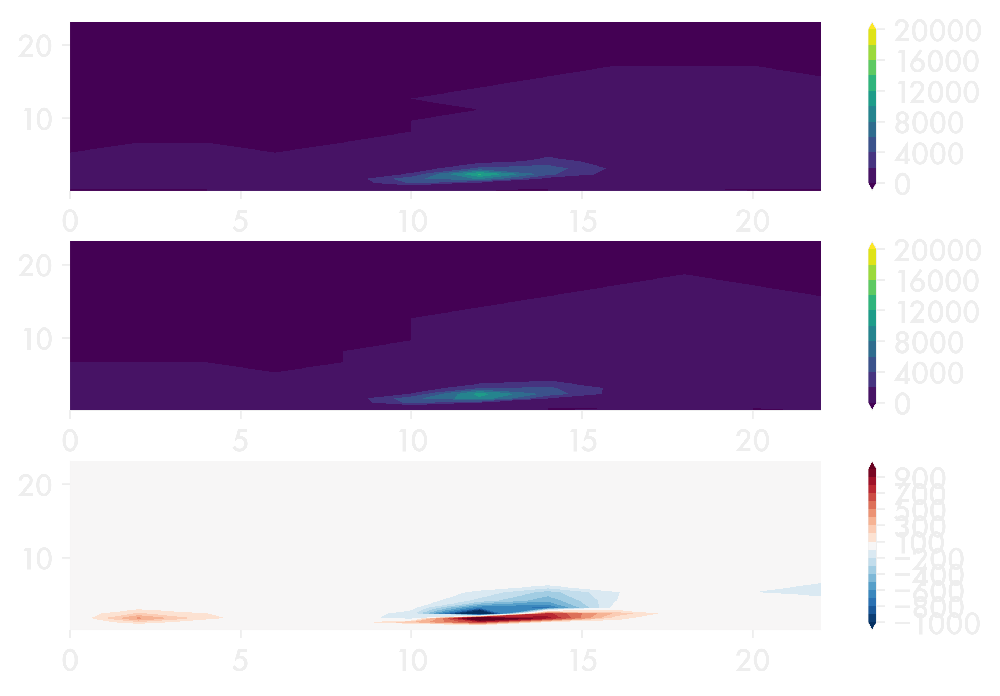

In [ ]:
a_past = past.groupby(
    ["ybin", past.local_time.dt.hour // 2]
).cond_footprint.sum()
a_past = a_past.reset_index().pivot(
    index="local_time", columns="ybin", values="cond_footprint"
)
a_past.columns = cths


pres = pd.read_parquet(f"{anaPath}/tobac/lc2019_rte/final_cloud_statistics.pq")

pres = pres[pres.cell_BL_flag_init]
# past = past[(past.local_time.dt.hour>=6) & (past.local_time.dt.hour<=18)]

pres["ybin"] = pd.cut(pres[yvar], bins=alt[::5] / 1000)
num_pres = pres.groupby(["ybin", pres.local_time.dt.hour // 2]).feature.count()

num_pres = num_pres.reset_index().pivot(
    index="local_time", columns="ybin", values="feature"
)
num_pres.columns = cths

a_pres = pres.groupby(
    ["ybin", pres.local_time.dt.hour // 2]
).cond_footprint.sum()
a_pres = a_pres.reset_index().pivot(
    index="local_time", columns="ybin", values="cond_footprint"
)
a_pres.columns = cths

## Each Time